---
# Group 2 - Property Click Prediction

[InnovatiCS](https://innovatics.ai/)    
Batch 18 - Data Science and Machne Learning  
June 2023 - January 2024

version 20231219

---

+ Members:
Name                    | Email                    | Phone        | TZ/City |
:-----------------------|:-------------------------|-------------:|:--------|
Aseel Al Soub (Nashmia) |                          | 214-394-3969 |CST      |
Sami Abdelghani         |                          | 626-241-0621 |PST      |
Muhammad Rehman         |                          | 734-620-1167 |         |
Fahad Ali               |                          | 513-227-1952 |         |
Edward Bujak            | Edward_Bujak@hotmail.com | 267-467-4312 |EST - Atlanta, GA |
+ Dropbox (original material):
    + https://www.dropbox.com/sh/l1zl4s7claxgi42/AADLlkpd-GJmyUR3uV8yV361a?dl=0
+ Google Drive (PPTX, code, data, etc.):
    + https://drive.google.com - CHANGE THIS


In [1]:
!pip install pyfiglet

In [2]:
import pyfiglet

members = (
    'Aseel Al Soub (Nashmia)',
    'Sami Abdelghani',
    'Muhammad Rehman',
    'Fahad Ali',
    'Edward Bujak',
)

for member in members:
    print(pyfiglet.figlet_format('- ' + member))
    # print(pyfiglet.figlet_format('-> ' + member))
    # print(pyfiglet.figlet_format(member))
    

            _                  _      _    _   ____              _     
           / \   ___  ___  ___| |    / \  | | / ___|  ___  _   _| |__  
 _____    / _ \ / __|/ _ \/ _ \ |   / _ \ | | \___ \ / _ \| | | | '_ \ 
|_____|  / ___ \\__ \  __/  __/ |  / ___ \| |  ___) | (_) | |_| | |_) |
        /_/   \_\___/\___|\___|_| /_/   \_\_| |____/ \___/ \__,_|_.__/ 
                                                                       
  ___   _           _               _     __  
 / / \ | | __ _ ___| |__  _ __ ___ (_) __ \ \ 
| ||  \| |/ _` / __| '_ \| '_ ` _ \| |/ _` | |
| || |\  | (_| \__ \ | | | | | | | | | (_| | |
| ||_| \_|\__,_|___/_| |_|_| |_| |_|_|\__,_| |
 \_\                                      /_/ 

         ____                  _ 
        / ___|  __ _ _ __ ___ (_)
 _____  \___ \ / _` | '_ ` _ \| |
|_____|  ___) | (_| | | | | | | |
        |____/ \__,_|_| |_| |_|_|
                                 
    _    _         _      _       _                 _ 
   / \  | |__   __| | ___|

> Project # 2 : Property Click Prediction
>
> This data project has been used in the recruitment process for the data science positions at NoBroker Data Sciences.
Properties form one of the most important data entity in nobroker data ecosystem. Properties receive interactions on NoBroker. One interaction is defined as one user requesting an owner contact on a property. A property can receive 0 to many interactions. This research will focus on studying and modelling the interactions received by properties.
>
> Assignment
>
> We are interested in studying and statistically modelling property interactions. We would like to have a predictive model that would say the number of interactions that a property would receive in a period. For simplicity let’s say we would like to predict the number of interactions that a property would receive within 3 days of its activation and 7 days of its activation. However, this part is open ended and you could bring your own time intervals into the problem. This is the part of your artistry in data science. In the end we need to profess the number of interactions that a certain kind of property would receive within a given number of days. We cannot do a time series forecasting here considering the limited amount of data that could be shared as a part of an assignment. You may clean the data, merge them, do an EDA, visualize, and build your model.
>
> -- from "Property Click Prediction.docx"

---
# ToDo / Investigate / Thoughts / Ideas

+ handle NaN
+ Feature Engineering
    + Feature Transformations
        + datetime - convert all datetime columns/features to datetime - TODO
        + encoding
            + categorical
                + ordinal - label encoding - WHAT COLUMNS? - TODO
                + nominal - OHE (dummy) - WHAT COLUMNS? - TODO
    + Feature Extractions
        + datetime - expand to hour (0..23), weekday (0..6), ... - TODO
        + type - expand to bedroom (1,2,3,4,5) and hall (0,1) ... - TODO
    + Discretize (Bin)
        + continuous daa --> categorical
        + WHAT COLUMNS? - TODO
    + Feature Importance
        + WHAT COLUMNS ARE IMPORTANT? - TODO
+ outliers
    + $\pm$1.5 IQR
    + z-score
+ more GIS stuff
+ machine learning algorihtms
    + regression
        + number of days to interact
        + number of intractions between start and end days after activation date
    + binary classification - MAYBE - TODO
        + interact within 3 days
        + interact within 7 days    


---
<a id='jupyter-notebook-environment'></a>
# Jupyter Notebook Environment

<div style="text-align:right">
    <a href="#top">top</a>
</div>

In [3]:
%%javascript
// Prevent scrolling within output cells
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [4]:
# multiple cell outputs in __repr__()
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

---
# Imports

In [5]:
# computation aand utils ---------------------
# for np.ndarray(), nd.linspace(), np.corrcoef(), np.polyfit(), np.poly1d(), ... methods
import numpy as np

# data manipulation, mangling, munging, ... ---------------------
import pandas as pd

# data visualization packages ---------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# GIS packages ---------------------
import folium   # GIS 

# utility packages/modules ---------------------
import os  # for getcwd() method
import ed_utils   # for head(), tree(), speak(), various GIS, ... methods
import ed_data_viz   # for many plot_() methods
import chime   # chime.info() - audible tone feedback, has multiple "themes"
# import cellbell   # cellbell.ding() - audible tone feedback

# time packages/modules ---------------------
# for elapsed time, consumed time in training and consumed time in
# fitting per machine learning model/lgorithm
from datetime import datetime
import time

# progress bar package ---------------------
from tqdm import tqdm   # progress bar

# statistics package ---------------------
from scipy.stats import shapiro   # for shapiro-Wilk normalcy test, for residual analysis

# machine learning models/utils ---------------------
# utils or regression modls/algorithms
from sklearn.model_selection import train_test_split

# TODO
# MORE HERE


## `ed_utils` Module

In [6]:
import importlib

importlib.reload(ed_utils)
ed_utils.__version__

<module 'ed_utils' from 'C:\\Users\\sabde\\OneDrive\\Desktop\\InnovatiCS - Batch 18\\B18.G2.Property Click Prediction.3\\B18.G2.Property Click Prediction\\14B\\14B\\ed_utils.py'>

'0.4.4'

In [7]:
print('ed_utils.__functions__')
print(ed_utils.column_str(ed_utils.__functions__))

print('-'*90)

print('ed_utils.__classes__')
print(ed_utils.column_str(ed_utils.__classes__))

print('-'*90)

print('ed_utils.__all__')
print(ed_utils.column_str(ed_utils.__all__))


ed_utils.__functions__
_inspector                     adder                          column_str                     
five_number_summary            five_number_summary2           is_this_life_as_we_know_it     
ls_l                           meaning_of_life                pp                             
print_function_annotations     speak                          tail                           
tree                           versions                       wc                             

------------------------------------------------------------------------------------------
ed_utils.__classes__
HiddenPrints            DummyContextManager     
------------------------------------------------------------------------------------------
ed_utils.__all__
_inspector                     adder                          column_str                     
five_number_summary            five_number_summary2           is_this_life_as_we_know_it     
ls_l                           meaning_of_life   

In [8]:
# !pip install playsound

In [9]:
# demo/test
# ed_utils.speak('By your command.')
# ed_utils.speak('Make it so.')
# ed_utils.speak('[3, 2, 1]')

# ed_utils.speak(range(3))   # range 0 3
# ed_utils.speak(list(range(3)))   # 0 1 2


In [10]:
try:
    # ed_utils.speak('Welcome.')
    ed_utils.speak()
    speak_on = True
except:
    speak_on = False

if speak_on:
    print('Software is working to be able to speak().')

# If you want to unconditionally supress speak statements throughout this code 
speak_on = False

print(f'{speak_on = }')


Software is working to be able to speak().
speak_on = False


In [11]:
# help(ed_utils)

In [12]:
# print(ed_utils.__history__)

## `ed_data_viz` Module

In [13]:
import importlib

importlib.reload(ed_data_viz)
ed_data_viz.__version__

<module 'ed_data_viz' from 'C:\\Users\\sabde\\OneDrive\\Desktop\\InnovatiCS - Batch 18\\B18.G2.Property Click Prediction.3\\B18.G2.Property Click Prediction\\14B\\14B\\ed_data_viz.py'>

'0.1.4'

In [14]:
print('ed_data_viz.__functions__')
print(ed_utils.column_str(ed_data_viz.__functions__))

print('-'*70)

print('ed_data_viz.__classes__')
print(ed_utils.column_str(ed_data_viz.__classes__))

print('-'*70)

print('ed_data_viz.__all__')
print(ed_utils.column_str(ed_data_viz.__all__))


ed_data_viz.__functions__
plot_bar_categorical     plot_histogram_          plot_histogram           
plot_pie                 versions                 
----------------------------------------------------------------------
ed_data_viz.__classes__

----------------------------------------------------------------------
ed_data_viz.__all__
plot_bar_categorical     plot_histogram_          plot_histogram           
plot_pie                 versions                 


In [15]:
# help(ed_data_viz)

In [16]:
print(ed_data_viz.__history__)



0.1.4 - 2023.12.19 - Edward Bujak - modified plot_bar_bar_categorical() function to call
                                        plt.tight_layout() before plt.savefig() to assure
                                        that saved images are not clipped
0.1.3 - 2023.12.17 - Edward Bujak - added plot_pie() function
0.1.2 - 2023.12.16 - Edward Bujak - added figsize, color, and alpha parameters to plot_histogram_() function
                                    added figsize, color, and alpha parameters to plot_histogram() function
                                    added color, and alpha parameters to plot_bar_categorical() function
0.1.1 - 2023.12.14 - Edward Bujak - added plot_histogram_() function
                                    added plot_histogram() function
                                    added versions() function
                                    changed plot_bar_bar_categorical() function to:
                                        take additional parameter to save as a

In [17]:
ed_data_viz.plot_bar_categorical.__version__

'0.3'

In [18]:
ed_utils.print_function_annotations(ed_data_viz.plot_bar_categorical)

category_value_dict          <class 'dict'>
title                        typing.Optional[str]
xlabel                       typing.Optional[str]
ylabel_on_left               typing.Optional[str]
ylabel_on_right              typing.Optional[str]
xtick_rotation               typing.Optional[int]
figsize                      typing.Optional[typing.Tuple[int, int]]
fontsize_top_of_bar          typing.Optional[int]
y_ticks_on_left_counts       typing.Optional[bool]
y_ticks_on_right_percentage  typing.Optional[bool]
bar_annotation_type          typing.Optional[str]
color                        typing.Optional[str]
alpha                        typing.Optional[float]
total                        typing.Optional[int]
file_path                    typing.Optional[str]
return                       None


In [19]:
for function in ed_data_viz.__functions__:
    fully_qualified_function = 'ed_data_viz.' + function
    # print(f'{fully_qualified_function = }')
    print('--- ', fully_qualified_function, '() ---', sep='')
    ed_utils.print_function_annotations(eval(fully_qualified_function))
    print('-'*80)

--- ed_data_viz.plot_bar_categorical() ---
category_value_dict          <class 'dict'>
title                        typing.Optional[str]
xlabel                       typing.Optional[str]
ylabel_on_left               typing.Optional[str]
ylabel_on_right              typing.Optional[str]
xtick_rotation               typing.Optional[int]
figsize                      typing.Optional[typing.Tuple[int, int]]
fontsize_top_of_bar          typing.Optional[int]
y_ticks_on_left_counts       typing.Optional[bool]
y_ticks_on_right_percentage  typing.Optional[bool]
bar_annotation_type          typing.Optional[str]
color                        typing.Optional[str]
alpha                        typing.Optional[float]
total                        typing.Optional[int]
file_path                    typing.Optional[str]
return                       None
--------------------------------------------------------------------------------
--- ed_data_viz.plot_histogram_() ---
s          typing.Union[pandas.core.s

## Versions

In [20]:
ed_utils.versions()

{'_inspector': '0.1',
 'adder': '0.1',
 'column_str': '0.6',
 'five_number_summary': '0.1',
 'five_number_summary2': '0.1',
 'is_this_life_as_we_know_it': '0.1',
 'ls_l': '0.5',
 'meaning_of_life': '0.1',
 'pp': '0.1',
 'print_function_annotations': '0.1',
 'speak': '0.4',
 'tail': '0.2',
 'tree': '0.6',
 'versions': '0.8',
 'wc': '0.4',
 'HiddenPrints': '0.3',
 'DummyContextManager': '0.2'}

In [21]:
ed_data_viz.versions()

{'plot_bar_categorical': '0.3',
 'plot_histogram_': '0.5',
 'plot_histogram': '0.5',
 'plot_pie': '0.1',
 'versions': '0.8'}

In [22]:
packages_str = 'numpy,pandas,matplotlib,seaborn,plotly,sklearn,ed_utils,ed_data_viz,\
tqdm,datetime,time,os,folium,playsound'
packages_str

'numpy,pandas,matplotlib,seaborn,plotly,sklearn,ed_utils,ed_data_viz,tqdm,datetime,time,os,folium,playsound'

In [23]:
packages_list = list(packages_str.split(','))
packages_list

['numpy',
 'pandas',
 'matplotlib',
 'seaborn',
 'plotly',
 'sklearn',
 'ed_utils',
 'ed_data_viz',
 'tqdm',
 'datetime',
 'time',
 'os',
 'folium',
 'playsound']

In [24]:
ed_data_viz.versions(packages_list)

{'numpy': '1.24.3',
 'pandas': '1.5.3',
 'matplotlib': '3.7.1',
 'seaborn': '0.12.2',
 'plotly': '5.9.0',
 'sklearn': '1.3.0',
 'ed_utils': '0.4.4',
 'ed_data_viz': '0.1.4',
 'tqdm': '4.65.0',
 'folium': '0.15.0'}

In [25]:
from watermark import watermark
 
# print(watermark(packages='pyspark,numpy,pandas'))   # no spaces within string
# print(watermark(packages='numpy,pandas,matplotlib,seaborn,plotly,sklearn,ed_utils,ed_data_viz,\
# tqdm,datetime,time,os,folium,playsound'))
print(watermark(packages=packages_str))

numpy      : 1.24.3
pandas     : 1.5.3
matplotlib : 3.7.1
seaborn    : 0.12.2
plotly     : 5.9.0
sklearn    : 1.3.0
ed_utils   : 0.4.4
ed_data_viz: 0.1.4
tqdm       : 4.65.0
datetime   : unknown
time       : unknown
os         : unknown
folium     : 0.15.0
playsound  : 1.3.0



In [26]:
print(watermark(packages="numpy,pandas,5,plotly,[],sklearn,['sympy'],ed_utils,ed_data_viz,\
tqdm,datetime,time,os,folium,playsound"))

numpy      : 1.24.3
pandas     : 1.5.3
5          : not installed
plotly     : 5.9.0
[]         : not installed
sklearn    : 1.3.0
['sympy']  : not installed
ed_utils   : 0.4.4
ed_data_viz: 0.1.4
tqdm       : 4.65.0
datetime   : unknown
time       : unknown
os         : unknown
folium     : 0.15.0
playsound  : 1.3.0



Leave empty to get software and hardware information.

In [27]:
from watermark import watermark

# print(watermark(packages='pyspark,numpy,pandas'))   # no spaces within string
print(watermark(packages=''))

Last updated: 2023-12-20T18:48:17.085307-08:00

Python implementation: CPython
Python version       : 3.11.4
IPython version      : 8.12.0

Compiler    : MSC v.1916 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 142 Stepping 12, GenuineIntel
CPU cores   : 8
Architecture: 64bit



---
# Directory

## cwd - current working directory

In [28]:
os.getcwd()

'C:\\Users\\sabde\\OneDrive\\Desktop\\InnovatiCS - Batch 18\\B18.G2.Property Click Prediction.3\\B18.G2.Property Click Prediction\\14B\\14B'

## tree

In [29]:
# tree works in Windows, macOS, unix, not Google Colab
# recursive
!tree

Folder PATH listing for volume OS
Volume serial number is A240-F140
C:.
+---.ipynb_checkpoints
+---data
+---__pycache__


In [30]:
ed_utils.tree()   # default path is here, the cwd

.
|-- 14B.B18.G2.Property Click Prediction.14B.ipynb
|-- Property Clicks Model Summary Data.csv
|-- Property Clicks interactions Within 0-7 Days.csv
|-- __pycache__
    |-- ed_data_viz.cpython-311.pyc
    `-- ed_utils.cpython-311.pyc
|-- data
    |-- property_data_set.csv
    |-- property_interactions.csv
    `-- property_photos.tsv
|-- ed_data_viz.py
|-- ed_utils.py
|-- temp.bathroom.png
|-- temp.distribution.bathroom.png
|-- temp.distribution.deposit.png
|-- temp.distribution.floor.png
|-- temp.distribution.gym.png
|-- temp.distribution.latitude.png
|-- temp.distribution.lift.png
|-- temp.distribution.longitude.png
|-- temp.distribution.pin_code.png
|-- temp.distribution.property_age.png
|-- temp.distribution.property_size.png
|-- temp.distribution.rent.png
|-- temp.distribution.swimming_pool.png
|-- temp.distribution.total_floor.png
|-- temp.map.html
|-- temp.test.mp3
|-- temp.type.png
|-- tempKNNResiduals.png
|-- tempKNNResidualsHistogram.png
|-- tempKNNboxplot.png
|-- tempKNNscatt

(2, 34)

# Data Files

The 3 data files are in the "data" directory/folder/subfolder. 

In [31]:
# tree works in Windows, macOS, unix, not Google Colab
# recursive
!tree data

Folder PATH listing for volume OS
Volume serial number is A240-F140
C:\USERS\SABDE\ONEDRIVE\DESKTOP\INNOVATICS - BATCH 18\B18.G2.PROPERTY CLICK PREDICTION.3\B18.G2.PROPERTY CLICK PREDICTION\14B\14B\DATA
No subfolders exist 



In [32]:
%ls -l data

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B\data

12/20/2023  10:35 AM    <DIR>          .
12/20/2023  06:35 PM    <DIR>          ..
12/20/2023  10:35 AM         4,726,585 property_data_set.csv
12/20/2023  10:35 AM         9,724,856 property_interactions.csv
12/20/2023  10:35 AM        35,466,940 property_photos.tsv
               3 File(s)     49,918,381 bytes
               2 Dir(s)  187,436,048,384 bytes free


File Not Found


In [33]:
ed_utils.ls_l("data")

ls_l() function currently not implemented in Windows.


In [34]:
ed_utils.ls_l("data")
# ls_l() function currently not implemented in Windows.

ls_l() function currently not implemented in Windows.


3 data files:
+ Property - property_data_set.csv
+ Photos - property_photos.tsv
+ Interactions - property_interactions.csv

## Constants

In [35]:
FILE_DATA_SET_PATH = r'data/property_data_set.csv'
FILE_PHOTOS_PATH = r'data/property_photos.tsv'
FILE_INTERACTIONS_PATH = r'data/property_interactions.csv'


In [36]:
# we could look at every file in the "data" subfolder,
# but let's only look at the source data files.
data_file_paths = (FILE_DATA_SET_PATH,
                   FILE_PHOTOS_PATH,
                   FILE_INTERACTIONS_PATH
                   )
data_file_paths


('data/property_data_set.csv',
 'data/property_photos.tsv',
 'data/property_interactions.csv')

Let's look at the first few lines of each of the data files in the "data" subfolder. 

In [37]:
for data_file_path in data_file_paths:
    print(data_file_path)
    ed_utils.head(data_file_path, num_lines=2)
    print('-'*90)

data/property_data_set.csv
property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,lease_type,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4,SEMI_FURNISHED,1,12.87617415,77.59657101,FAMILY,1,Hulimavu,BOTH,2,850,1,560076,12000,120000,AP
------------------------------------------------------------------------------------------
data/property_photos.tsv
"property_id"	"photo_urls"
"ff808081469fd6e20146a5af948000ea"	"[{\"title\":\"Balcony\",\"name\":\"IMG_20131006_120837.jpg\",\"imagesMap\":{\"original\":\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\",\"thumbnail\":\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\",\"medium\":\"ff808081469fd6e20146a5af948000ea_65149_medium.jpg\",\"large\":\"ff808081469fd6e20146a5af948000ea_65149_large.jpg\"},\"displayPic\":false},{\"title\":\"Bathroom\",\"name\":\"IMG_20131006_120734.jpg\",\"imag

---
# Data File 0 - Property - "property_data_set.csv'

> property_data_set.csv:  
> + Properties data containing various features like activation_date, BHK type, locality, property size, property age, rent, apartment type, etc.
> + `activation_date` is the date the property got activated on NoBroker.
> + Fields like `lift`, `gym`, etc are binary-valued - 1 indicating presence and 0 indicating absence.
> + All other fields are self-explanatory.
> + You may use these along with the rest of the data sets to engineer the features that you would use in your study.
>
> -- from "Property Click Prediction.docx"
+ Detailed description of each column/feature below in each specific column/feature analysis.

## Data

In [38]:
if speak_on:
    ed_utils.speak(f'reading property data set {FILE_DATA_SET_PATH}')
    # ed_utils.speak('reading property data set')
    

In [39]:
df_property = pd.read_csv(FILE_DATA_SET_PATH)
df_property

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,30-03-2017 21:42,1,0,2.0,SEMI_FURNISHED,0,12.942613,77.621890,...,0,Koramangala,BOTH,15,1200,0,560030.0,23000,200000,IF
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,30-03-2017 22:14,2,3,3.0,SEMI_FURNISHED,0,12.906331,77.591790,...,1,JP Nagar 5th Phase,BOTH,8,1310,0,560078.0,22000,125000,AP
28885,ff8081815b1fdda8015b2000369205fd,BHK2,30-03-2017 21:47,2,6,14.0,SEMI_FURNISHED,1,12.904363,77.526863,...,1,Subramanyapura,BOTH,0,975,1,NaN,12500,50000,AP
28886,ff8081815b200540015b20158b0103c9,BHK2,30-03-2017 22:30,1,1,2.0,SEMI_FURNISHED,0,12.938007,77.629097,...,0,Koramangala,TWO_WHEELER,5,600,0,560034.0,14000,80000,IF


In [40]:
df_property.shape

(28888, 21)

In [41]:
df_property.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF


In [42]:
df_property.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type'],
      dtype='object')

+ Look at the dtype of each column/feature.
+ Look at the missing values for each column/feature.

In [43]:
df_property.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28888 entries, 0 to 28887
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   property_id      28888 non-null  object 
 1   type             28888 non-null  object 
 2   activation_date  28888 non-null  object 
 3   bathroom         28888 non-null  int64  
 4   floor            28888 non-null  int64  
 5   total_floor      28845 non-null  float64
 6   furnishing       28888 non-null  object 
 7   gym              28888 non-null  int64  
 8   latitude         28888 non-null  float64
 9   longitude        28888 non-null  float64
 10  lease_type       28888 non-null  object 
 11  lift             28888 non-null  int64  
 12  locality         28888 non-null  object 
 13  parking          28888 non-null  object 
 14  property_age     28888 non-null  int64  
 15  property_size    28888 non-null  int64  
 16  swimming_pool    28888 non-null  int64  
 17  pin_code    

Look at the descriptive statistics.

In [44]:
df_property.describe()

,bathroom,floor,total_floor,gym,latitude,longitude,lift,property_age,property_size,swimming_pool,pin_code,rent,deposit
count,28888.000000,28888.000000,28845.000000,28888.000000,28888.000000,28888.000000,28888.000000,28888.000000,28888.000000,28888.000000,2.856300e+04,28888.000000,2.888800e+04
mean,1.795867,1.786659,3.518807,0.165951,12.957859,77.605186,0.279009,4.380539,966.338999,0.142585,5.615600e+05,14430.768797,1.233257e+05
std,0.778676,2.361768,3.362536,0.372043,0.219500,0.921003,0.448520,7.458914,619.390016,0.349655,8.979452e+04,9055.133718,1.255028e+05
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,1000.000000,0.000000e+00
25%,1.000000,0.000000,2.000000,0.000000,12.906324,77.563295,0.000000,0.000000,600.000000,0.000000,5.600400e+05,8000.000000,5.000000e+04
50%,2.000000,1.000000,3.000000,0.000000,12.953939,77.614568,0.000000,3.000000,900.000000,0.000000,5.600670e+05,12500.000000,1.000000e+05
75%,2.000000,2.000000,4.000000,0.000000,13.009369,77.669235,1.000000,6.000000,1200.000000,0.000000,5.600840e+05,18000.000000,1.500000e+05
max,22.000000,123.000000,38.000000,1.000000,21.176277,80.256293,1.000000,800.000000,40000.000000,1.000000,5.601000e+06,75000.000000,4.200000e+06


In [45]:
df_property.describe().shape

(8, 13)

In [46]:
df_property.describe().T

,count,mean,std,min,25%,50%,75%,max
bathroom,28888.0,1.795867,0.778676,0.0,1.000000,2.000000,2.000000,2.200000e+01
floor,28888.0,1.786659,2.361768,0.0,0.000000,1.000000,2.000000,1.230000e+02
total_floor,28845.0,3.518807,3.362536,0.0,2.000000,3.000000,4.000000,3.800000e+01
gym,28888.0,0.165951,0.372043,0.0,0.000000,0.000000,0.000000,1.000000e+00
latitude,28888.0,12.957859,0.219500,0.0,12.906324,12.953939,13.009369,2.117628e+01
longitude,28888.0,77.605186,0.921003,0.0,77.563295,77.614568,77.669235,8.025629e+01
lift,28888.0,0.279009,0.448520,0.0,0.000000,0.000000,1.000000,1.000000e+00
property_age,28888.0,4.380539,7.458914,0.0,0.000000,3.000000,6.000000,8.000000e+02
property_size,28888.0,966.338999,619.390016,0.0,600.000000,900.000000,1200.000000,4.000000e+04
swimming_pool,28888.0,0.142585,0.349655,0.0,0.000000,0.000000,0.000000,1.000000e+00


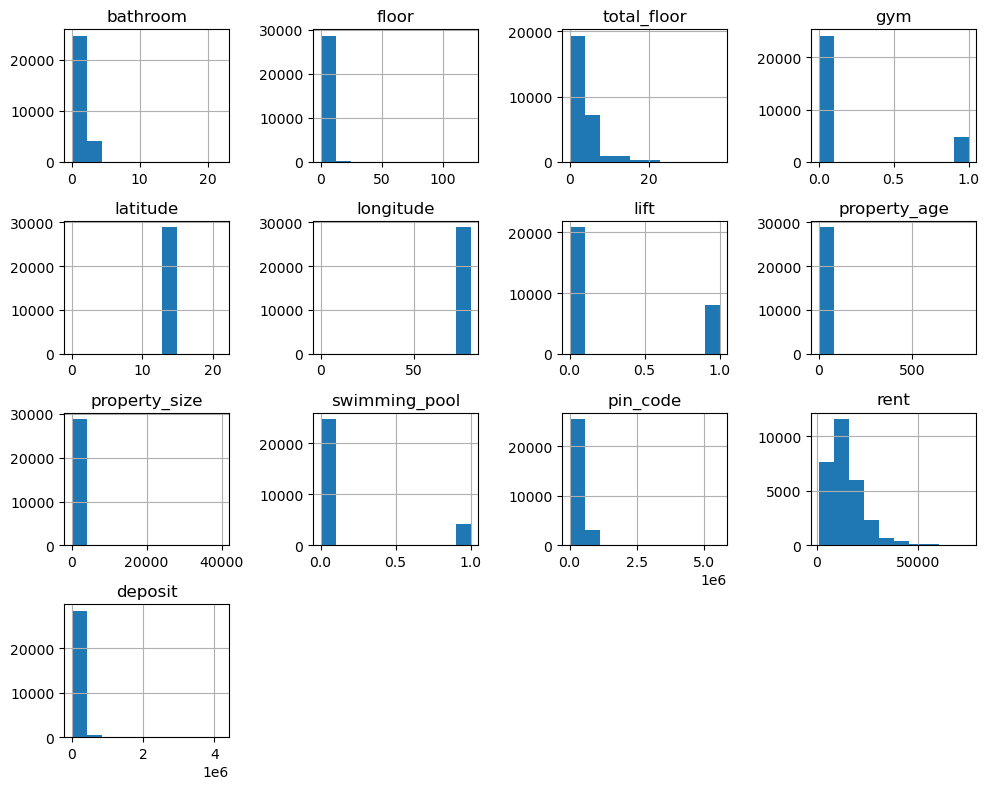

In [47]:
df_property.hist(figsize=(10,8))   # pandas plotting
plt.tight_layout()
plt.show();

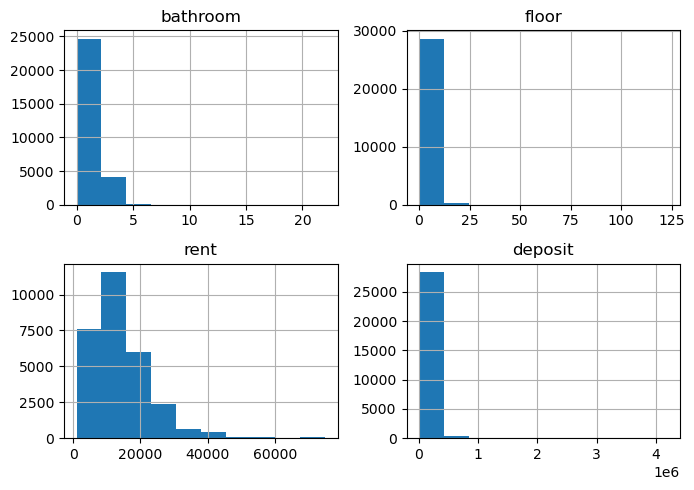

In [48]:
# can also select columns/features
df_property[['type', 'bathroom', 'floor', 'rent', 'deposit']].hist(figsize=(7,5))   # pandas plotting
plt.tight_layout()
plt.show();

Nicer, easier, ...

Saving file 'temp.distribution.rent.png'


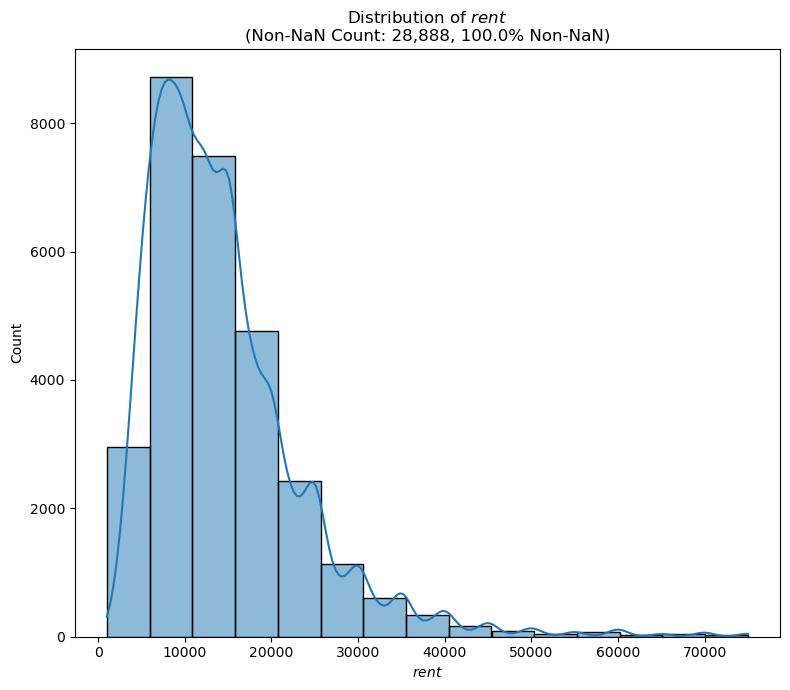

In [49]:
ed_data_viz.plot_histogram('rent',
                           df_property,
                           bins=15,   # default is 20
                           # kde=False,  # #default is True
                           file_path='temp.distribution.rent.png',   # defeault is no file written
                          )
plt.show()

## Continuous vs Discrete Columns/Features

In [50]:
df_property.shape

(28888, 21)

### Continuous Columns/Features

In [51]:
continuous_columns = df_property.select_dtypes(include=['int64', 'float64']).columns
continuous_columns

Index(['bathroom', 'floor', 'total_floor', 'gym', 'latitude', 'longitude',
       'lift', 'property_age', 'property_size', 'swimming_pool', 'pin_code',
       'rent', 'deposit'],
      dtype='object')

In [52]:
importlib.reload(ed_data_viz)
# ed_data_viz.__version__

<module 'ed_data_viz' from 'C:\\Users\\sabde\\OneDrive\\Desktop\\InnovatiCS - Batch 18\\B18.G2.Property Click Prediction.3\\B18.G2.Property Click Prediction\\14B\\14B\\ed_data_viz.py'>

In [53]:
continuous_columns

Index(['bathroom', 'floor', 'total_floor', 'gym', 'latitude', 'longitude',
       'lift', 'property_age', 'property_size', 'swimming_pool', 'pin_code',
       'rent', 'deposit'],
      dtype='object')

Thes graphs are "boring" and not correctly placed above proper x-values. :)

In [54]:
# import matplotlib.pyplot as plt

# for col in continuous_columns:
#     _ = plt.hist(df_property[col], bins=20)
#     _ = plt.ylabel('Count')
#     _ = plt.title(col)
#     _ = plt.show();

Nicer, easier, ...

In [55]:
importlib.reload(ed_data_viz)

<module 'ed_data_viz' from 'C:\\Users\\sabde\\OneDrive\\Desktop\\InnovatiCS - Batch 18\\B18.G2.Property Click Prediction.3\\B18.G2.Property Click Prediction\\14B\\14B\\ed_data_viz.py'>

Saving file 'temp.distribution.bathroom.png'


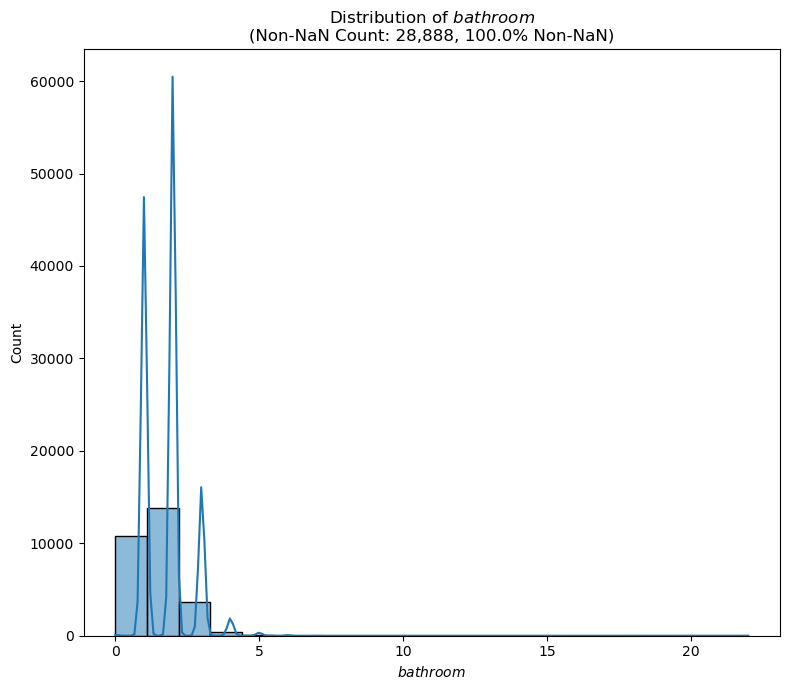

Saving file 'temp.distribution.floor.png'


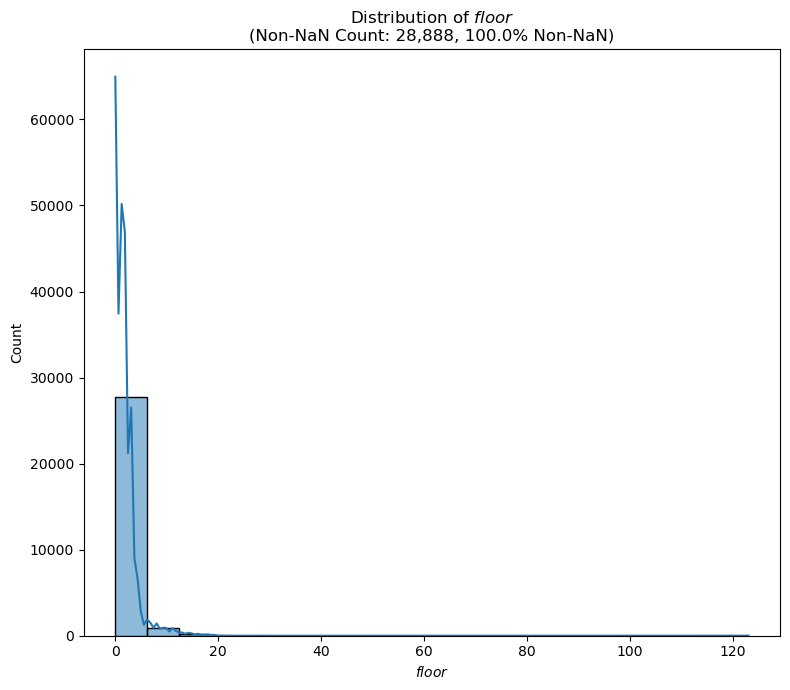

Saving file 'temp.distribution.total_floor.png'


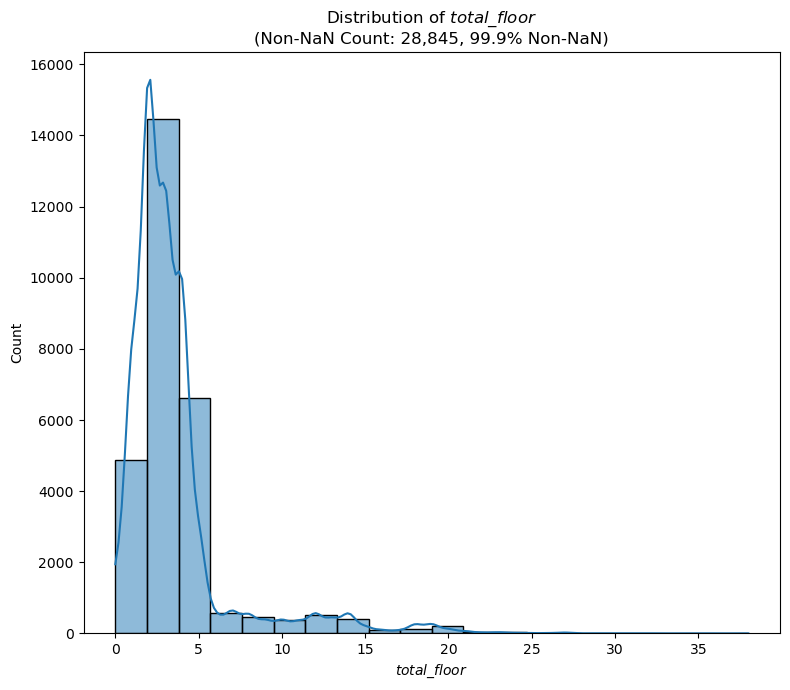

Saving file 'temp.distribution.gym.png'


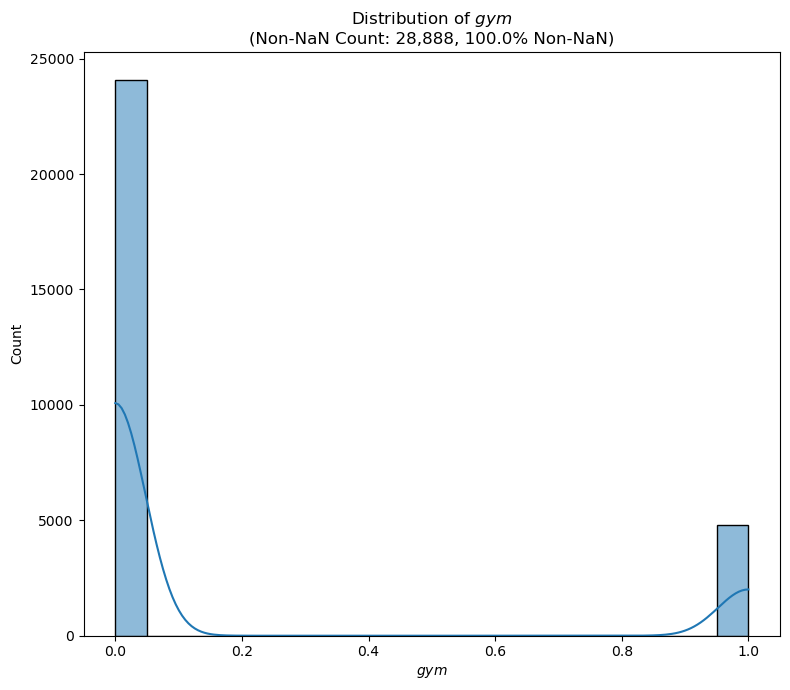

Saving file 'temp.distribution.latitude.png'


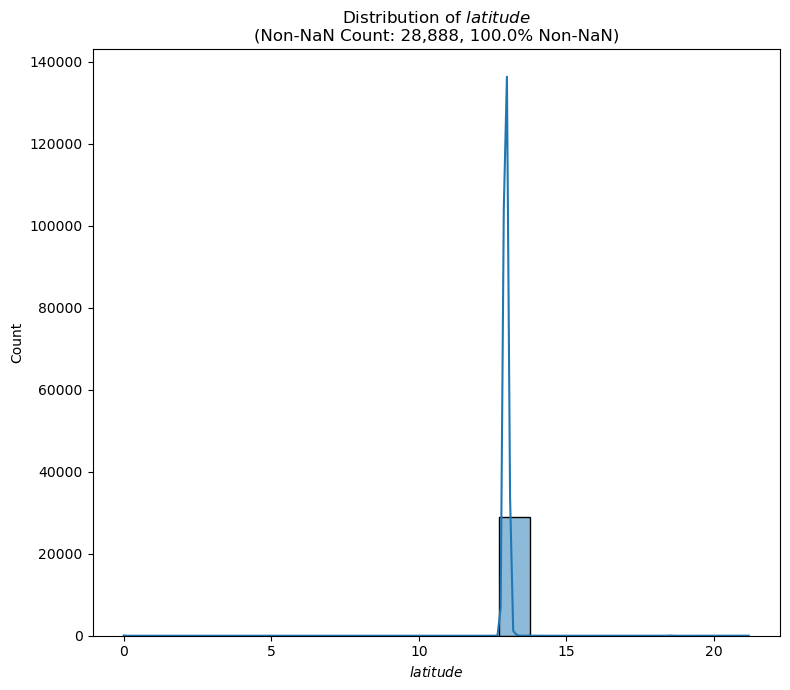

Saving file 'temp.distribution.longitude.png'


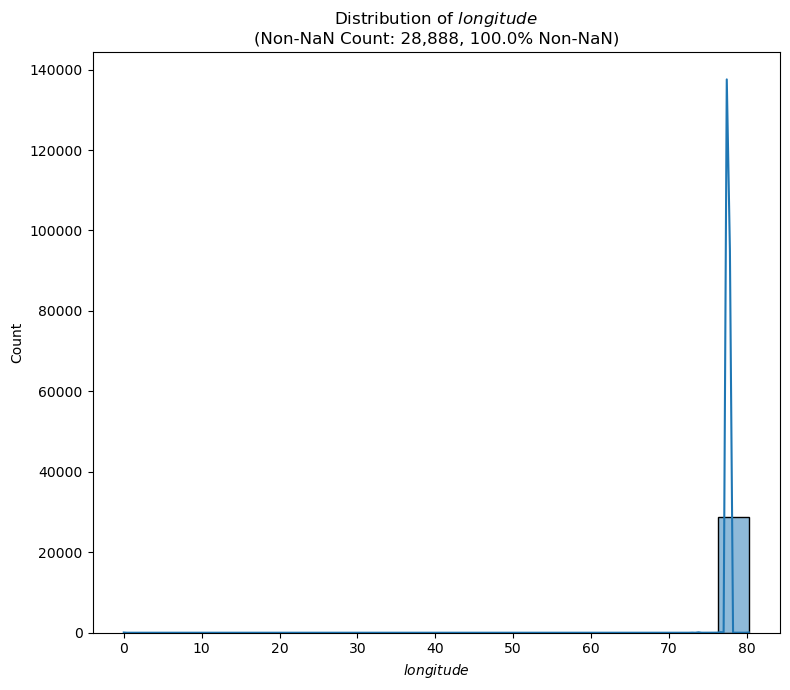

Saving file 'temp.distribution.lift.png'


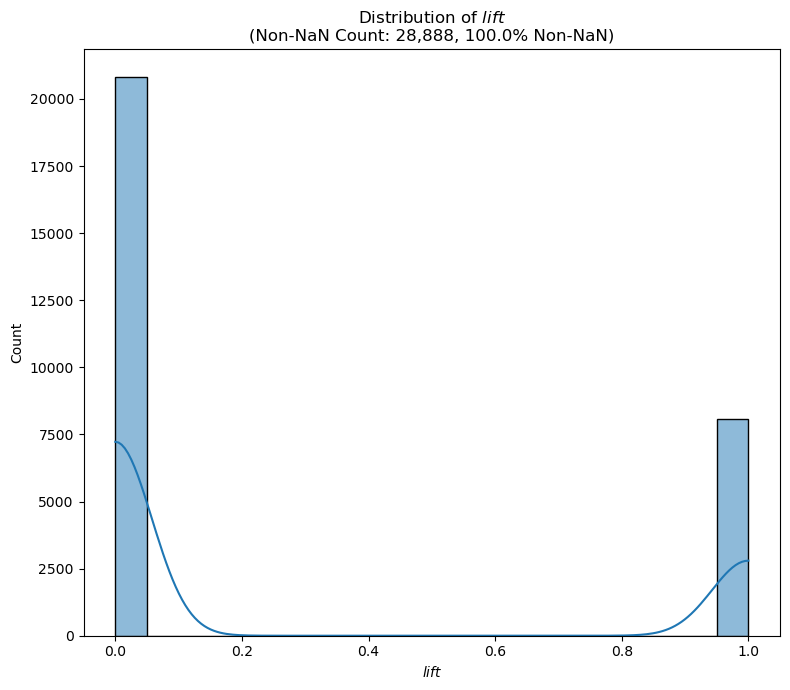

Saving file 'temp.distribution.property_age.png'


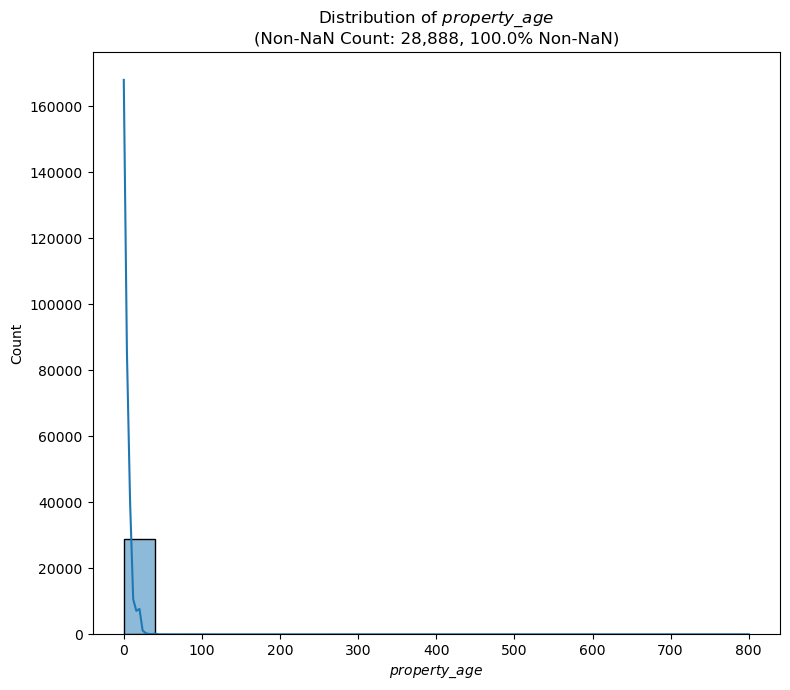

Saving file 'temp.distribution.property_size.png'


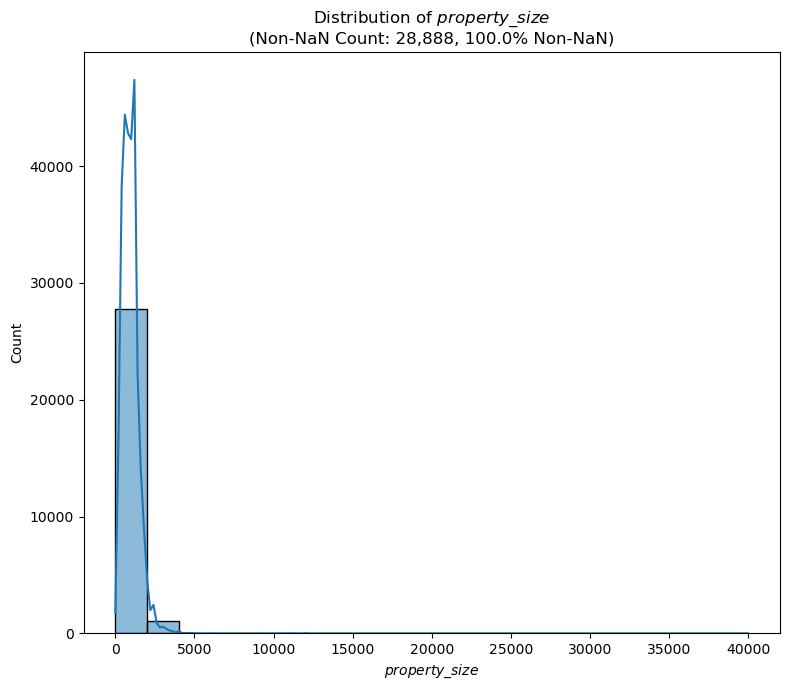

Saving file 'temp.distribution.swimming_pool.png'


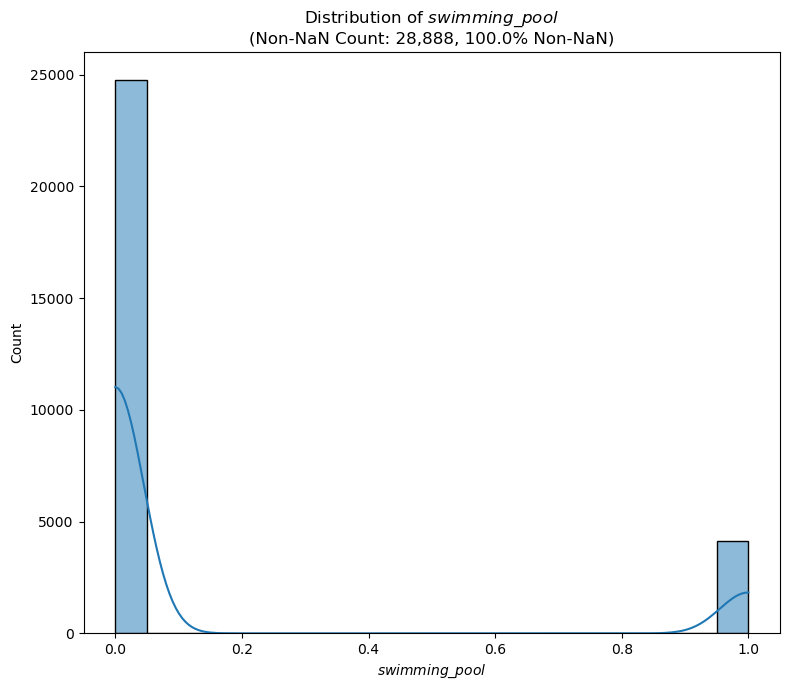

Saving file 'temp.distribution.pin_code.png'


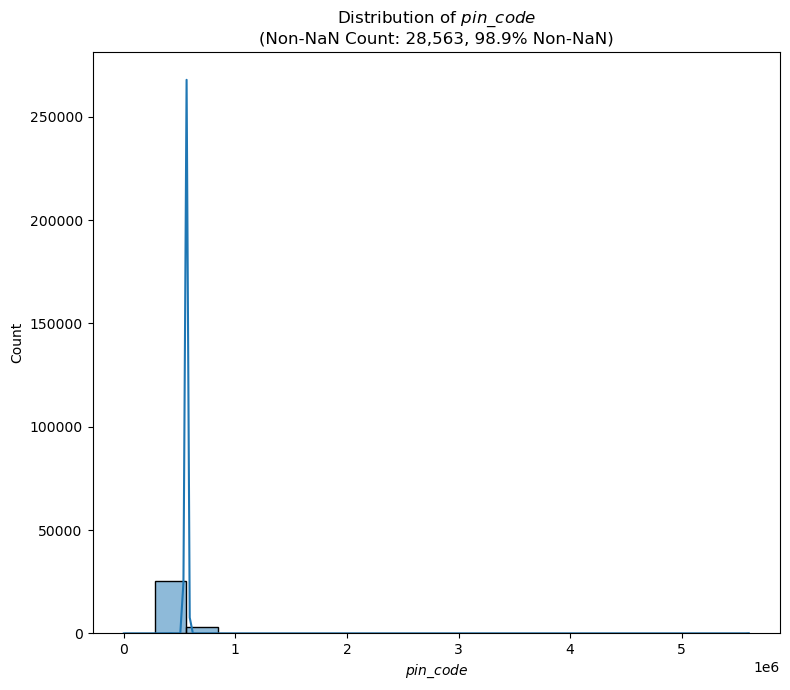

Saving file 'temp.distribution.rent.png'


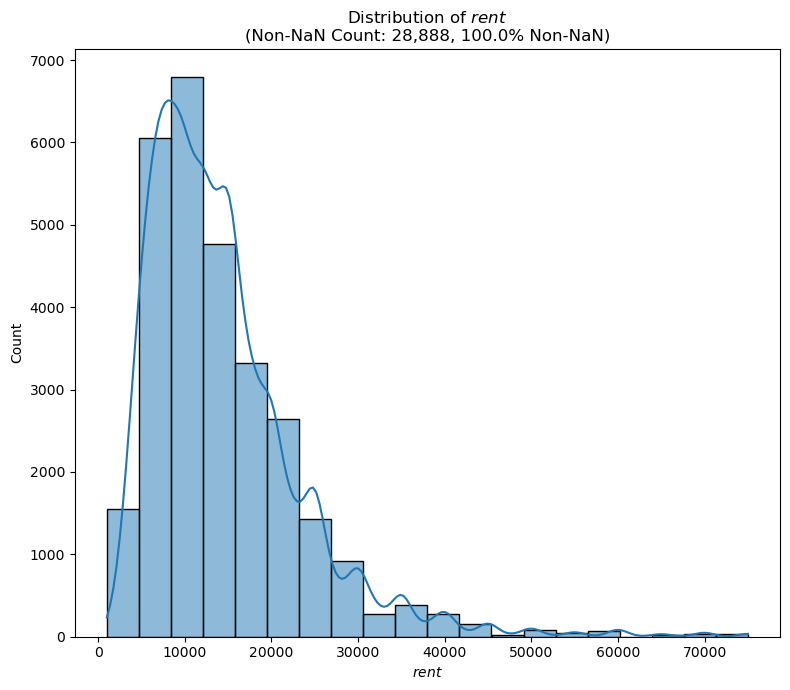

Saving file 'temp.distribution.deposit.png'


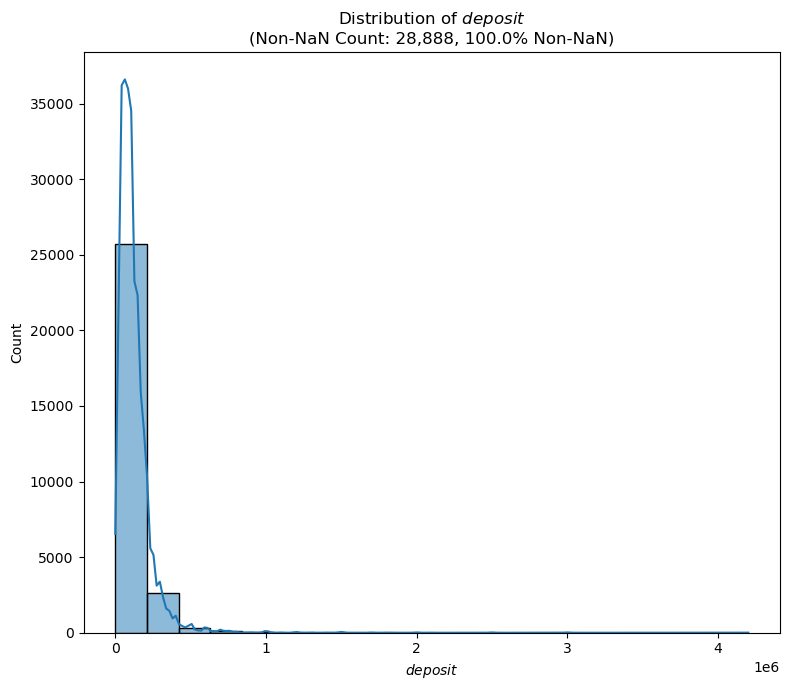

In [56]:
for col in continuous_columns:
    ed_data_viz.plot_histogram(col,
                           df_property,
                           # bins=15,   # default is 20
                           # kde=False,  # #default is True
                           file_path=f'temp.distribution.{col}.png',   # defeault is no file written
                          )
    plt.show()
    

Notes:

+ Not correct!
+ This technique for identifying continuous features is not good.
+ For example, these are obviously binary: gym, lift, swimming_pool $\implies$ categorical.
+ Others are numeric, but have low cardinality $\implies$ categorical.
+ We will do better after we analyze each individual column/feature.

### Discrete Columns/Features

In [57]:
discrete_columns = df_property.select_dtypes(exclude=['int64', 'float64']).columns
discrete_columns

Index(['property_id', 'type', 'activation_date', 'furnishing', 'lease_type',
       'locality', 'parking', 'building_type'],
      dtype='object')

In [58]:
# for col in discrete_columns:
#     print(df_property[col].value_counts())

Notes:

+ Not correct!
+ This technique for identifying discrete features is not good.
+ For example, these are obviously binary: gym, lift, swimming_pool $\implies$ categorical.
+ Others are numeric, but have low cardinality $\implies$ categorical.
+ We will do better after we analyze each individual column/feature.

## Better Column/Feature Identification - human!

In [59]:
df_property.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF


### GREAT

In [60]:
#with ed_utils.HiddenPrints():   # suppress print() output
with ed_utils.DummyContextManager():   # substitue this is you want to see all the print() below
    print(f'{df_property.shape = }')
    
    print('-'*95)
    
    print('                             num_')
    print('   column          dtype     nans  nunique  unique')
    print('-'*95)
    df_property_features = pd.DataFrame(columns=['column', 'dtype', 'num_nans', 'nunique', 'unique'])
    
    for index, col in enumerate(df_property.columns):
        record = []
        dtype = df_property[col].dtype
        num_nans = df_property[col].isna().sum()
        print(f'{index:2} {col:15} {str(dtype):8} {num_nans:5}', end='')
        record.extend([col, str(dtype), num_nans])
        try:
            nunique = df_property[col].nunique()
            print(f'{nunique:9,} ', end='')
            record.append(nunique)
            if nunique < 40:
                # cannot sort with Nan in sequence
                # so do not sort if nan is there
                try:
                    # "building_type" has problems with sorted() since there is NaN                
                    unique = sorted(df_property[col].unique())
                except:
                    unique = df_property[col].unique()
                print(f' {unique}')
                record.append(unique)
            else:
                print()
                record.append(float('nan'))
        except:
            print('unhandled exception')
        
        # print(record)
        df_property_features.loc[len(df_property_features)] = record


df_property_features


df_property.shape = (28888, 21)
-----------------------------------------------------------------------------------------------
                             num_
   column          dtype     nans  nunique  unique
-----------------------------------------------------------------------------------------------
 0 property_id     object       0   28,888 
 1 type            object       0        6  ['BHK1', 'BHK2', 'BHK3', 'BHK4', 'BHK4PLUS', 'RK1']
 2 activation_date object       0   18,534 
 3 bathroom        int64        0       15  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]
 4 floor           int64        0       29  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]
 5 total_floor     float64     43       36  [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, nan, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 34.0, 35.0, 38.0]
 6 f

,column,dtype,num_nans,nunique,unique
0,property_id,object,0,28888,NaN
1,type,object,0,6,"[BHK1, BHK2, BHK3, BHK4, BHK4PLUS, RK1]"
2,activation_date,object,0,18534,NaN
3,bathroom,int64,0,15,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21,..."
4,floor,int64,0,29,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
5,total_floor,float64,43,36,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ..."
6,furnishing,object,0,3,"[FULLY_FURNISHED, NOT_FURNISHED, SEMI_FURNISHED]"
7,gym,int64,0,2,"[0, 1]"
8,latitude,float64,0,26476,NaN
9,longitude,float64,0,26404,NaN


## 0 - "property_id"

+ property_id
    + str - unique - key
    + discrete - technically categorical, but high cardinality
    + no missing property_id
    + should not be dropped nor should property_id be binned since this is the key that ties together the 3 data files:
        + Property - "property_data_set.csv'
        + Request - "property_data_set.csv"
        + Images - "property_photos.csv"

In [61]:
df_property_features.query("column == 'property_id'")

,column,dtype,num_nans,nunique,unique
0,property_id,object,0,28888,NaN


### Duplicate "proprety_id"

In [62]:
df_property['property_id']

0        ff808081469fd6e20146a5af948000ea
1        ff8080814702d3d10147068359d200cd
2        ff808081470c645401470fb03f5800a6
3        ff808081470c6454014715eaa5960281
4        ff808081474aa867014771a0298f0aa6
                       ...               
28883    ff8081815b1fdda8015b1fe675ae0146
28884    ff8081815b1fdda8015b1ffee8a305d2
28885    ff8081815b1fdda8015b2000369205fd
28886    ff8081815b200540015b20158b0103c9
28887    ff8081815b2007fc015b201c77a20395
Name: property_id, Length: 28888, dtype: object

In [63]:
df_property['property_id'].nunique()

28888

Notes:

+ No duplicate "property_id" $\implies$ good, since this is the key we will join/merge with the other 2 data files.

## 1 - "type"

+ BHK type
    + Categorical - nominal
    + In real estate and housing, "BHK" typically refers to the number of bedrooms, hall, and kitchen in an apartment or house. For example:
        + 0.5BK: smaller than a standard-sized bedroom, a bath/toilet, and a kitchen
        + 1 BHK: One bedroom, one hall (living room), and one kitchen.
        + 2 BHK: Two bedrooms, one hall, and one kitchen.
        + 3 BHK: Three bedrooms, one hall, and one kitchen.
        + 4 BHK:
        + BHK4PLUS:
        + 1 RK: 1 room and 1 kitchen. There is no hall in a 1 RK. Also, 1RK has a lower space compared to a 1BHK. Bachelors prefer to rent 1RK more than 1BHK as they are cost-effective.

In [64]:
df_property.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lift,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type
0,ff808081469fd6e20146a5af948000ea,BHK2,09-03-2017 14:36,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,1,Hulimavu,BOTH,2,850,1,560076.0,12000,120000,AP
1,ff8080814702d3d10147068359d200cd,BHK2,07-03-2017 12:02,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,1,Ramamurthy Nagar,BOTH,1,1233,1,560016.0,20000,150000,AP
2,ff808081470c645401470fb03f5800a6,BHK2,10-03-2017 13:43,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,1,GM Palya,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP
3,ff808081470c6454014715eaa5960281,BHK3,09-03-2017 22:16,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,0,Arakere,BOTH,1,1300,0,560076.0,17000,150000,AP
4,ff808081474aa867014771a0298f0aa6,BHK1,15-03-2017 18:29,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,0,Hoodi,BOTH,4,450,0,560048.0,6500,40000,IF


In [65]:
df_property_features.query("column == 'type'")

,column,dtype,num_nans,nunique,unique
1,type,object,0,6,"[BHK1, BHK2, BHK3, BHK4, BHK4PLUS, RK1]"


In [66]:
df_property['type'].nunique()

6

In [67]:
sorted(df_property['type'].unique())

['BHK1', 'BHK2', 'BHK3', 'BHK4', 'BHK4PLUS', 'RK1']

In [68]:
vc_type = df_property['type'].value_counts()
vc_type

BHK2        14071
BHK1         6565
BHK3         5725
RK1          2015
BHK4          440
BHK4PLUS       72
Name: type, dtype: int64

In [69]:
type(vc_type)

pandas.core.series.Series

In [70]:
vc_type.shape

(6,)

In [71]:
vc_type.index

Index(['BHK2', 'BHK1', 'BHK3', 'RK1', 'BHK4', 'BHK4PLUS'], dtype='object')

In [72]:
vc_type.values

array([14071,  6565,  5725,  2015,   440,    72], dtype=int64)

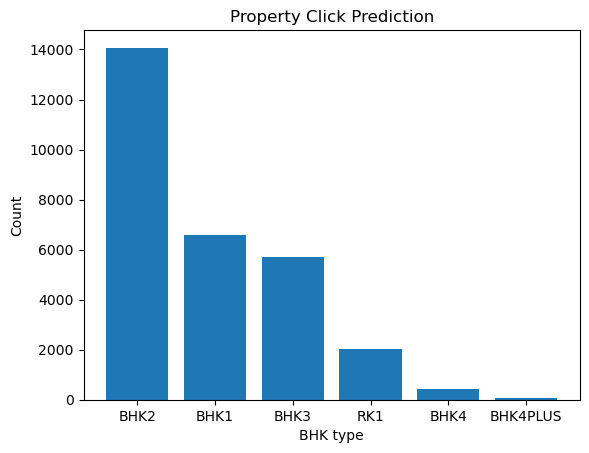

In [73]:
plt.bar(vc_type.index, vc_type.values)
plt.xlabel('BHK type')
plt.ylabel('Count')
plt.title('Property Click Prediction')
plt.show();

+ Better, cleaner.
+ Plus, save the chart/graph as a file.

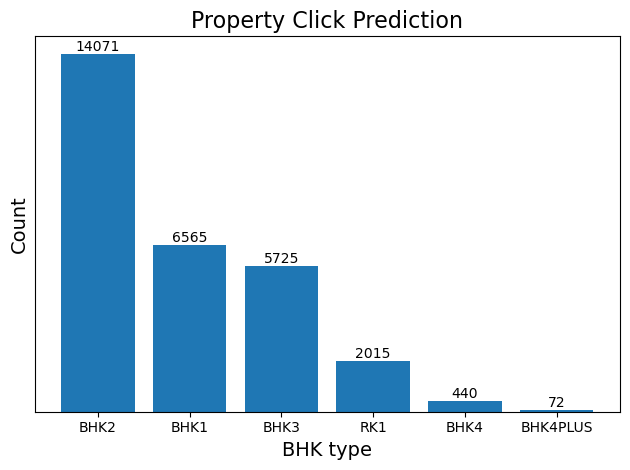

In [74]:
import matplotlib.pyplot as plt


# Create the bar plot
plt.bar(vc_type.index, vc_type.values)

# Add count labels on top of each bar
for i, v in enumerate(vc_type.values):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.xlabel('BHK type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Property Click Prediction', fontsize=16)
# plt.xticks(rotation=45)  # Rotate x-axis labels if needed
# Remove y-axis ticks
plt.yticks([])   # no yticks
plt.tight_layout()  # Ensure labels are not cut off

plt.tight_layout()  # Adjust the layout before saving
plt.savefig('temp.type.png',
            # dpi=1000
           )

plt.show();


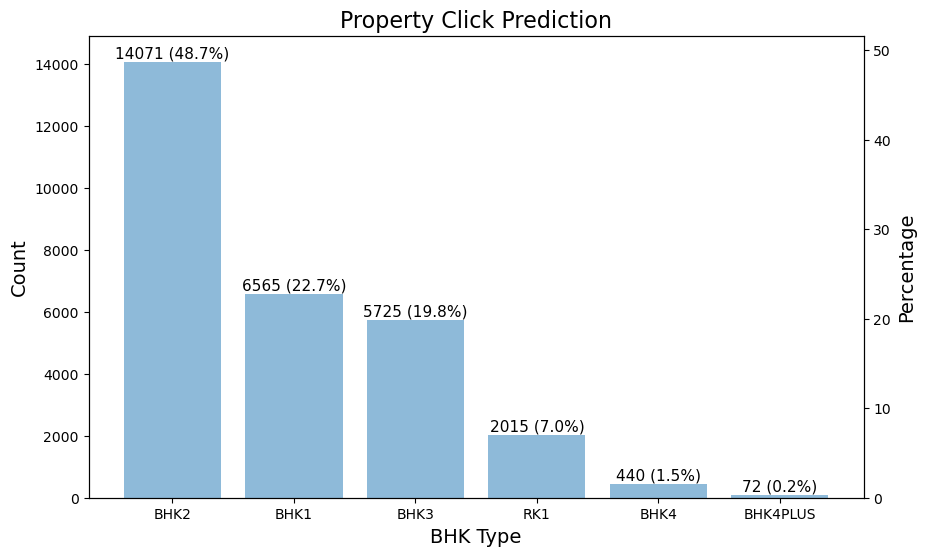

In [75]:
ed_data_viz.plot_bar_categorical(dict(vc_type),
                     title='Property Click Prediction',
                     xlabel='BHK Type',
                    )

### Feature Extraction

In [76]:
def map_bedroom_type(type):
    bedroom_type_mapping = {
        'BHK1': 1,
        'BHK2': 2,
        'BHK3': 3,
        'BHK4': 4,
        'BHK4PLUS': 5,
        'RK1': 0
    }

    # Use get() method to handle cases where the type is not in the dictionary
    return bedroom_type_mapping.get(type, None)

# Example usage
bedroom_types = ['BHK2', 'BHK1', 'BHK3', 'RK1', 'BHK4', 'BHK4PLUS']
mapped_values = [map_bedroom_type(bhk) for bhk in bedroom_types]

print(mapped_values)


[2, 1, 3, 0, 4, 5]


In [77]:
# Creating Bedroom column
df_property["bedroom"] = df_property['type'].apply(map_bedroom_type)
df_property[['type',"bedroom"]]


,type,bedroom
0,BHK2,2
1,BHK2,2
2,BHK2,2
3,BHK3,3
4,BHK1,1
...,...,...
28883,BHK2,2
28884,BHK3,3
28885,BHK2,2
28886,BHK2,2


In [78]:
df_property[df_property["type"] == "RK1"]

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,locality,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom
11,ff80808147ed5e680147f326ca4c02d2,RK1,07-02-2017 16:10,2,3,3.0,SEMI_FURNISHED,0,12.983430,77.643376,...,Indira Nagar,TWO_WHEELER,10,200,0,560038.0,6500,20000,IF,0
22,ff808081485677b101485a6921bd01ae,RK1,18-02-2017 16:07,1,3,3.0,NOT_FURNISHED,0,12.954545,77.738749,...,Whitefield,BOTH,0,500,0,560066.0,7000,30000,IF,0
53,ff80808149393cef014960f1e0fb16d4,RK1,04-03-2017 14:33,1,2,2.0,SEMI_FURNISHED,0,12.928378,77.626491,...,Koramangala,TWO_WHEELER,10,280,0,560030.0,8500,51000,IF,0
89,ff8080814b317233014b350040fd0296,RK1,10-03-2017 13:49,1,4,4.0,SEMI_FURNISHED,0,12.878760,77.638318,...,Singasandra,TWO_WHEELER,0,300,0,560068.0,5500,35000,IF,0
126,ff8081814bd62607014bd94d014f03f0,RK1,19-02-2017 10:59,1,4,4.0,NOT_FURNISHED,0,12.922365,77.619699,...,Madiwala,TWO_WHEELER,5,150,0,560034.0,7500,15000,IF,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28810,ff8081815b1ebf9e015b1ec53bf4025a,RK1,30-03-2017 16:05,1,3,3.0,SEMI_FURNISHED,0,13.009558,77.635160,...,"Ramaswamipalya,Lingarajapuram",TWO_WHEELER,0,250,0,560084.0,7000,70000,IF,0
28817,ff8081815b1ebf9e015b1eea48791127,RK1,30-03-2017 16:55,1,1,1.0,NOT_FURNISHED,0,13.022340,77.632546,...,"Krishnappa Layout,Kacharakanahalli",BOTH,10,300,0,560043.0,4000,40000,IF,0
28818,ff8081815b1ebf9e015b1eeb2ca41177,RK1,30-03-2017 17:37,1,3,3.0,SEMI_FURNISHED,0,12.938229,77.747433,...,Varthur,TWO_WHEELER,1,450,0,560087.0,6500,25000,AP,0
28834,ff8081815b1ebf9e015b1f2785402d01,RK1,30-03-2017 18:00,1,4,4.0,NOT_FURNISHED,0,12.972196,77.497594,...,Srigandada Kaval,TWO_WHEELER,0,350,0,560091.0,4000,40000,IF,0


In [79]:
def map_hall_type(type):
    hall_type_mapping = {
        'BHK1': 1,
        'BHK2': 1,
        'BHK3': 1,
        'BHK4': 1,
        'BHK4PLUS': 1,
        'RK1': 0
    }

    # Use get() method to handle cases where the type is not in the dictionary
    return hall_type_mapping.get(type, None)

# Example usage
hall_types = ['BHK2', 'BHK1', 'BHK3', 'RK1', 'BHK4', 'BHK4PLUS']
mapped_values = [map_hall_type(bhk) for bhk in hall_types]

print(mapped_values)


[1, 1, 1, 0, 1, 1]


In [80]:
# Creating Hall column
df_property["hall"] = df_property['type'].apply(map_hall_type)
df_property[['type', "bedroom", "hall"]]

,type,bedroom,hall
0,BHK2,2,1
1,BHK2,2,1
2,BHK2,2,1
3,BHK3,3,1
4,BHK1,1,1
...,...,...,...
28883,BHK2,2,1
28884,BHK3,3,1
28885,BHK2,2,1
28886,BHK2,2,1


In [81]:
df_property[df_property["type"] == "RK1"]

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall
11,ff80808147ed5e680147f326ca4c02d2,RK1,07-02-2017 16:10,2,3,3.0,SEMI_FURNISHED,0,12.983430,77.643376,...,TWO_WHEELER,10,200,0,560038.0,6500,20000,IF,0,0
22,ff808081485677b101485a6921bd01ae,RK1,18-02-2017 16:07,1,3,3.0,NOT_FURNISHED,0,12.954545,77.738749,...,BOTH,0,500,0,560066.0,7000,30000,IF,0,0
53,ff80808149393cef014960f1e0fb16d4,RK1,04-03-2017 14:33,1,2,2.0,SEMI_FURNISHED,0,12.928378,77.626491,...,TWO_WHEELER,10,280,0,560030.0,8500,51000,IF,0,0
89,ff8080814b317233014b350040fd0296,RK1,10-03-2017 13:49,1,4,4.0,SEMI_FURNISHED,0,12.878760,77.638318,...,TWO_WHEELER,0,300,0,560068.0,5500,35000,IF,0,0
126,ff8081814bd62607014bd94d014f03f0,RK1,19-02-2017 10:59,1,4,4.0,NOT_FURNISHED,0,12.922365,77.619699,...,TWO_WHEELER,5,150,0,560034.0,7500,15000,IF,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28810,ff8081815b1ebf9e015b1ec53bf4025a,RK1,30-03-2017 16:05,1,3,3.0,SEMI_FURNISHED,0,13.009558,77.635160,...,TWO_WHEELER,0,250,0,560084.0,7000,70000,IF,0,0
28817,ff8081815b1ebf9e015b1eea48791127,RK1,30-03-2017 16:55,1,1,1.0,NOT_FURNISHED,0,13.022340,77.632546,...,BOTH,10,300,0,560043.0,4000,40000,IF,0,0
28818,ff8081815b1ebf9e015b1eeb2ca41177,RK1,30-03-2017 17:37,1,3,3.0,SEMI_FURNISHED,0,12.938229,77.747433,...,TWO_WHEELER,1,450,0,560087.0,6500,25000,AP,0,0
28834,ff8081815b1ebf9e015b1f2785402d01,RK1,30-03-2017 18:00,1,4,4.0,NOT_FURNISHED,0,12.972196,77.497594,...,TWO_WHEELER,0,350,0,560091.0,4000,40000,IF,0,0


## 2 - "activation_date"

+ continuous, not discrete
+ convert to `pandas` datetime dtype

In [82]:
df_property_features.query("column == 'activation_date'")

,column,dtype,num_nans,nunique,unique
2,activation_date,object,0,18534,NaN


In [83]:
df_property['activation_date'].dtype

dtype('O')

any blank "activation_date'

In [84]:
df_property['activation_date'].isna().sum()

0

Notes:

+ no missing "activation_date"

In [85]:
df_property['activation_date']

0        09-03-2017 14:36
1        07-03-2017 12:02
2        10-03-2017 13:43
3        09-03-2017 22:16
4        15-03-2017 18:29
               ...       
28883    30-03-2017 21:42
28884    30-03-2017 22:14
28885    30-03-2017 21:47
28886    30-03-2017 22:30
28887    30-03-2017 22:33
Name: activation_date, Length: 28888, dtype: object

Notes:

+ Convert to `pandas` datetime dtype, but note the special format of the datetime in the original column/feature.
+ The order is "day-month-year 24hour:minute" (hint: look at record with index=4).

In [86]:
df_property['activation_date'] = pd.to_datetime(df_property['activation_date'],
                                                format="%d-%m-%Y %H:%M")

In [87]:
df_property

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4.0,SEMI_FURNISHED,1,12.876174,77.596571,...,BOTH,2,850,1,560076.0,12000,120000,AP,2,1
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11.0,SEMI_FURNISHED,1,13.018444,77.678122,...,BOTH,1,1233,1,560016.0,20000,150000,AP,2,1
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4.0,NOT_FURNISHED,1,12.975072,77.665865,...,FOUR_WHEELER,0,1200,0,560075.0,15000,75000,AP,2,1
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4.0,SEMI_FURNISHED,0,12.888169,77.591282,...,BOTH,1,1300,0,560076.0,17000,150000,AP,3,1
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2.0,SEMI_FURNISHED,0,12.990243,77.712962,...,BOTH,4,450,0,560048.0,6500,40000,IF,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2.0,SEMI_FURNISHED,0,12.942613,77.621890,...,BOTH,15,1200,0,560030.0,23000,200000,IF,2,1
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3.0,SEMI_FURNISHED,0,12.906331,77.591790,...,BOTH,8,1310,0,560078.0,22000,125000,AP,3,1
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14.0,SEMI_FURNISHED,1,12.904363,77.526863,...,BOTH,0,975,1,NaN,12500,50000,AP,2,1
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2.0,SEMI_FURNISHED,0,12.938007,77.629097,...,TWO_WHEELER,5,600,0,560034.0,14000,80000,IF,2,1


In [88]:
df_property.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28888 entries, 0 to 28887
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   property_id      28888 non-null  object        
 1   type             28888 non-null  object        
 2   activation_date  28888 non-null  datetime64[ns]
 3   bathroom         28888 non-null  int64         
 4   floor            28888 non-null  int64         
 5   total_floor      28845 non-null  float64       
 6   furnishing       28888 non-null  object        
 7   gym              28888 non-null  int64         
 8   latitude         28888 non-null  float64       
 9   longitude        28888 non-null  float64       
 10  lease_type       28888 non-null  object        
 11  lift             28888 non-null  int64         
 12  locality         28888 non-null  object        
 13  parking          28888 non-null  object        
 14  property_age     28888 non-null  int64

Check by exploring the `pandas` datetime capabilities on record with index=0.

In [89]:
dt = df_property.iloc[0]['activation_date']
dt

Timestamp('2017-03-09 14:36:00')

In [90]:
dt.day

9

In [91]:
dt.month

3

In [92]:
dt.year

2017

In [93]:
dt.hour

14

In [94]:
dt.minute

36

When were these "activation_date" data collected?

In [95]:
df_property['activation_date']

0       2017-03-09 14:36:00
1       2017-03-07 12:02:00
2       2017-03-10 13:43:00
3       2017-03-09 22:16:00
4       2017-03-15 18:29:00
                ...        
28883   2017-03-30 21:42:00
28884   2017-03-30 22:14:00
28885   2017-03-30 21:47:00
28886   2017-03-30 22:30:00
28887   2017-03-30 22:33:00
Name: activation_date, Length: 28888, dtype: datetime64[ns]

In [96]:
df_property['activation_date'].dt.month.unique()

array([3, 2], dtype=int64)

In [97]:
df_property['activation_date'].dt.year.unique()

array([2017], dtype=int64)

Notes:

+ "property_data_set.csv' has "activation_date" only from February 2017 and March 2017
+ Roughly balanced between February 2017 and March 2017.

In [98]:
df_property['activation_date'].dt.month.value_counts()

3    16036
2    12852
Name: activation_date, dtype: int64

In [99]:
df_property['activation_date'].dt.year.value_counts()

2017    28888
Name: activation_date, dtype: int64

## 3 - "bathroom"

+ bathroom
    + discrete/categorical - 15 unique integers
    + no missing values

In [100]:
df_property_features.query("column == 'bathroom'")

,column,dtype,num_nans,nunique,unique
3,bathroom,int64,0,15,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21,..."


In [101]:
sorted(df_property['bathroom'].unique())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]

In [102]:
cat_bathroom = df_property_features.query("column == 'bathroom'")['unique'].tolist()[0]
# or
cat_bathroom2 = sorted(df_property['bathroom'].unique())

cat_bathroom
cat_bathroom2
cat_bathroom == cat_bathroom2

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 20, 21, 22]

True

In [103]:
vc_bathroom = df_property['bathroom'].value_counts()
vc_bathroom

2     13827
1     10807
3      3696
4       433
5        75
0        24
6        15
7         3
10        2
21        1
22        1
12        1
20        1
8         1
9         1
Name: bathroom, dtype: int64

In [104]:
# demo/test

# Convert the index to strings
# x_labels is the str version of the xticks
# this is to prevent the matplolib bar() method from ordering numeric x values numerically
# i.e. want to preserve the order in the given data x values, so it is from highest count (most frequent) to least

# same, but dramatically different run times

x_labels = [str(label) for label in vc_bathroom.index]   # ~4 µs
# or
x_labels2 = vc_bathroom.index.to_series().apply(str)   # ~310 µs, to_series() taks a lot of time
# or
x_labels3 = vc_bathroom.index.astype(str)   # ~60 µs

(x_labels == x_labels2).all()
(x_labels2 == x_labels3).all()


True

True

In [105]:
%%timeit
[str(label) for label in vc_bathroom.index]

6.52 µs ± 393 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


In [106]:
%%timeit
vc_bathroom.index.to_series().apply(str)

304 µs ± 38.1 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [107]:
%%timeit
vc_bathroom.index.astype(str)

88.5 µs ± 5.16 µs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [108]:
# Convert the index to strings
# x_labels is the str version of the xticks
# this is to prevent the matplolib bar() method from ordering numeric x values numerically
# i.e. want to preserve the order in the given data x values, so it is from highest count (most frequent) to least
x_labels = [str(label) for label in vc_bathroom.index]


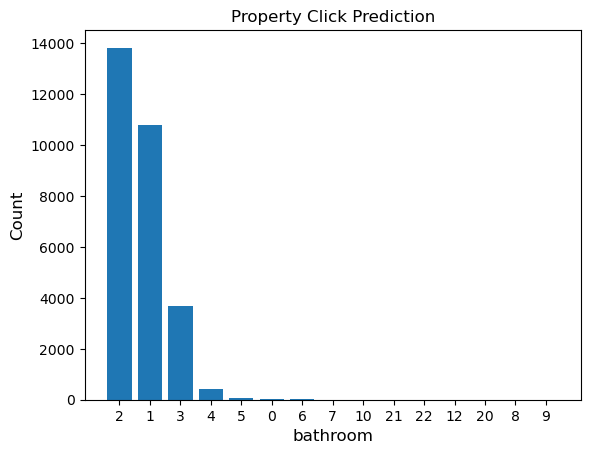

In [109]:
plt.bar(x_labels, vc_bathroom.values)
plt.xlabel('bathroom', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Property Click Prediction', fontsize=12)
plt.show();

Put count at the top of each bar.

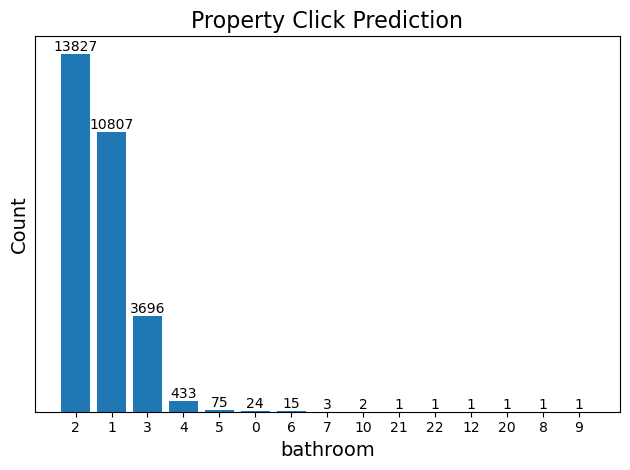

In [110]:
# Create the bar plot
plt.bar(x_labels, vc_bathroom.values)

# Add count labels on top of each bar
for i, v in enumerate(vc_bathroom.values):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.xlabel('bathroom', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Property Click Prediction', fontsize=16)
# plt.xticks(rotation=45)  # Rotate x-axis labels if needed
# Remove y-axis ticks
plt.yticks([])   # no yticks
plt.tight_layout()  # Ensure labels are not cut off

plt.tight_layout()  # Adjust the layout before saving
plt.savefig('temp.bathroom.png',
            # dpi=1000
           )

plt.show();


Put count and percentage at the top of each bar.

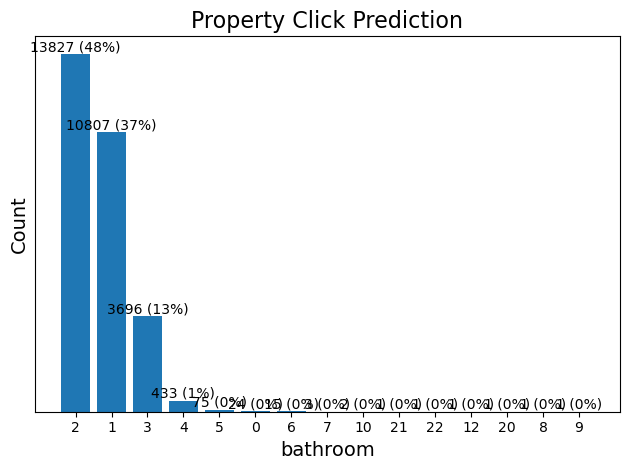

In [111]:
# Convert the index to strings
x_labels = vc_bathroom.index.astype(str)

# Create the bar plot
plt.bar(x_labels, vc_bathroom.values)

# Calculate percentages
total = vc_bathroom.sum()
percentages = [(v / total) * 100 for v in vc_bathroom.values]

# Add count and percentage labels on top of each bar
for i, (v, p) in enumerate(zip(vc_bathroom.values, percentages)):
    plt.text(i, v, f'{v} ({p:0.0f}%)', ha='center', va='bottom')   # round percentage to 0 decimal places
    # plt.text(i, v, f'{v} ({p:0.1f}%)', ha='center', va='bottom')   # round percentage to 1 decimal places

plt.xlabel('bathroom', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Property Click Prediction', fontsize=16)
plt.yticks([])  # Remove y-axis ticks
plt.tight_layout()

plt.tight_layout()  # Adjust the layout before saving
plt.savefig('temp.bathroom.png',
            # dpi=1000
           )

plt.show();


In [112]:
# help(plot_bar_categorical)

In [113]:
vc_bathroom = df_property['bathroom'].value_counts()
vc_bathroom

2     13827
1     10807
3      3696
4       433
5        75
0        24
6        15
7         3
10        2
21        1
22        1
12        1
20        1
8         1
9         1
Name: bathroom, dtype: int64

In [114]:
N = vc_bathroom.sum()
N

28888

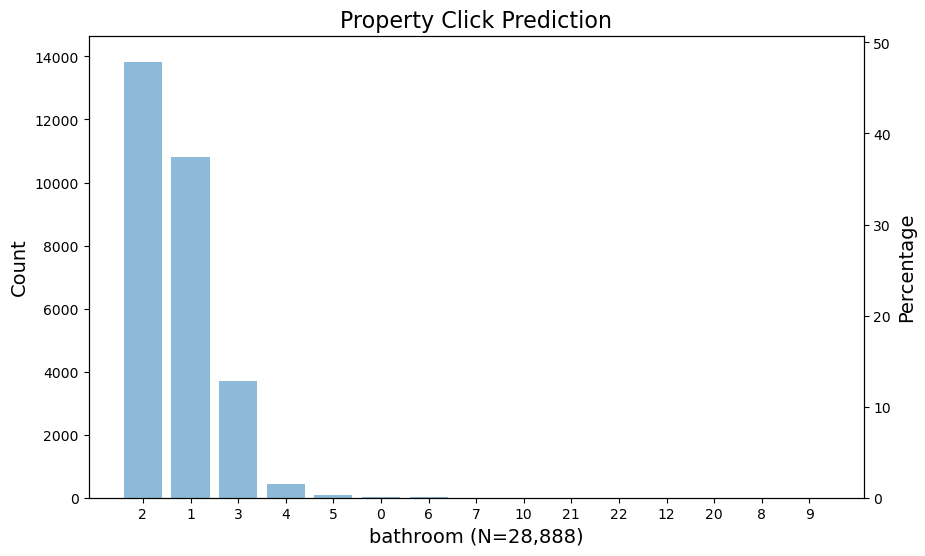

In [115]:
ed_data_viz.plot_bar_categorical(dict(vc_bathroom),
                     title='Property Click Prediction',
                     xlabel=f'bathroom ({N=:,})',
                     bar_annotation_type=None,
                    )

In [116]:
n_largest = 8

In [117]:
vc_bathroom_n_largest = dict(list(vc_bathroom.items())[:n_largest])
vc_bathroom_n_largest

{2: 13827, 1: 10807, 3: 3696, 4: 433, 5: 75, 0: 24, 6: 15, 7: 3}

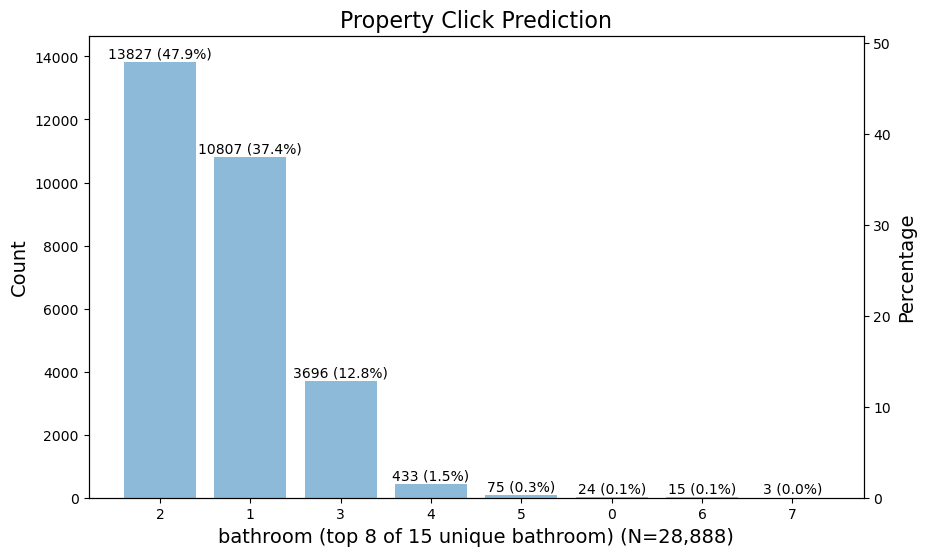

In [118]:
ed_data_viz.plot_bar_categorical(dict(vc_bathroom_n_largest),
                     title='Property Click Prediction',
                     # xlabel=f'bathroom ({N=:,})',
                     xlabel=f'bathroom (top {n_largest} of {len(vc_bathroom):,} unique bathroom) ({N=:,})',
                     fontsize_top_of_bar=10
                    )

In [119]:
%ls -l temp*

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B

12/20/2023  06:48 PM            25,085 temp.bathroom.png
12/20/2023  06:48 PM            36,912 temp.distribution.bathroom.png
12/20/2023  06:48 PM            34,389 temp.distribution.deposit.png
12/20/2023  06:48 PM            29,552 temp.distribution.floor.png
12/20/2023  06:48 PM            27,568 temp.distribution.gym.png
12/20/2023  06:48 PM            31,019 temp.distribution.latitude.png
12/20/2023  06:48 PM            30,094 temp.distribution.lift.png
12/20/2023  06:48 PM            32,099 temp.distribution.longitude.png
12/20/2023  06:48 PM            30,528 temp.distribution.pin_code.png
12/20/2023  06:48 PM            32,671 temp

## 4 - "floor"

+ floor
    + discrete integers - categorical, 29 unique values
    + no missing values
    + can covert dtype to uint8

In [120]:
df_property_features.query("column == 'floor'")

,column,dtype,num_nans,nunique,unique
4,floor,int64,0,29,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


In [121]:
cat_floor = sorted(df_property['floor'].unique())
print(cat_floor)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]


Notes:

+ can change dtype to uint8

In [122]:
category_floor = df_property_features.query("column == 'floor'")['unique'].tolist()[0]
# or
category_floor2 = sorted(df_property['floor'].unique())

print(f'{category_floor = }')
print(f'{category_floor2 = }')
print(f'{category_floor == category_floor2 = }')

category_floor = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]
category_floor2 = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 123]
category_floor == category_floor2 = True


In [123]:
vc_floor = df_property['floor'].value_counts()
vc_floor

1      8035
0      7982
2      6327
3      3397
4      1414
5       348
6       268
7       224
8       175
9       160
10      118
11      118
12       89
14       52
13       45
15       37
16       28
17       22
18       17
19       15
20        4
21        3
25        2
27        2
24        2
123       1
26        1
22        1
28        1
Name: floor, dtype: int64

In [124]:
N = vc_floor.sum()
N

28888

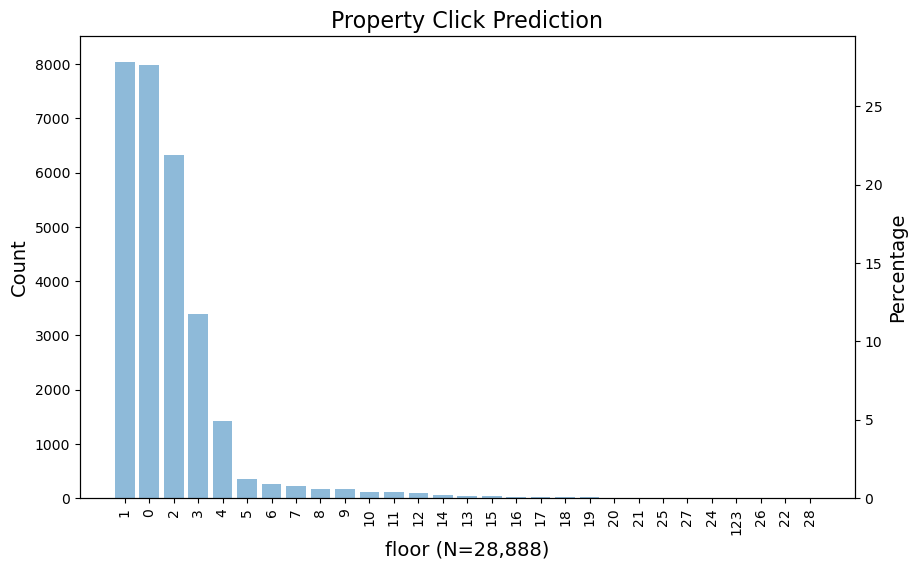

In [125]:
ed_data_viz.plot_bar_categorical(dict(vc_floor),
                     title='Property Click Prediction',
                     xlabel=f'floor ({N=:,})',
                     xtick_rotation=90,
                     bar_annotation_type=None,
                    )

## 5 - "total_floor"

+ total_floor
   + real values integers - categorical, 36 unique values
   + 43 missing values - WHAT TO IMPUTE?  OR DROP?
   + Change the NaN to a unique 'sentinel" value; maybe -1 or 36, then convert the dtype to uint8

In [126]:
df_property_features.query("column == 'total_floor'")

,column,dtype,num_nans,nunique,unique
5,total_floor,float64,43,36,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ..."


In [127]:
print(sorted(df_property['total_floor'].unique()))

[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, nan, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 34.0, 35.0, 38.0]


In [128]:
vc_total_floor = df_property['total_floor'].value_counts()
vc_total_floor

2.0     8208
3.0     6250
4.0     5163
1.0     4056
5.0     1450
0.0      831
7.0      332
14.0     300
12.0     298
8.0      280
6.0      250
13.0     217
10.0     198
9.0      192
11.0     179
19.0     138
18.0     136
15.0     100
20.0      63
16.0      50
17.0      42
21.0      34
23.0      18
22.0      14
27.0      14
24.0       9
26.0       6
25.0       5
32.0       2
30.0       2
35.0       2
29.0       2
34.0       1
31.0       1
28.0       1
38.0       1
Name: total_floor, dtype: int64

In [129]:
# Replace NaN values in the 'total_floor' column with a specific value, e.g., -1
df_property['total_floor'] = df_property['total_floor'].fillna(-1)

In [130]:
df_property['total_floor'].isna().sum()

0

In [131]:
df_property['total_floor'] = df_property['total_floor'].astype("int")

In [132]:
vc_total_floor = df_property['total_floor'].value_counts()

In [133]:
N = vc_total_floor.sum()
N

28888

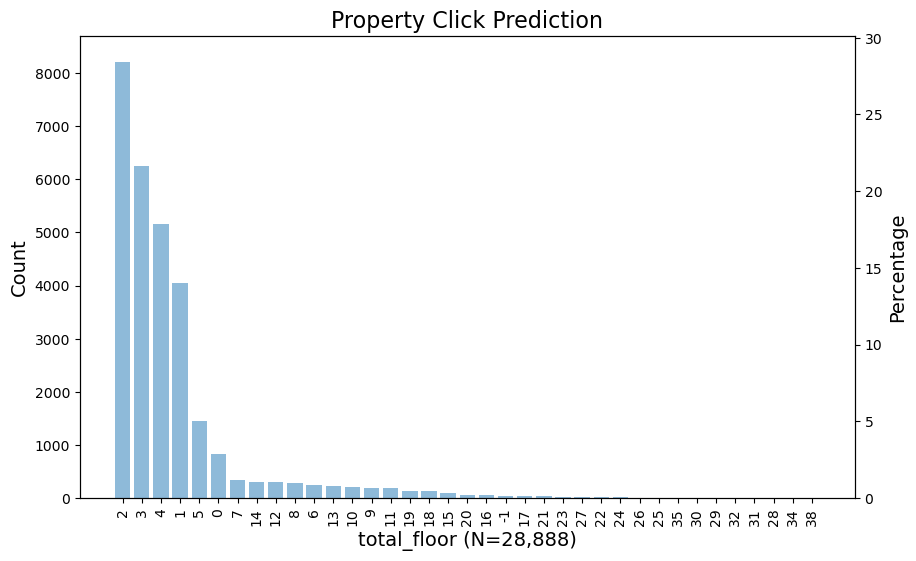

In [134]:
ed_data_viz.plot_bar_categorical(dict(vc_total_floor),
                     title='Property Click Prediction',
                     xlabel=f'total_floor ({N=:,})',
                     xtick_rotation=90,
                     bar_annotation_type=None,
                    )

## 6 - "furnishing"

+ furnishing
    + discrete - categorical - 3 classes
    + nominal

In [135]:
df_property_features.query("column == 'furnishing'")

,column,dtype,num_nans,nunique,unique
6,furnishing,object,0,3,"[FULLY_FURNISHED, NOT_FURNISHED, SEMI_FURNISHED]"


In [136]:
vc_furnishing = df_property['furnishing'].value_counts()
vc_furnishing

SEMI_FURNISHED     22463
NOT_FURNISHED       4863
FULLY_FURNISHED     1562
Name: furnishing, dtype: int64

In [137]:
N = vc_furnishing.sum()
N

28888

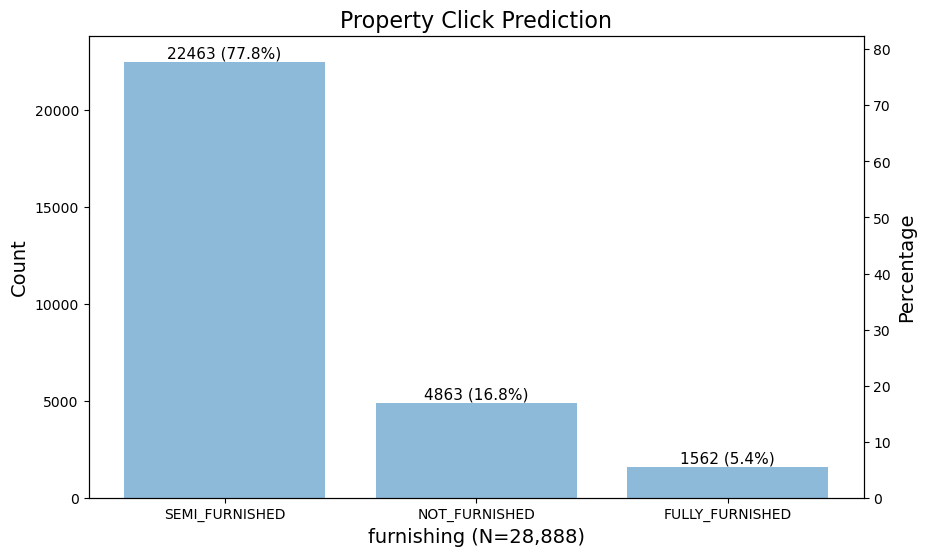

In [138]:
ed_data_viz.plot_bar_categorical(dict(vc_furnishing),
                     title='Property Click Prediction',
                     xlabel=f'furnishing ({N=:,})',
                    )

### Feature encoding

In [139]:
help(pd.get_dummies)

Help on function get_dummies in module pandas.core.reshape.encoding:

get_dummies(data, prefix=None, prefix_sep='_', dummy_na: 'bool' = False, columns=None, sparse: 'bool' = False, drop_first: 'bool' = False, dtype: 'Dtype | None' = None) -> 'DataFrame'
    Convert categorical variable into dummy/indicator variables.
    
    Parameters
    ----------
    data : array-like, Series, or DataFrame
        Data of which to get dummy indicators.
    prefix : str, list of str, or dict of str, default None
        String to append DataFrame column names.
        Pass a list with length equal to the number of columns
        when calling get_dummies on a DataFrame. Alternatively, `prefix`
        can be a dictionary mapping column names to prefixes.
    prefix_sep : str, default '_'
        If appending prefix, separator/delimiter to use. Or pass a
        list or dictionary as with `prefix`.
    dummy_na : bool, default False
        Add a column to indicate NaNs, if False NaNs are ignored.
 

In [140]:
import pandas as pd

# Example data
#furnishing = {'color': ['red', 'green', 'blue', 'red', 'blue', 'green', 'red', 'green', 'blue', 'red']}
#df_property[""] = pd.DataFrame(df_property["furnishing"])

# One hot encode the "color" feature
one_hot_encoded = pd.get_dummies(df_property['furnishing'], prefix='furnishing')

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_property, one_hot_encoded], axis=1)

# Drop one of the encoded columns, for example, 'furnishing_blue'
df_encoded = df_encoded.drop('furnishing_NOT_FURNISHED', axis=1)

df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,850,1,560076.0,12000,120000,AP,2,1,0,1
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1233,1,560016.0,20000,150000,AP,2,1,0,1
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,1200,0,560075.0,15000,75000,AP,2,1,0,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,1300,0,560076.0,17000,150000,AP,3,1,0,1
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,450,0,560048.0,6500,40000,IF,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,1200,0,560030.0,23000,200000,IF,2,1,0,1
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,1310,0,560078.0,22000,125000,AP,3,1,0,1
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,975,1,NaN,12500,50000,AP,2,1,0,1
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,600,0,560034.0,14000,80000,IF,2,1,0,1


## 7 - "gym"

+ gym
    + discrete - categorical, 2 classes

In [141]:
df_property_features.query("column == 'gym'")

,column,dtype,num_nans,nunique,unique
7,gym,int64,0,2,"[0, 1]"


In [142]:
vc_gym = df_property['gym'].value_counts()
vc_gym

0    24094
1     4794
Name: gym, dtype: int64

In [143]:
N = vc_gym.sum()
N

28888

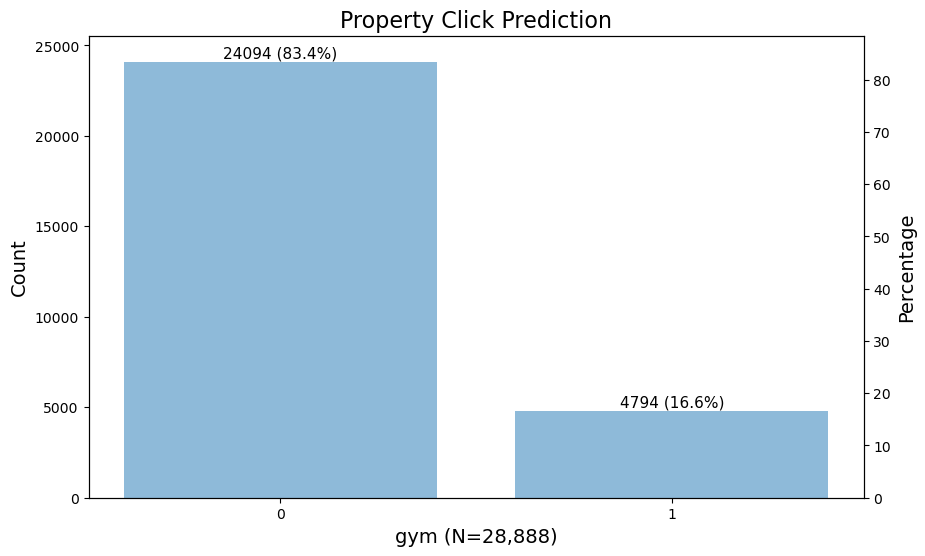

In [144]:
ed_data_viz.plot_bar_categorical(dict(vc_gym),
                     title='Property Click Prediction',
                     xlabel=f'gym ({N=:,})',
                    )

## 8 - "latitude"
## 9 - "longitude"

+ latitude
    + continuous - float64
    + -90 ≤ latitude ≤ 90
    + [-90, 90]
+ logitude
    + continuous - float64
    + -180 ≤ latitude ≤ 180
    + [-180, 180]


### "latitude"

In [145]:
df_property_features.query("column == 'latitude'")

,column,dtype,num_nans,nunique,unique
8,latitude,float64,0,26476,NaN


Check that all "latitude" values are legitimte.

In [146]:
# Apply the is_latitude() function to the 'latitude' column
# df_property['latitude_is_valid'] = df_property['latitude'].apply(is_latitude)
df_property['latitude'].apply(ed_utils.is_latitude)

0        True
1        True
2        True
3        True
4        True
         ... 
28883    True
28884    True
28885    True
28886    True
28887    True
Name: latitude, Length: 28888, dtype: bool

In [147]:
df_property['latitude'].apply(ed_utils.is_latitude).sum()

28888

Notes:

+ All latitudes are legitimate values.

In [148]:
df_property['latitude']

0        12.876174
1        13.018444
2        12.975072
3        12.888169
4        12.990243
           ...    
28883    12.942613
28884    12.906331
28885    12.904363
28886    12.938007
28887    12.978731
Name: latitude, Length: 28888, dtype: float64

In [149]:
df_property['latitude'].describe()

count    28888.000000
mean        12.957859
std          0.219500
min          0.000000
25%         12.906324
50%         12.953939
75%         13.009369
max         21.176277
Name: latitude, dtype: float64

Notes:

+ close proximity for 'latitude'

### "longitude"

In [150]:
df_property_features.query("column == 'longitude'")

,column,dtype,num_nans,nunique,unique
9,longitude,float64,0,26404,NaN


Check that all "longitude" values are legitimte.

In [151]:
# Apply the is_longitude() function to the 'longitude' column
# df_property['latitude_is_valid'] = df_property['latitude'].apply(is_longitude)
df_property['longitude'].apply(ed_utils.is_longitude)

0        True
1        True
2        True
3        True
4        True
         ... 
28883    True
28884    True
28885    True
28886    True
28887    True
Name: longitude, Length: 28888, dtype: bool

In [152]:
df_property['longitude'].apply(ed_utils.is_longitude).sum()

28888

Notes:

+ All longitudes are legitimate values.

### Cartography - GIS

In [153]:
# calculate map center latitude and map center longitude

center_lat = df_property['latitude'].mean()
center_lat

center_lon = df_property['longitude'].mean()
center_lon

12.95785925452596

77.60518630025028

In [154]:
for index, row in df_property.head(10).iterrows():   # only first 10 records/rows
    location = row['latitude'], row['longitude']
    print(location)

(12.87617415, 77.59657101)
(13.0184435, 77.6781215)
(12.9750721, 77.665865)
(12.88816886, 77.59128199)
(12.99024289, 77.71296243)
(12.93655693, 77.558291)
(12.93022886, 77.63331054)
(12.99250871, 77.65895736)
(12.97994442, 77.53887529)
(12.95865423, 77.7172075)


In [155]:
df_property.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall'],
      dtype='object')

In [156]:
!pip install chime

In [157]:
!pip install folium

In [158]:
import chime   # audible sounds used for alert when complete
from datetime import datetime
import time
import folium   # GIS 
import pandas as pd
# from tqdm.notebook import tqdm   # progress bar    WHY THIS NOT WORK?
from tqdm import tqdm   # progress bar


print('Processing Folium map ...')

start_time = datetime.now()

# Create a Folium map centered at a specific latitude and longitude
map_center = [center_lat, center_lon]

# Adjust the zoom level as needed
# zoom_start = 0 world/earth zoom, ~5 country/India, ~10 ok for this data
m = folium.Map(location=map_center,
               zoom_start=10)

# Add your scatter plot data as markers on the map
# for index, row in tqdm(df_property.iterrows(), total=total=len(df_property), desc="Processing Rows"):
for index, row in tqdm(df_property.head(1000).iterrows(), total=1000, desc="Processing Rows"):
    _ = folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=3,
        color='blue',
        # fill=True,
        # fill_color='blue',
        fill_opacity=0.4,
        # popup=f"Row#: {row['row#']}, Latitude: {row['from_lat']}, Longitude: {row['from_long']}, Car_Cancellation: {row['Car_Cancellation']}"
        popup=f"property_id: {row['property_id']}, Latitude: {row['latitude']}, Longitude: {row['longitude']}"
    ).add_to(m)

# Save the HTML map
m.save('temp.map.html')  # Save the map to an HTML file
print('Folium map saved to "temp.map.html"')

end_time = datetime.now()
elapsed_time = end_time - start_time
print("Elapsed time:", elapsed_time)
for _ in range(3):
    chime.info()
    time.sleep(0.5)


Processing Folium map ...


Processing Rows: 100%|███████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 3978.02it/s]


Folium map saved to "temp.map.html"
Elapsed time: 0:00:02.039218


In [159]:
%ls -l temp.map.html

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B

12/20/2023  06:49 PM         1,106,116 temp.map.html
               1 File(s)      1,106,116 bytes
               0 Dir(s)  187,466,289,152 bytes free


To get the actual html code.

In [160]:
html_map = m._repr_html_()
len(html_map)
html_map[:500]

1349091

'<div style="width:100%;"><div style="position:relative;width:100%;height:0;padding-bottom:60%;"><span style="color:#565656">Make this Notebook Trusted to load map: File -> Trust Notebook</span><iframe srcdoc="&lt;!DOCTYPE html&gt;\n&lt;html&gt;\n&lt;head&gt;\n    \n    &lt;meta http-equiv=&quot;content-type&quot; content=&quot;text/html; charset=UTF-8&quot; /&gt;\n    \n        &lt;script&gt;\n            L_NO_TOUCH = false;\n            L_DISABLE_3D = false;\n        &lt;/script&gt;\n    \n    &lt;style&g'

In [161]:
# render in Jupyter Notebook, using folium map __repr__()
m

#### Outliers

+ outside of D km (or miles) outside of the center

In [162]:
center_lat = df_property['latitude'].mean()
center_lat

center_lon = df_property['longitude'].mean()
center_lon

12.95785925452596

77.60518630025028

In [163]:
lat1 = center_lat
lon1 = center_lon

In [164]:
!pip install geopy

In [165]:
# demo/test
from geopy.distance import geodesic

# Define the coordinates
coords_1 = (lat1, lon1)
coords_2 = (center_lat, center_lon)

# Calculate the distance
distance = geodesic(coords_1, coords_2).kilometers

print(f"Distance between the two points is: {distance} kilometers")


Distance between the two points is: 0.0 kilometers


#### All

In [166]:
import pandas as pd
from geopy.distance import geodesic

# Define a lambda function that applies the geodesic function to each row
calculate_distance = lambda row: geodesic((row['latitude'], row['longitude']),
                                          (center_lat, center_lon)).kilometers

# Apply the function to each row and create a new Series
df_property['distance_to_center'] = df_property.apply(calculate_distance, axis=1)


In [167]:
df_property[['latitude', 'longitude', 'distance_to_center']]

,latitude,longitude,distance_to_center
0,12.876174,77.596571,9.085040
1,13.018444,77.678122,10.369874
2,12.975072,77.665865,6.853463
3,12.888169,77.591282,7.856098
4,12.990243,77.712962,12.229796
...,...,...,...
28883,12.942613,77.621890,2.475888
28884,12.906331,77.591790,5.882955
28885,12.904363,77.526863,10.356790
28886,12.938007,77.629097,3.399258


In [168]:
df_property['distance_to_center'].describe()

count    28888.000000
mean        11.796848
std        103.678807
min          0.026493
25%          7.158326
50%          9.339312
75%         12.214216
max       8673.539467
Name: distance_to_center, dtype: float64

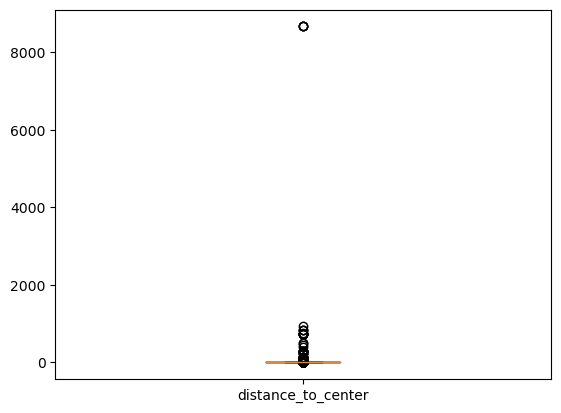

In [169]:
plt.boxplot(df_property['distance_to_center'])
plt.xticks([1], ['distance_to_center'])
plt.show();

#### Far from Center

In [170]:
df_property_far_from_center = df_property.query("distance_to_center > 100")
df_property_far_from_center.shape
df_property_far_from_center


(45, 24)

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,distance_to_center
1239,ff8081814f6e2c87014f6eefaaf707f4,BHK3,2017-02-10 21:06:00,3,1,2,SEMI_FURNISHED,0,12.334932,76.616745,...,10,1500,0,570017.0,27000,270000,AP,3,1,127.590961
4128,ff80818154809dad0154898b796f6ff2,BHK2,2017-02-26 17:10:00,2,2,3,SEMI_FURNISHED,0,18.522452,73.778390,...,5,1000,0,411021.0,16000,50000,AP,2,1,739.725711
4236,ff80818154aefc2e0154b3e8f5414466,BHK2,2017-02-01 17:26:00,2,4,11,SEMI_FURNISHED,0,18.509120,73.927971,...,5,900,0,411028.0,5000,12500,AP,2,1,729.733440
4331,ff80818154d230860154d3683858237d,BHK1,2017-02-26 14:35:00,1,2,4,SEMI_FURNISHED,0,0.000000,0.000000,...,0,600,0,560048.0,12500,80000,IF,1,1,8673.539467
4722,ff808181557246fd015572cbc3a518b5,BHK3,2017-02-19 14:39:00,3,8,11,NOT_FURNISHED,1,18.522826,73.767260,...,0,1550,1,411008.0,20000,75000,AP,3,1,740.421280
4731,ff8081815576fd4f01557764c55d1572,BHK3,2017-03-15 14:04:00,2,3,4,SEMI_FURNISHED,1,9.146778,76.590183,...,1,1400,0,560043.0,26000,250000,AP,3,1,435.903861
5001,ff80818155e478330155e483b23200a2,BHK1,2017-03-20 16:17:00,1,6,6,SEMI_FURNISHED,0,18.565076,73.805238,...,0,300,0,411007.0,13000,30000,AP,1,1,742.051275
5046,ff80818155f3f9b90155f8200320586d,RK1,2017-03-21 18:51:00,1,1,1,FULLY_FURNISHED,0,0.000000,0.000000,...,0,250,0,560055.0,3500,20000,IF,0,0,8673.539467
5297,ff808181565a773d01565acad47a1257,BHK1,2017-03-17 14:38:00,1,4,4,NOT_FURNISHED,0,18.458923,73.914316,...,2,630,0,411060.0,8400,25000,AP,1,1,725.886575
5600,ff80818156cd94740156d13011137d01,BHK2,2017-03-21 21:38:00,2,0,3,SEMI_FURNISHED,0,0.000000,0.000000,...,10,1000,0,560095.0,23000,150000,IF,2,1,8673.539467


In [171]:
df_property_far_from_center[['latitude', 'longitude', 'distance_to_center']]

,latitude,longitude,distance_to_center
1239,12.334932,76.616745,127.590961
4128,18.522452,73.778390,739.725711
4236,18.509120,73.927971,729.733440
4331,0.000000,0.000000,8673.539467
4722,18.522826,73.767260,740.421280
4731,9.146778,76.590183,435.903861
5001,18.565076,73.805238,742.051275
5046,0.000000,0.000000,8673.539467
5297,18.458923,73.914316,725.886575
5600,0.000000,0.000000,8673.539467


Notes:

+ PLOT RINGS ON MAP AT [50, 100, 200, 500] km from center

In [172]:
# demo/test
# check
coords_1 = 18.462204, 73.862391   # index = 22979
coords_2 = (center_lat, center_lon)

# Calculate the distance
distance = geodesic(coords_1, coords_2).kilometers

print(f"Distance between the two points is: {distance} kilometers")


Distance between the two points is: 729.2332645098028 kilometers


#### Near to Center

In [173]:
df_property_near_to_center = df_property.query("distance_to_center <= 20")
df_property_near_to_center.shape
df_property_near_to_center

(28069, 24)

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,distance_to_center
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,850,1,560076.0,12000,120000,AP,2,1,9.085040
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,1233,1,560016.0,20000,150000,AP,2,1,10.369874
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,0,1200,0,560075.0,15000,75000,AP,2,1,6.853463
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,1,1300,0,560076.0,17000,150000,AP,3,1,7.856098
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,4,450,0,560048.0,6500,40000,IF,1,1,12.229796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,15,1200,0,560030.0,23000,200000,IF,2,1,2.475888
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,8,1310,0,560078.0,22000,125000,AP,3,1,5.882955
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,0,975,1,NaN,12500,50000,AP,2,1,10.356790
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,5,600,0,560034.0,14000,80000,IF,2,1,3.399258


Noes:

+ about 800 properties are outside 20 km from center; i.. ~ 2.8%


In [174]:
(28888 - 28069) / 28888

0.02835087233453337

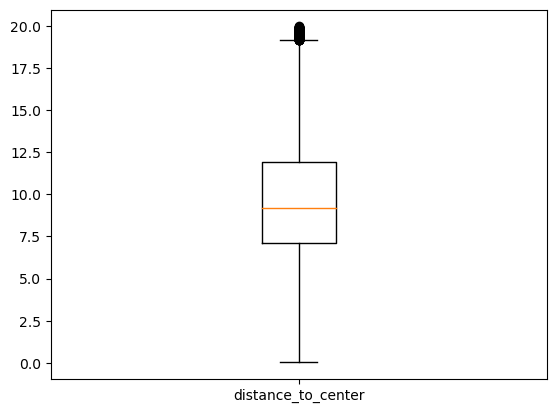

In [175]:
plt.boxplot(df_property_near_to_center['distance_to_center'])
plt.xticks([1], ['distance_to_center'])
plt.show();

### 10 - "lease_type"

+ lease_type
    + discrete - categorical - 3 classes


In [176]:
df_property_features.query("column == 'lease_type'")

,column,dtype,num_nans,nunique,unique
10,lease_type,object,0,4,"[ANYONE, BACHELOR, COMPANY, FAMILY]"


In [177]:
vc_lease_type = df_property['lease_type'].value_counts()
vc_lease_type

FAMILY      14885
ANYONE      12721
BACHELOR     1211
COMPANY        71
Name: lease_type, dtype: int64

In [178]:
N = vc_lease_type.sum()
N

28888

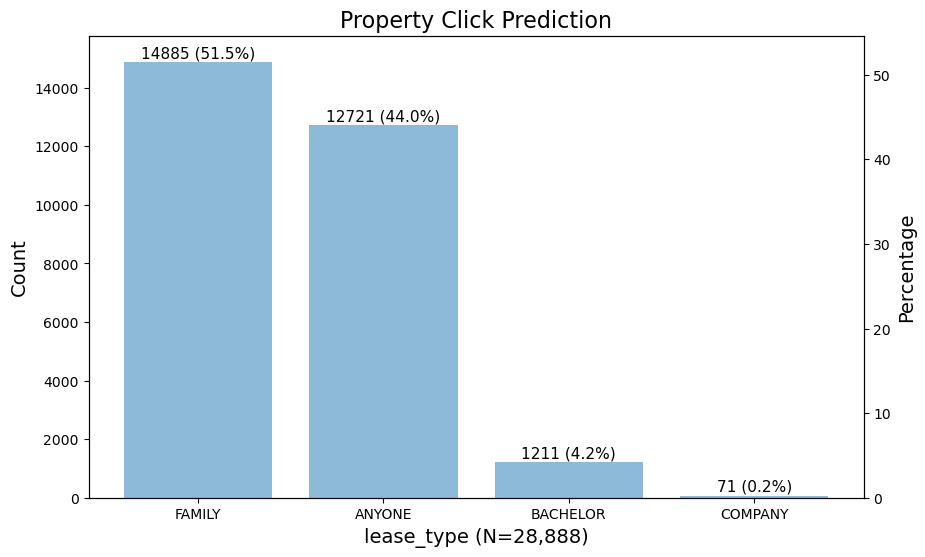

In [179]:
ed_data_viz.plot_bar_categorical(dict(vc_lease_type),
                     title='Property Click Prediction',
                     xlabel=f'lease_type ({N=:,})',
                    )

In [180]:
### Feature Encoding

In [181]:
import pandas as pd

# One hot encode the "lease_type" feature, dropping the first column
one_hot_encoded = pd.get_dummies(df_encoded['lease_type'], prefix='lease_type', drop_first=True)

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_encoded, one_hot_encoded], axis=1)

#copy paste and watch out for version number
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,rent,deposit,building_type,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,12000,120000,AP,2,1,0,1,0,0,1
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,20000,150000,AP,2,1,0,1,0,0,1
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,15000,75000,AP,2,1,0,0,0,0,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,17000,150000,AP,3,1,0,1,0,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,6500,40000,IF,1,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,23000,200000,IF,2,1,0,1,0,0,1
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,22000,125000,AP,3,1,0,1,0,0,1
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,12500,50000,AP,2,1,0,1,0,0,1
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,14000,80000,IF,2,1,0,1,0,0,0


## 11 - "lift"

+ lift
    + discrete - categorical - 2 classs


In [182]:
df_property_features.query("column == 'lift'")

,column,dtype,num_nans,nunique,unique
11,lift,int64,0,2,"[0, 1]"


In [183]:
vc_lift = df_property['lift'].value_counts()
vc_lift

0    20828
1     8060
Name: lift, dtype: int64

In [184]:
N = vc_lift.sum()
N

28888

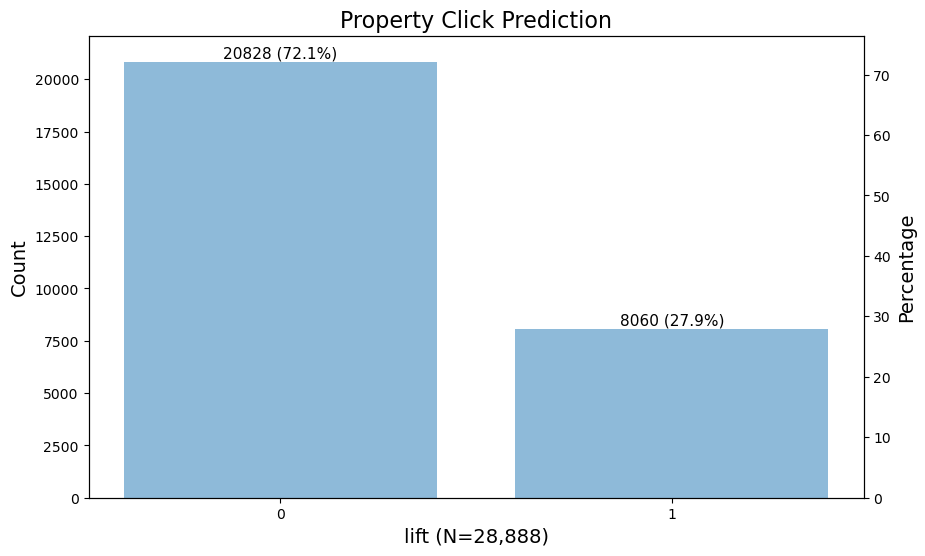

In [185]:
ed_data_viz.plot_bar_categorical(dict(vc_lift),
                     title='Property Click Prediction',
                     xlabel=f'lift ({N=:,})',
                    )

## 12 - "locality"

+ locality
    + continuous?


In [186]:
df_property_features.query("column == 'locality'")

,column,dtype,num_nans,nunique,unique
12,locality,object,0,2368,NaN


In [187]:
vc_locality = df_property['locality'].value_counts()
vc_locality

Whitefield                                  745
JP Nagar                                    655
Electronic City                             630
Ramamurthy Nagar                            522
Marathahalli                                494
                                           ... 
Sultanpalya, Bengaluru, Karnataka, India      1
Anjanapura BDA Layout                         1
JP Nagar 1st Phase,                           1
Bharath Nagar                                 1
Hosakote                                      1
Name: locality, Length: 2368, dtype: int64

In [188]:
# help(plot_bar_categorical)

In [189]:
vc_locality[:8]

Whitefield          745
JP Nagar            655
Electronic City     630
Ramamurthy Nagar    522
Marathahalli        494
Banashankari        487
HSR Layout          430
BTM Layout          410
Name: locality, dtype: int64

In [190]:
N = vc_locality.sum()
N

28888

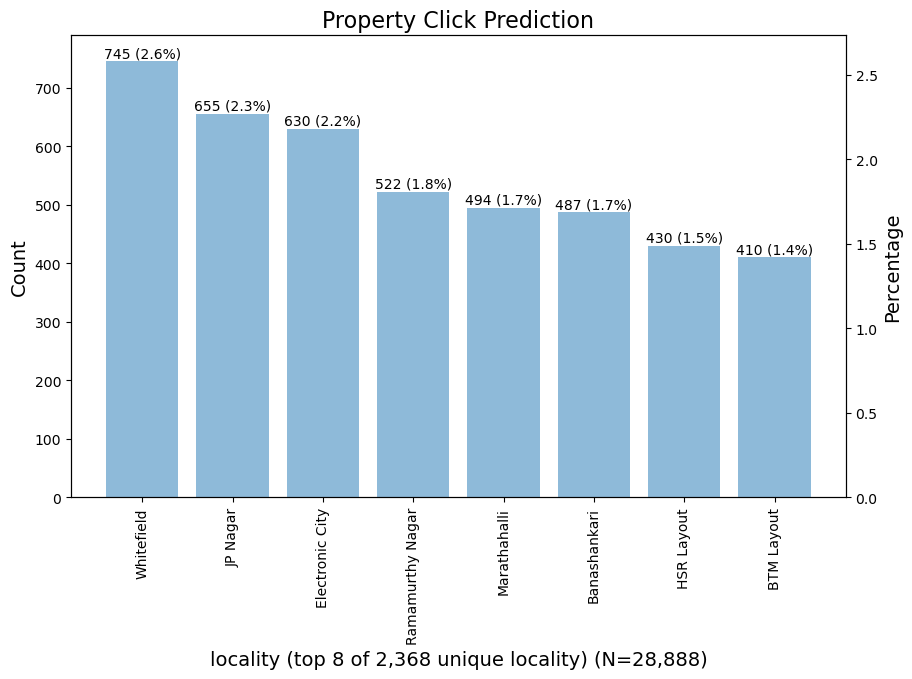

In [191]:
n_largest = 8

ed_data_viz.plot_bar_categorical(dict(vc_locality[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'locality (top {n_largest} of {len(vc_locality):,} unique locality) ({N=:,})',
                     xtick_rotation=90,
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 13 - "parking"

+ parking
    + discrete - categorical - 4 classes
    + no missing values


In [192]:
df_property_features.query("column == 'parking'")

,column,dtype,num_nans,nunique,unique
13,parking,object,0,4,"[BOTH, FOUR_WHEELER, NONE, TWO_WHEELER]"


In [193]:
vc_parking = df_property['parking'].value_counts()
vc_parking

BOTH            13809
TWO_WHEELER     12806
NONE             1277
FOUR_WHEELER      996
Name: parking, dtype: int64

In [194]:
N = vc_parking.sum()
N

28888

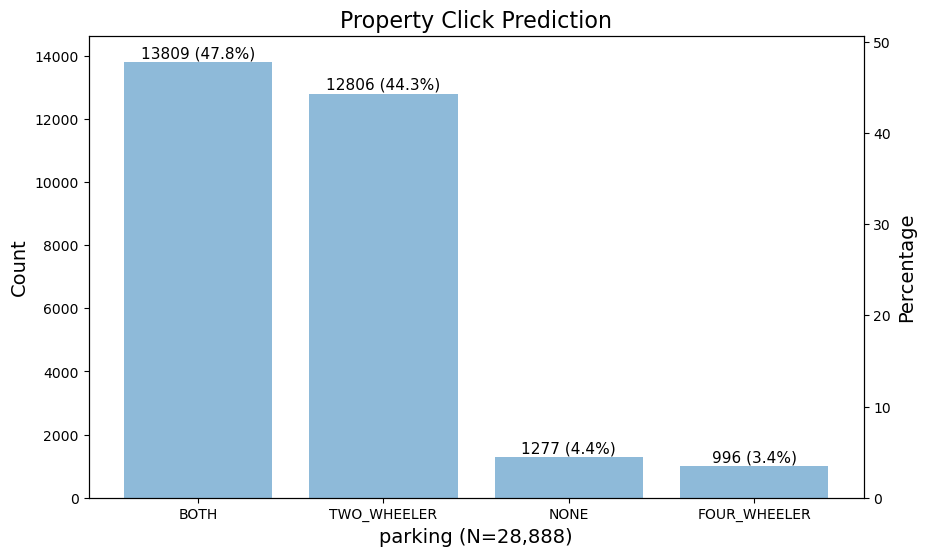

In [195]:
ed_data_viz.plot_bar_categorical(dict(vc_parking),
                     title='Property Click Prediction',
                     xlabel=f'parking ({N=:,})',
                    )

In [196]:
### Feature Encoding

In [197]:
import pandas as pd

# One hot encode the "parking" feature
one_hot_encoded = pd.get_dummies(df_encoded['parking'], prefix='parking')

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_encoded, one_hot_encoded], axis=1)

# Drop one of the encoded columns, for example, 'parking_NONE'
df_encoded = df_encoded.drop('parking_NONE', axis=1)

#copy paste and watch out for version number
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,1,0,1,0,0,1,1,0,0
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,2,1,0,1,0,0,1,1,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,2,1,0,0,0,0,0,0,1,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,3,1,0,1,0,0,0,1,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,1,1,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,2,1,0,1,0,0,1,1,0,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,3,1,0,1,0,0,1,1,0,0
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,2,1,0,1,0,0,1,1,0,0
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,2,1,0,1,0,0,0,0,0,1


## 14 - "property_age"

+ property_age
    + discrete - technically categorical, but high cardinality (nunique=49)
    + no missing values


In [198]:
df_property_features.query("column == 'property_age'")

,column,dtype,num_nans,nunique,unique
14,property_age,int64,0,49,NaN


In [199]:
df_property['property_age'].nunique()

49

In [200]:
vc_property_age = df_property['property_age'].value_counts()
len(vc_property_age)
vc_property_age

49

0      8199
5      3175
1      2697
10     2614
2      2551
3      2326
4      1477
6      1391
8      1259
7       909
15      683
20      454
9       293
12      281
25       92
11       86
30       77
13       67
14       46
16       40
18       36
17       28
40       16
22       13
35       12
19        9
50        8
28        7
24        6
23        6
26        3
80        3
45        3
27        3
21        3
29        2
70        1
37        1
100       1
34        1
800       1
31        1
60        1
457       1
94        1
55        1
33        1
32        1
42        1
Name: property_age, dtype: int64

In [201]:
N = vc_locality.sum()
N
# type(N)   # numpy.int64

28888

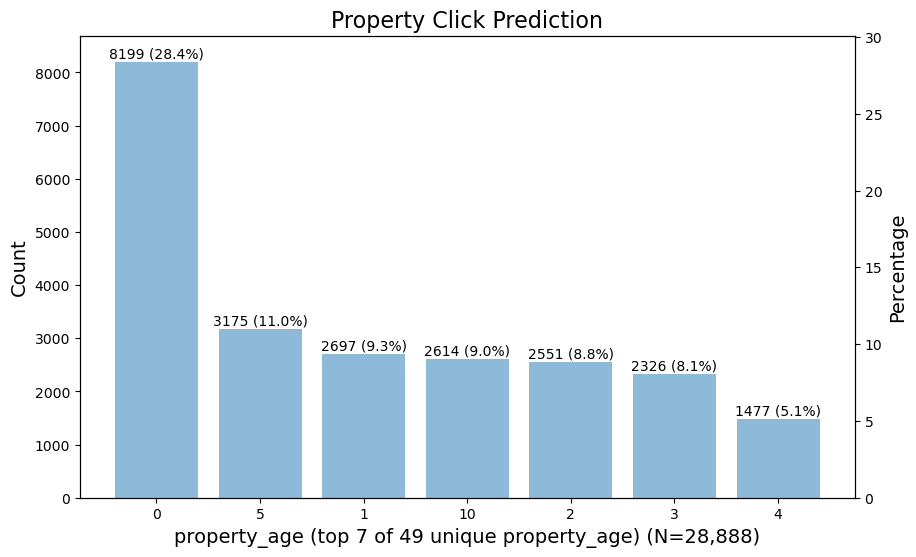

In [202]:
n_largest = 7

ed_data_viz.plot_bar_categorical(dict(vc_property_age[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'property_age (top {n_largest} of {len(vc_property_age)} unique property_age) ({N=:,})',
                     # xtick_rotation=90,
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )


## 15 - "property_size"

+ property_size
    + continuous? / discrete?
    + no missing data

In [203]:
df_property_features.query("column == 'property_size'")

,column,dtype,num_nans,nunique,unique
15,property_size,int64,0,1241,NaN


In [204]:
vc_property_size = df_property['property_size'].value_counts()
len(vc_property_size)
vc_property_size

1241

1200    2327
600     1944
800     1789
1000    1556
400     1393
        ... 
3150       1
355        1
695        1
1322       1
892        1
Name: property_size, Length: 1241, dtype: int64

In [205]:
N = vc_property_size.sum()
N

28888

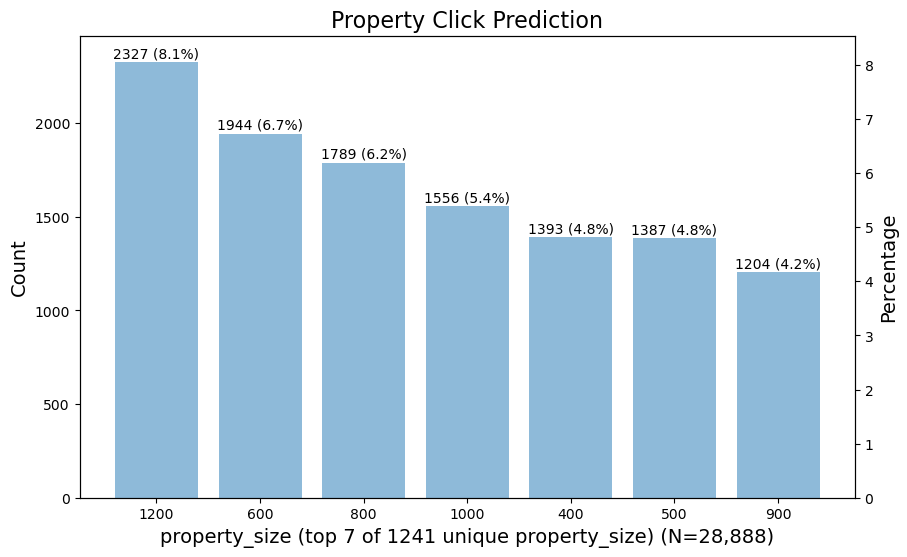

In [206]:
n_largest = 7

ed_data_viz.plot_bar_categorical(dict(vc_property_size[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'property_size (top {n_largest} of {len(vc_property_size)} unique property_size) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 16 - "swimming_pool"

+ swimming_pool
    + discrete - categorical - 2 classes

In [207]:
df_property_features.query("column == 'swimming_pool'")

,column,dtype,num_nans,nunique,unique
16,swimming_pool,int64,0,2,"[0, 1]"


In [208]:
vc_swimming_pool = df_property['swimming_pool'].value_counts()
vc_swimming_pool

0    24769
1     4119
Name: swimming_pool, dtype: int64

In [209]:
N = vc_property_size.sum()
N

28888

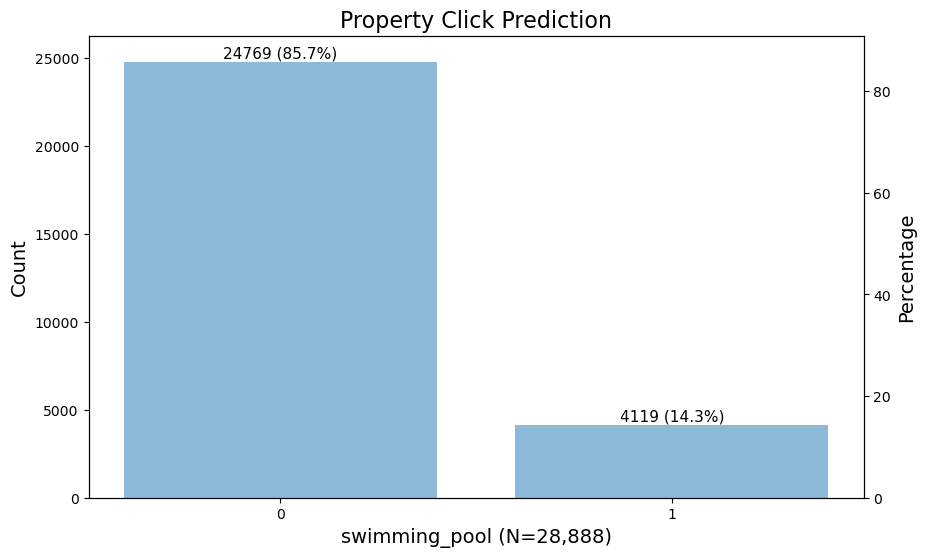

In [210]:
ed_data_viz.plot_bar_categorical(dict(vc_swimming_pool),
                     title='Property Click Prediction',
                     xlabel=f'swimming_pool ({N=:,})',
                    )

## 17 - "pin_code"

+ pin_code
    + <U>P</U>ostal <U>I</U>dentification <U>N</U>umber
    + discrete - technically categorical, but high cardinality (nunique=212)

In [211]:
df_property_features.query("column == 'pin_code'")

,column,dtype,num_nans,nunique,unique
17,pin_code,float64,325,212,NaN


In [212]:
n_largest = 7

In [213]:
# KeyError: 7
# vc_pin_code[:n_largest]

In [214]:
vc_pin_code = df_property['pin_code'].value_counts()
len(vc_pin_code)
type(vc_pin_code)
vc_pin_code
vcd = dict(vc_pin_code)
len(vcd)
type(vcd)

212

pandas.core.series.Series

560076.0     1722
560068.0     1464
560078.0     1370
560100.0     1241
560016.0     1129
             ... 
500029.0        1
567100.0        1
5600018.0       1
500067.0        1
411048.0        1
Name: pin_code, Length: 212, dtype: int64

212

dict

In [215]:
# Get the first n_largest elements from the dictionary
first_n_elements = list(vcd.items())[:n_largest]

# Convert it back to dictionary if needed
first_n_dict = dict(first_n_elements)

first_n_dict

{560076.0: 1722,
 560068.0: 1464,
 560078.0: 1370,
 560100.0: 1241,
 560016.0: 1129,
 560037.0: 1096,
 560043.0: 1055}

In [216]:
N = vc_pin_code.sum()
N

28563

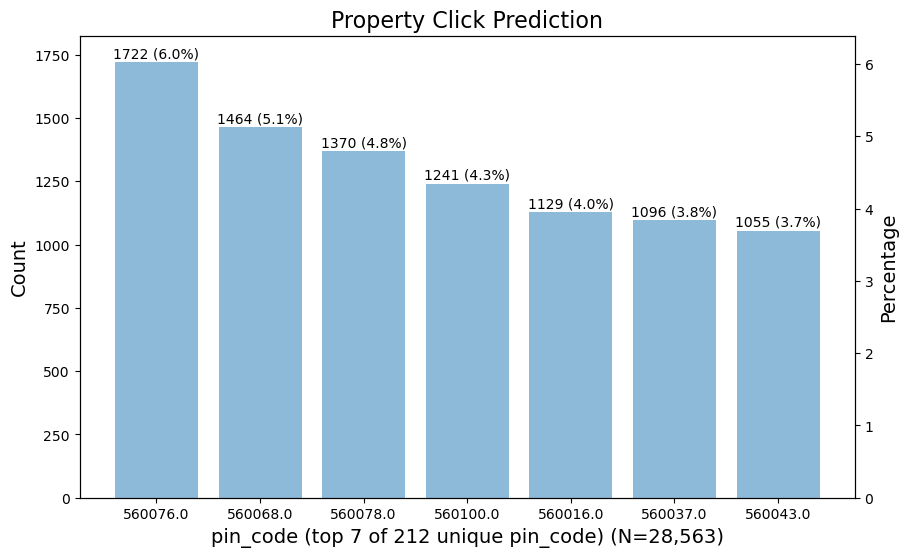

In [217]:
n_largest = 7

ed_data_viz.plot_bar_categorical(# dict(vc_pin_code[:n_largest]),   # KeyError: 7
                     first_n_dict,
                     title='Property Click Prediction',
                     xlabel=f'pin_code (top {n_largest} of {len(vc_pin_code)} unique pin_code) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

In [218]:
df_property['pin_code']

0        560076.0
1        560016.0
2        560075.0
3        560076.0
4        560048.0
           ...   
28883    560030.0
28884    560078.0
28885         NaN
28886    560034.0
28887    560093.0
Name: pin_code, Length: 28888, dtype: float64

In [219]:
df_property['pin_code'].min()

0.0

In [220]:
df_property['pin_code'].max()

5601000.0

In [221]:
df_property['pin_code'].describe()

count    2.856300e+04
mean     5.615600e+05
std      8.979452e+04
min      0.000000e+00
25%      5.600400e+05
50%      5.600670e+05
75%      5.600840e+05
max      5.601000e+06
Name: pin_code, dtype: float64

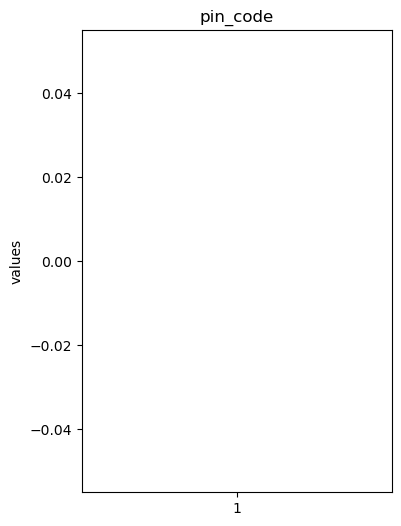

In [222]:
plt.figure(figsize=(4, 6))
plt.boxplot(df_property['pin_code'])
plt.title('pin_code')
plt.ylabel('values')
plt.show();

Notes:

+ Need to drop the NaN

In [223]:
df_property['pin_code'].isna().sum()

325

In [224]:
df_property['pin_code'].dropna()

0        560076.0
1        560016.0
2        560075.0
3        560076.0
4        560048.0
           ...   
28882    560003.0
28883    560030.0
28884    560078.0
28886    560034.0
28887    560093.0
Name: pin_code, Length: 28563, dtype: float64

In [225]:
df_property['pin_code'] = df_property['pin_code'].fillna(-1)

In [226]:
df_property['pin_code'].isna().sum()

0

In [227]:
df_encoded["pin_code"] = df_property['pin_code']

In [228]:
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,bedroom,hall,furnishing_FULLY_FURNISHED,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,1,0,1,0,0,1,1,0,0
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,2,1,0,1,0,0,1,1,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,2,1,0,0,0,0,0,0,1,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,3,1,0,1,0,0,0,1,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,1,1,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,2,1,0,1,0,0,1,1,0,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,3,1,0,1,0,0,1,1,0,0
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,2,1,0,1,0,0,1,1,0,0
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,2,1,0,1,0,0,0,0,0,1


Using `matplotlib`

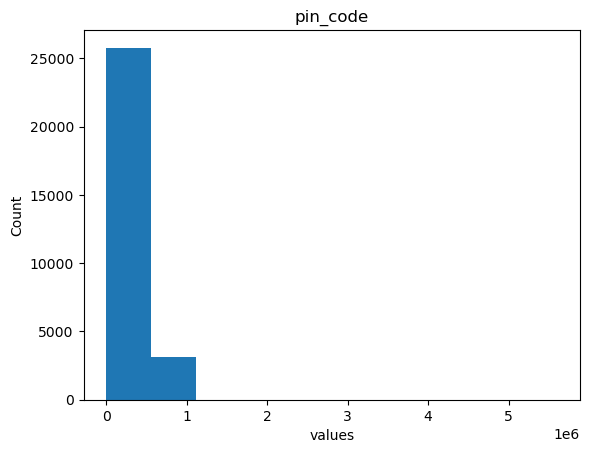

In [229]:
plt.hist(df_property['pin_code'],
         # df_property['pin_code'].dropna(),
         # bins=20
        )
plt.title('pin_code')
plt.ylabel('Count')
plt.xlabel('values')
plt.show();


Notes:

+ There is/are outlier(s) on the high end.

Using `matplotlib`.

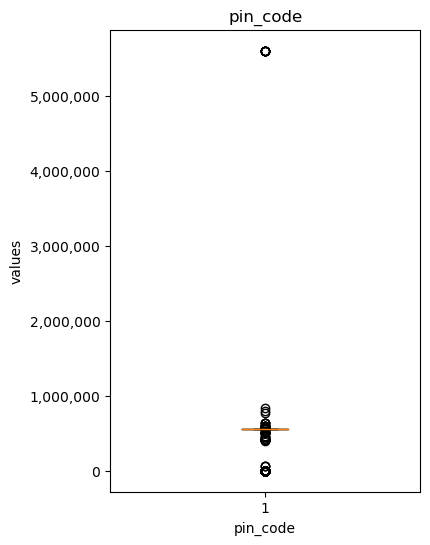

In [230]:
from matplotlib.ticker import FuncFormatter

# Define a custom formatting function to add commas
def format_with_commas(value, _):
    return f'{value:,.0f}'
    
plt.figure(figsize=(4, 6))
plt.boxplot(df_property['pin_code'].dropna())   # <---------
plt.title('pin_code')
plt.ylabel('values')
plt.xlabel('pin_code')

# Set the y-axis tick labels to plain format (no exponential notation)
# plt.ticklabel_format(style='plain', axis='y')

# Set the y-axis tick labels using the custom formatter
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_with_commas))

plt.show();

Notes:

+ boxplot indicates problems
+ do outlier analysis

Using `seaborn`.

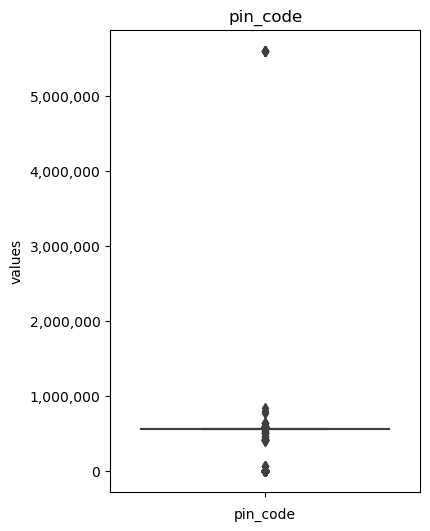

In [231]:
from matplotlib.ticker import FuncFormatter

# Define a custom formatting function to add commas
def format_with_commas(value, _):
    return f'{value:,.0f}'
    
plt.figure(figsize=(4, 6))
# plt.boxplot(df_property['pin_code'].dropna())   # --------->
sns.boxplot(data=df_property, y='pin_code')   # <---------

plt.title('pin_code')
plt.ylabel('values')
plt.xlabel('pin_code')

# Set the y-axis tick labels to plain format (no exponential notation)
# plt.ticklabel_format(style='plain', axis='y')

# Set the y-axis tick labels using the custom formatter
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_with_commas))

plt.show();

Using `plotly` Express.

In [232]:
# Format the y-axis tick labels with commas
# def format_with_commas(value):
#     # return f'{value:,.0f}'
#     return value   # do nothing

# df_property['pin_code_formatted'] = df_property['pin_code'].apply(format_with_commas)

# Create the box plot using Plotly Express
fig = px.box(df_property, y='pin_code', labels={'pin_code': 'pin_code values'}, title='pin_code')

# Update the y-axis tick labels with formatted values
fig.update_yaxes(tickvals=df_property['pin_code'], ticktext=df_property['pin_code'])

# Set the figure height and width
fig.update_layout(height=700, width=400)  # Adjust the values as needed for your desired dimensions

# Show the plot
fig.show();


In [233]:
df_property['pin_code'].dropna()

0        560076.0
1        560016.0
2        560075.0
3        560076.0
4        560048.0
           ...   
28883    560030.0
28884    560078.0
28885        -1.0
28886    560034.0
28887    560093.0
Name: pin_code, Length: 28888, dtype: float64

## 18 - "rent"

+ rent
    + continuous - int - high cardinality
    + high variance?

In [234]:
df_property_features.query("column == 'property_age'")

,column,dtype,num_nans,nunique,unique
14,property_age,int64,0,49,NaN


In [235]:
vc_property_age = df_property['property_age'].value_counts()
len(vc_property_age)
vc_property_age

49

0      8199
5      3175
1      2697
10     2614
2      2551
3      2326
4      1477
6      1391
8      1259
7       909
15      683
20      454
9       293
12      281
25       92
11       86
30       77
13       67
14       46
16       40
18       36
17       28
40       16
22       13
35       12
19        9
50        8
28        7
24        6
23        6
26        3
80        3
45        3
27        3
21        3
29        2
70        1
37        1
100       1
34        1
800       1
31        1
60        1
457       1
94        1
55        1
33        1
32        1
42        1
Name: property_age, dtype: int64

In [236]:
N = vc_property_age.sum()
N

28888

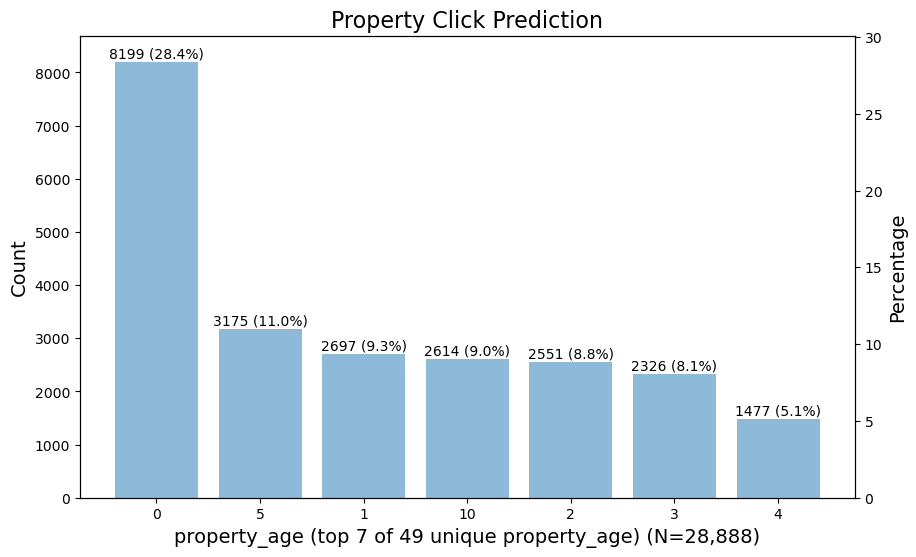

In [237]:
n_largest = 7

ed_data_viz.plot_bar_categorical(dict(vc_property_age[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'property_age (top {n_largest} of {len(vc_property_age)} unique property_age) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 19 - "deposit"

+ deposit
    + str - unique - key
    + contnuous - int64 - high cardinality (nunique=358)
    + variance?


In [238]:
df_property_features.query("column == 'deposit'")

,column,dtype,num_nans,nunique,unique
19,deposit,int64,0,356,NaN


In [239]:
vc_deposit = df_property['deposit'].value_counts()
len(vc_deposit)
vc_deposit

356

100000     4332
50000      2972
150000     2532
200000     1746
60000      1246
           ... 
64000         1
41667         1
1450000       1
219000        1
313500        1
Name: deposit, Length: 356, dtype: int64

In [240]:
N = vc_deposit.sum()
N

28888

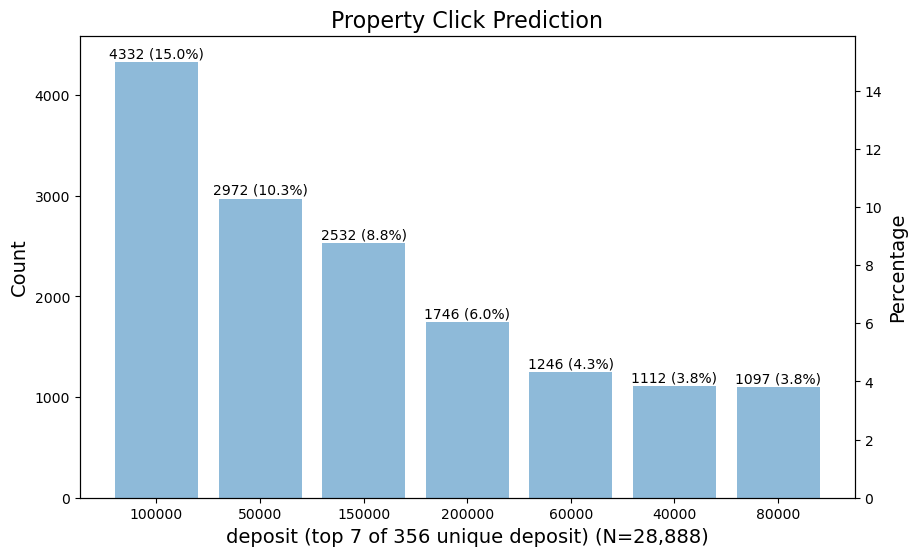

In [241]:
n_largest = 7

ed_data_viz.plot_bar_categorical(dict(vc_deposit[:n_largest]),
                     title='Property Click Prediction',
                     xlabel=f'deposit (top {n_largest} of {len(vc_deposit)} unique deposit) ({N=:,})',
                     fontsize_top_of_bar=10,
                     total=N,   # <---------
                    )

## 20 - "building_type"

+ building_type
    + discrete - categorical - 3 classes
+ Here's what they might stand for based on some educated guesses:
    + AP (Apartment Building): This is a common type of residential building that houses multiple separate housing units. The units are typically rented out to tenants.
    + IF (Industrial Facility): This might refer to a building designed for industrial purposes, such as manufacturing, assembly, warehousing, or research and development.
    + IH (Institutional Housing): This could refer to a housing facility meant for a particular group of people, like students (dormitories), seniors (assisted living facilities), or staff members of an institution (staff housing).

In [242]:
df_property_features.query("column == 'building_type'")

,column,dtype,num_nans,nunique,unique
20,building_type,object,79,3,"[AP, IF, IH, nan]"


In [243]:
vc_building_type = df_property['building_type'].value_counts()
len(vc_building_type)
vc_building_type

3

IF    16557
AP    10193
IH     2059
Name: building_type, dtype: int64

In [244]:
N = vc_building_type.sum()
N

28809

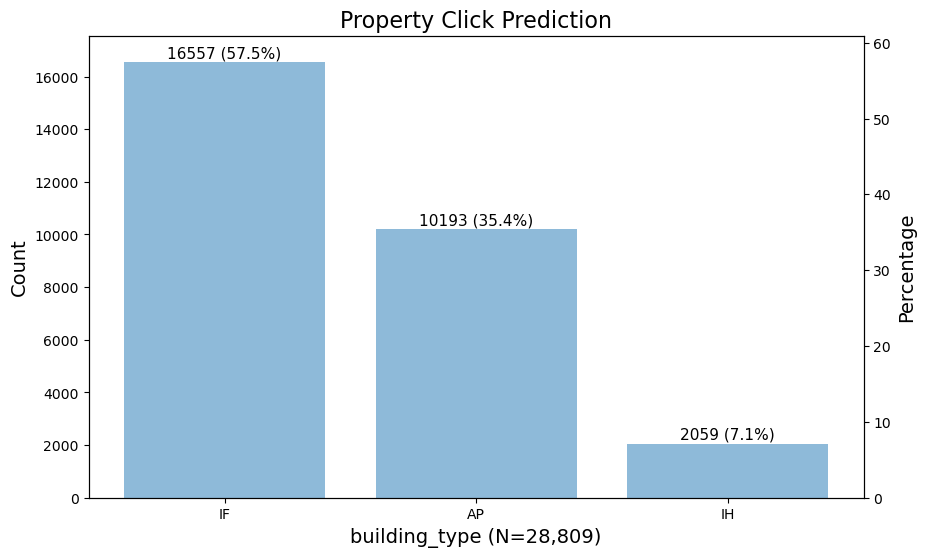

In [245]:
ed_data_viz.plot_bar_categorical(dict(vc_building_type),
                     title='Property Click Prediction',
                     xlabel=f'building_type ({N=:,})',
                    )

Notes:

+ this may be a good parameter to:
    + grouby
    + use as a category on varuous charts to encode:
        + color, size, shape

### Feature Encoding

In [246]:
import pandas as pd

# One hot encode the "building_type" feature
one_hot_encoded = pd.get_dummies(df_encoded['building_type'], prefix='building_type')

# Concatenate the one hot encoded columns with the original dataframe
df_encoded = pd.concat([df_encoded, one_hot_encoded], axis=1)

# Drop one of the encoded columns, for example, 'parking_NONE'
#df_encoded = df_encoded.drop('parking_NONE', axis=1)

#copy paste and watch out for version number
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,furnishing_SEMI_FURNISHED,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,1,0,0,1,0,0
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,1,0,0,1,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,0,0,0,0,0,1,0,1,0,0
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,1,0,0,0,1,0,0,1,0,0
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,1,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,1,0,0,1,1,0,0,0,1,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,1,0,0,1,1,0,0,1,0,0
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,1,0,0,1,1,0,0,1,0,0
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,1,0,0,0,0,0,1,0,1,0


---
# Data File 1 - Photos - "property_photos.tsv"

+ from "Property Click Prediction.docx":  
    property_photos.tsv:  
    + Data containing photo counts of properties.
    + photo_urls column contains string values that you have to parse to obtain the number of photos uploaded on a property.
    + Each value in the photo_url column is supposed to be a string representation of an array of JSON [in Python terms a list of dictionaries] where each JSON object represents one image. However, due to some unforeseen events, these values got corrupted and lost their valid JSON array representation. You can see this if you observe the data closely. Hint: There is a missing “before ‘title’ for the first JSON object in each value. There is also an additional “at the end of each value. Also, you must remove all the \\ to get a valid JSON representation.
    + Your objective is to get the number of photos uploaded for a property. For this, you should correct the corrupt string and make it a valid JSON. Once you have a valid JSON string, you can get the length of this array, which would be the number of photos uploaded on the property.
    + Also note that these are not images, but just names that we use to point to images. You are NOT given the images, nor do we expect you to have them. All that you are expected to do it get the number of photos on each property by cleaning up the corrupt invalid json array string.
    + NULL/NaN values indicate the absence of photos on the property, ie; photo_count = 0
+ TODO (OPTIONAL):
    + Extract photo type and count from ach property id's photos, such as:  
    {'bathroom': 2, 'bathroom': 3, 'pool': 1, 'basement': 2, ... }  
    We can encode this to additional features with a count.

## Data

In [247]:
if speak_on:
    ed_utils.speak(f'reading property photos {FILE_PHOTOS_PATH}')
    # ed_utils.speak('reading property photos')


In [248]:
df_photos = pd.read_csv(FILE_PHOTOS_PATH,
                        sep='\t',   # <---------
                       )
df_photos

,property_id,photo_urls
0,ff808081469fd6e20146a5af948000ea,"[{\title\"":\""Balcony\"",\""name\"":\""IMG_20131006..."
1,ff8080814702d3d10147068359d200cd,NaN
2,ff808081470c645401470fb03f5800a6,"[{\title\"":\""Bedroom\"",\""name\"":\""ff808081470c..."
3,ff808081470c6454014715eaa5960281,"[{\title\"":\""Bedroom\"",\""name\"":\""Screenshot_7..."
4,ff808081474aa867014771a0298f0aa6,"[{\title\"":\""Other\"",\""name\"":\""ff808081474aa8..."
...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,NaN
28884,ff8081815b1fdda8015b1ffee8a305d2,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM..."
28885,ff8081815b1fdda8015b2000369205fd,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM..."
28886,ff8081815b200540015b20158b0103c9,NaN


Notes:

+ all "property_id" are represented, even if the "proprty_id" does not have photo(s).

In [249]:
df_photos['property_id'].nunique()

28888

In [250]:
df_photos.iloc[0]

property_id                     ff808081469fd6e20146a5af948000ea
photo_urls     [{\title\":\"Balcony\",\"name\":\"IMG_20131006...
Name: 0, dtype: object

In [251]:
photo_url = df_photos.iloc[0]['photo_urls']
photo_url

'[{\\title\\":\\"Balcony\\",\\"name\\":\\"IMG_20131006_120837.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_65149_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_65149_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bathroom\\",\\"name\\":\\"IMG_20131006_120734.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_63511_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_63511_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_63511_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bedroom\\",\\"name\\":\\"IMG_20131006_120643.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_16708_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_

In [252]:
type(photo_url)
len(photo_url)

str

2555

In [253]:
photo_url[-1]

'"'

In [254]:
photo_url[:10]   # __repr__()

'[{\\title\\"'

In [255]:
print(photo_url[:10])    # __str__()

[{\title\"


In [256]:
for index, c in enumerate(photo_url[:10]):
    print(index, c)

0 [
1 {
2 \
3 t
4 i
5 t
6 l
7 e
8 \
9 "


In [257]:
photo_url.count('title')

7

In [258]:
photo_url.count('jpg')

35

In [259]:
photo_url.count('png')

0

In [260]:
len(photo_url)

2555

In [261]:
# Find the first occurrence of "title"
index = photo_url.find("title")

if index != -1:
    # Replace the first occurrence of "title" with "\"title"
    photo_url = photo_url.replace("title", "\"title", 1)

len(photo_url)
photo_url

2556

'[{\\"title\\":\\"Balcony\\",\\"name\\":\\"IMG_20131006_120837.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_65149_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_65149_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bathroom\\",\\"name\\":\\"IMG_20131006_120734.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_63511_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_63511_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_63511_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bedroom\\",\\"name\\":\\"IMG_20131006_120643.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_16708_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea

In [262]:
# remove trailing double quote
photo_url = photo_url[0:-1]
len(photo_url)
photo_url

2555

'[{\\"title\\":\\"Balcony\\",\\"name\\":\\"IMG_20131006_120837.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_65149_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_65149_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_65149_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bathroom\\",\\"name\\":\\"IMG_20131006_120734.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_63511_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg\\",\\"medium\\":\\"ff808081469fd6e20146a5af948000ea_63511_medium.jpg\\",\\"large\\":\\"ff808081469fd6e20146a5af948000ea_63511_large.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Bedroom\\",\\"name\\":\\"IMG_20131006_120643.jpg\\",\\"imagesMap\\":{\\"original\\":\\"ff808081469fd6e20146a5af948000ea_16708_original.jpg\\",\\"thumbnail\\":\\"ff808081469fd6e20146a5af948000ea

In [263]:
print(photo_url[0:20])

[{\"title\":\"Balcon


In [264]:
photo_url.count('\\')

196

In [265]:
# Replace all '\\' with ''
# photo_url = photo_url.replace('\\', '')
photo_url = photo_url.replace('\\', '')
len(photo_url)
photo_url

2359

'[{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false},{"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false},{"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_16708_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_16708_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_16708_large.jpg"},"di

In [266]:
2555-196

2359

In [267]:
type(photo_url)

str

In [268]:
# demo/illustration
import ast   # Abstract Syntax Tree

# Your string containing the list representation
pu = "['item1', 'item2', 'item3']"

# Use ast.literal_eval to safely parse the string into a list
try:
    photo_list = ast.literal_eval(pu)
    if isinstance(photo_list, list):
        print("Extracted list:", photo_list)
    else:
        print("The extracted value is not a list.")
except (SyntaxError, ValueError) as e:
    print("Error parsing the string:", e)


Extracted list: ['item1', 'item2', 'item3']


In [269]:
type(photo_list)

list

In [270]:
import ast   # Abstract Syntax Tree

# Use ast.literal_eval to safely parse the string into a list
try:
    photo_list = ast.literal_eval(photo_url)
    print(photo_list)
    if isinstance(photo_list, list):
        print("Extracted list:", photo_list)
    else:
        print("The extracted value is not a list.")
except (SyntaxError, ValueError) as e:
    print("Error parsing the string:", e)


Error parsing the string: malformed node or string on line 1: <ast.Name object at 0x000001C279113C70>


In [271]:
type(photo_url)

str

In [272]:
photo_url

'[{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false},{"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false},{"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_16708_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_16708_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_16708_large.jpg"},"di

In [273]:
photo_url[0]

'['

In [274]:
photo_url[-1]

']'

In [275]:
import json

s = '[{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false},{"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false},{"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_16708_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_16708_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_16708_large.jpg"},"displayPic":false},{"title":"Hall","name":"IMG_20131006_120745.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_69828_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_69828_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_69828_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_69828_large.jpg"},"displayPic":false},{"title":"Hall","name":"IMG_20131006_120919.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_32711_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_32711_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_32711_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_32711_large.jpg"},"displayPic":true},{"title":"Kitchen","name":"IMG_20131006_120612.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_32363_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_32363_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_32363_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_32363_large.jpg"},"displayPic":false},{"title":"Other","name":"IMG_20131006_120853.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_29724_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_29724_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_29724_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_29724_large.jpg"},"displayPic":false}]'

# Parse the JSON string into a Python object
data = json.loads(s)

# Now, 'data' contains the Python object
print(data)


[{'title': 'Balcony', 'name': 'IMG_20131006_120837.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_65149_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_65149_medium.jpg', 'large': 'ff808081469fd6e20146a5af948000ea_65149_large.jpg'}, 'displayPic': False}, {'title': 'Bathroom', 'name': 'IMG_20131006_120734.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_63511_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_63511_medium.jpg', 'large': 'ff808081469fd6e20146a5af948000ea_63511_large.jpg'}, 'displayPic': False}, {'title': 'Bedroom', 'name': 'IMG_20131006_120643.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_16708_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_16708_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_16708_medium.jpg', 'large': 'ff808081469fd

In [276]:
type(data)

list

In [277]:
photo_url.count('title')

7

In [278]:
help(str.find)

Help on method_descriptor:

find(...)
    S.find(sub[, start[, end]]) -> int
    
    Return the lowest index in S where substring sub is found,
    such that sub is contained within S[start:end].  Optional
    arguments start and end are interpreted as in slice notation.
    
    Return -1 on failure.



In [279]:
positions = []

position = 0

while True:
    position = photo_url.find("title", position)
    if position == -1:
        break
    print(f'{position = }')
    positions.append(position)
    position += 5 


positions

position = 3
position = 341
position = 680
position = 1018
position = 1353
position = 1687
position = 2025


[3, 341, 680, 1018, 1353, 1687, 2025]

In [280]:
len(photo_url)

2359

In [281]:
positions.append(len(photo_url)+2)

In [282]:
for i in range(len(positions)-1):
    # print(photo_url[pos:pos+5])
    s = photo_url[positions[i]-2 : positions[i+1]-3]
    print(i)
    print(type(s), '\n', s) 
    # d = dict(s)
    print('-'*90)

0
<class 'str'> 
 {"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false}
------------------------------------------------------------------------------------------
1
<class 'str'> 
 {"title":"Bathroom","name":"IMG_20131006_120734.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_63511_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_63511_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_63511_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_63511_large.jpg"},"displayPic":false}
------------------------------------------------------------------------------------------
2
<class 'str'> 
 {"title":"Bedroom","name":"IMG_20131006_120643.jpg","imagesMap":{"original":"ff80808146

In [283]:
import json

s = '{"title":"Balcony","name":"IMG_20131006_120837.jpg","imagesMap":{"original":"ff808081469fd6e20146a5af948000ea_65149_original.jpg","thumbnail":"ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg","medium":"ff808081469fd6e20146a5af948000ea_65149_medium.jpg","large":"ff808081469fd6e20146a5af948000ea_65149_large.jpg"},"displayPic":false}'

# Parse the JSON string into a Python dictionary
data = json.loads(s)

# Now, 'data' contains the Python dictionary
print(data)
type(data)

{'title': 'Balcony', 'name': 'IMG_20131006_120837.jpg', 'imagesMap': {'original': 'ff808081469fd6e20146a5af948000ea_65149_original.jpg', 'thumbnail': 'ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg', 'medium': 'ff808081469fd6e20146a5af948000ea_65149_medium.jpg', 'large': 'ff808081469fd6e20146a5af948000ea_65149_large.jpg'}, 'displayPic': False}


dict

In [284]:
data.keys()

dict_keys(['title', 'name', 'imagesMap', 'displayPic'])

In [285]:
from pprint import pprint

pprint(data)

{'displayPic': False,
 'imagesMap': {'large': 'ff808081469fd6e20146a5af948000ea_65149_large.jpg',
               'medium': 'ff808081469fd6e20146a5af948000ea_65149_medium.jpg',
               'original': 'ff808081469fd6e20146a5af948000ea_65149_original.jpg',
               'thumbnail': 'ff808081469fd6e20146a5af948000ea_65149_thumbnail.jpg'},
 'name': 'IMG_20131006_120837.jpg',
 'title': 'Balcony'}


In [286]:
two = df_photos.iloc[2]['photo_urls']
two

'[{\\title\\":\\"Bedroom\\",\\"name\\":\\"ff808081470c645401470fb03f5800a6_1968_large.jpg\\",\\"imagesMap\\":{\\"medium\\":\\"ff808081470c645401470fb03f5800a6_46868_medium.jpg\\",\\"large\\":\\"ff808081470c645401470fb03f5800a6_46868_large.jpg\\",\\"original\\":\\"ff808081470c645401470fb03f5800a6_46868_original.jpg\\",\\"thumbnail\\":\\"ff808081470c645401470fb03f5800a6_46868_thumbnail.jpg\\"},\\"displayPic\\":true},{\\"title\\":\\"Balcony\\",\\"name\\":\\"ff808081470c645401470fb03f5800a6_95169_large.jpg\\",\\"imagesMap\\":{\\"medium\\":\\"ff808081470c645401470fb03f5800a6_96389_medium.jpg\\",\\"large\\":\\"ff808081470c645401470fb03f5800a6_96389_large.jpg\\",\\"original\\":\\"ff808081470c645401470fb03f5800a6_96389_original.jpg\\",\\"thumbnail\\":\\"ff808081470c645401470fb03f5800a6_96389_thumbnail.jpg\\"},\\"displayPic\\":false},{\\"title\\":\\"Balcony\\",\\"name\\":\\"ff808081470c645401470fb03f5800a6_47540_large.jpg\\",\\"imagesMap\\":{\\"medium\\":\\"ff808081470c645401470fb03f5800a6_2023

In [287]:
two.count('title')

12

In [288]:
import math

def is_nan(value):
    try:
        # Convert the string to a float and check if it's NaN
        return math.isnan(float(value))
    except (TypeError, ValueError):
        # If the conversion to float fails, it's not NaN
        return False

# Test cases
string1 = ''
string2 = 'NaN'
string3 = 'np.NaN'

print(is_nan(string1))  # False
print(is_nan(string2))  # True
print(is_nan(string3))  # False


False
True
False


In [289]:
def count_photos(json_string):
    if is_nan(json_string):
        return 0  
    return json_string.count('title')

In [290]:
df_photos["photo_count"] = df_photos["photo_urls"].apply(count_photos)
df_photos

,property_id,photo_urls,photo_count
0,ff808081469fd6e20146a5af948000ea,"[{\title\"":\""Balcony\"",\""name\"":\""IMG_20131006...",7
1,ff8080814702d3d10147068359d200cd,NaN,0
2,ff808081470c645401470fb03f5800a6,"[{\title\"":\""Bedroom\"",\""name\"":\""ff808081470c...",12
3,ff808081470c6454014715eaa5960281,"[{\title\"":\""Bedroom\"",\""name\"":\""Screenshot_7...",9
4,ff808081474aa867014771a0298f0aa6,"[{\title\"":\""Other\"",\""name\"":\""ff808081474aa8...",7
...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,NaN,0
28884,ff8081815b1fdda8015b1ffee8a305d2,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM...",7
28885,ff8081815b1fdda8015b2000369205fd,"[{\title\"":\""\"",\""name\"":\""files[]\"",\""imagesM...",6
28886,ff8081815b200540015b20158b0103c9,NaN,0


In [291]:
#df_count_photos = df_photos.copy()
df_count_photos = df_photos.drop("photo_urls", axis=1)
df_count_photos

,property_id,photo_count
0,ff808081469fd6e20146a5af948000ea,7
1,ff8080814702d3d10147068359d200cd,0
2,ff808081470c645401470fb03f5800a6,12
3,ff808081470c6454014715eaa5960281,9
4,ff808081474aa867014771a0298f0aa6,7
...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,0
28884,ff8081815b1fdda8015b1ffee8a305d2,7
28885,ff8081815b1fdda8015b2000369205fd,6
28886,ff8081815b200540015b20158b0103c9,0


### Merging

In [292]:
df_encoded = pd.merge(df_encoded, df_count_photos, on='property_id')
df_encoded

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,1,0,0,1,0,0,7
1,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,1,0,0,1,0,0,0
2,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,0,0,0,0,1,0,1,0,0,12
3,ff808081470c6454014715eaa5960281,BHK3,2017-03-09 22:16:00,2,3,4,SEMI_FURNISHED,0,12.888169,77.591282,...,0,0,0,1,0,0,1,0,0,9
4,ff808081474aa867014771a0298f0aa6,BHK1,2017-03-15 18:29:00,1,1,2,SEMI_FURNISHED,0,12.990243,77.712962,...,0,0,0,1,0,0,0,1,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28883,ff8081815b1fdda8015b1fe675ae0146,BHK2,2017-03-30 21:42:00,1,0,2,SEMI_FURNISHED,0,12.942613,77.621890,...,0,0,1,1,0,0,0,1,0,0
28884,ff8081815b1fdda8015b1ffee8a305d2,BHK3,2017-03-30 22:14:00,2,3,3,SEMI_FURNISHED,0,12.906331,77.591790,...,0,0,1,1,0,0,1,0,0,7
28885,ff8081815b1fdda8015b2000369205fd,BHK2,2017-03-30 21:47:00,2,6,14,SEMI_FURNISHED,1,12.904363,77.526863,...,0,0,1,1,0,0,1,0,0,6
28886,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,0,0,0,0,1,0,1,0,0


---
# Data File 2 - Interactions - "property_interactions.csv"

+ from "Property Click Prediction.docx":  
    property_interactions.csv:  
    + Data containing the timestamps of interaction on the properties.
    + Each request_date value represents the timestamp of a unique valid interaction on a property (contact owner happened and a user received the owner contact phone number)
    + Therefore, if you count the number of times each property has appeared in this table, it tells you the number of interactions received on this property
    + You will use this request_date along with the activation_date in our first table and other features in our study.

## Data

In [293]:
if speak_on:
    ed_utils.speak(f'reading property interactions {FILE_INTERACTIONS_PATH}')
    # ed_utils.speak('reading property interactions')


In [294]:
df_interactions = pd.read_csv(FILE_INTERACTIONS_PATH)
df_interactions

,property_id,request_date
0,ff808081469fd6e20146a5af948000ea,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,2017-03-11 17:48:46
4,ff8080814702d3d10147068359d200cd,2017-03-30 19:59:15
...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-04-03 16:13:55
170607,ff8081815b2007fc015b201c77a20395,2017-04-02 21:54:14
170608,ff8081815b2007fc015b201c77a20395,2017-04-09 11:33:14
170609,ff8081815b2007fc015b201c77a20395,2017-04-04 10:01:12


In [295]:
df_interactions['request_date'] = pd.to_datetime(df_interactions['request_date'],
                                             # format="%d-%m-%Y %H:%M"
                                            )

In [296]:
df_interactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170611 entries, 0 to 170610
Data columns (total 2 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   property_id   170611 non-null  object        
 1   request_date  170611 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(1)
memory usage: 2.6+ MB


In [297]:
df_property.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall', 'distance_to_center'],
      dtype='object')

In [298]:
prop_id = 'ff808081469fd6e20146a5af948000ea'

df = df_property.query("property_id == @prop_id")
df

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,property_age,property_size,swimming_pool,pin_code,rent,deposit,building_type,bedroom,hall,distance_to_center
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,2,850,1,560076.0,12000,120000,AP,2,1,9.08504


In [299]:
activation_date = df['activation_date']
activation_date

0   2017-03-09 14:36:00
Name: activation_date, dtype: datetime64[ns]

In [300]:
df = df_interactions.query("property_id == @prop_id")
df

,property_id,request_date
0,ff808081469fd6e20146a5af948000ea,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,2017-03-11 17:48:46


In [301]:
req_dates = df['request_date']
req_dates

0   2017-03-10 17:42:34
1   2017-03-09 15:51:17
2   2017-03-10 17:30:22
3   2017-03-11 17:48:46
Name: request_date, dtype: datetime64[ns]

In [302]:
len(req_dates)

4

In [303]:
req_dates.shape

(4,)

In [304]:
req_dates.shape[0]

4

In [305]:
print(activation_date, '\n')
for req_date in req_dates:
    delta_datetime = req_date - activation_date
    print(req_date, delta_datetime, '\n')

0   2017-03-09 14:36:00
Name: activation_date, dtype: datetime64[ns] 

2017-03-10 17:42:34 0   1 days 03:06:34
Name: activation_date, dtype: timedelta64[ns] 

2017-03-09 15:51:17 0   0 days 01:15:17
Name: activation_date, dtype: timedelta64[ns] 

2017-03-10 17:30:22 0   1 days 02:54:22
Name: activation_date, dtype: timedelta64[ns] 

2017-03-11 17:48:46 0   2 days 03:12:46
Name: activation_date, dtype: timedelta64[ns] 



In [306]:
df_merged = pd.merge(df_encoded, df_interactions, on='property_id')
df_merged

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,1,1,0,0,1,0,0,7,2017-03-11 17:48:46
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,1,1,0,0,1,0,0,0,2017-03-30 19:59:15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-03 16:13:55
170607,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-02 21:54:14
170608,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-09 11:33:14
170609,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,1,1,0,0,1,0,0,11,2017-04-04 10:01:12


In [307]:
df_merged.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED',
       'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR',
       'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH',
       'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP',
       'building_type_IF', 'building_type_IH', 'photo_count', 'request_date'],
      dtype='object')

In [308]:
df_merged[['property_id', 'activation_date', 'request_date']]

,property_id,activation_date,request_date
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46
4,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-30 19:59:15
...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14
170608,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-09 11:33:14
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12


In [309]:
df_merged['delta_date'] = df_merged['request_date'] - df_merged['activation_date']

In [310]:
df_merged[['property_id', 'activation_date', 'request_date', 'delta_date']]

,property_id,activation_date,request_date,delta_date
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34,1 days 03:06:34
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17,0 days 01:15:17
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22,1 days 02:54:22
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46,2 days 03:12:46
4,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-30 19:59:15,23 days 07:57:15
...,...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55,3 days 17:40:55
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14,2 days 23:21:14
170608,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-09 11:33:14,9 days 13:00:14
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12,4 days 11:28:12


In [311]:
df_merged['delta_date'].dt.days

0          1
1          0
2          1
3          2
4         23
          ..
170606     3
170607     2
170608     9
170609     4
170610     0
Name: delta_date, Length: 170611, dtype: int64

In [312]:
df_merged['delta_date_days'] = df_merged['delta_date'].dt.total_seconds() / (24 * 3600)
df_merged['delta_date_days']

0          1.129560
1          0.052280
2          1.121088
3          2.133866
4         23.331424
            ...    
170606     3.736748
170607     2.973079
170608     9.541829
170609     4.477917
170610     0.529236
Name: delta_date_days, Length: 170611, dtype: float64

In [313]:
df_merged[['property_id', 'activation_date', 'request_date', 'delta_date', 'delta_date_days']]

,property_id,activation_date,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46,2 days 03:12:46,2.133866
4,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-30 19:59:15,23 days 07:57:15,23.331424
...,...,...,...,...,...
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170608,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-09 11:33:14,9 days 13:00:14,9.541829
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [314]:
df_days = df_merged[df_merged['delta_date_days'] <= 7]

In [315]:
df_days[['property_id', 'activation_date', 'request_date', 'delta_date', 'delta_date_days']]

,property_id,activation_date,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,2017-03-09 14:36:00,2017-03-11 17:48:46,2 days 03:12:46,2.133866
5,ff8080814702d3d10147068359d200cd,2017-03-07 12:02:00,2017-03-13 00:18:47,5 days 12:16:47,5.511655
...,...,...,...,...,...
170601,ff8081815b200540015b20158b0103c9,2017-03-30 22:30:00,2017-03-31 16:14:39,0 days 17:44:39,0.739340
170606,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170609,ff8081815b2007fc015b201c77a20395,2017-03-30 22:33:00,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [316]:
len(df_merged)

170611

In [317]:
69781/170611

0.4090064532767524

In [318]:
df_merged['delta_date_days'].describe()

count    170611.000000
mean         12.824682
std          11.207197
min           0.000799
25%           3.700046
50%           9.660324
75%          19.538472
max          67.829988
Name: delta_date_days, dtype: float64

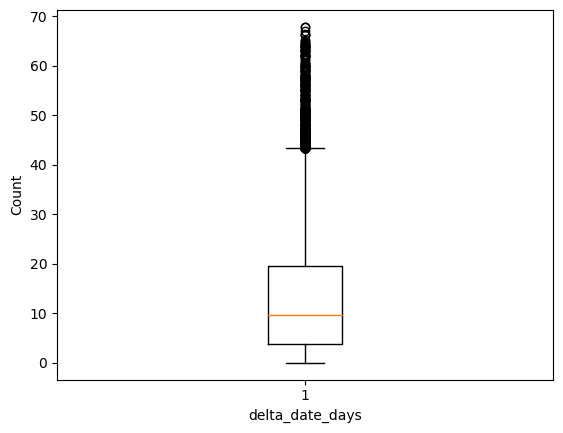

In [319]:
plt.boxplot(df_merged['delta_date_days'])
plt.xlabel("delta_date_days")
plt.ylabel("Count")
plt.show();

In [320]:
import math

num_days = []
percent_interactions = []

for num_day in range(0, math.ceil(df_merged['delta_date_days'].max()+1)):
    df_days = df_merged[df_merged['delta_date_days'] <= num_day]
    percent_interaction = len(df_days)/len(df_merged)
    num_days.append(num_day)
    percent_interactions.append(percent_interaction * 100)
    
    
for num_day, percent_interaction in enumerate(percent_interactions):
    print(num_day, percent_interaction)

0 0.0
1 8.439080715780342
2 15.48434743363558
3 21.701414328501677
4 27.14830813956896
5 32.11164579071689
6 36.71275591843433
7 40.90064532767524
8 44.69055336408555
9 48.14226515289167
10 51.51074666932378
11 54.56506321397799
12 57.45878050067111
13 60.20889626108515
14 62.75855601338718
15 65.33693607094501
16 67.71544624906952
17 69.95035490091495
18 72.13485648639302
19 74.10249046075576
20 75.93941773977059
21 77.7353160112771
22 79.40578274554395
23 81.03697885833856
24 82.56267180896894
25 84.01451254608436
26 85.33212981577975
27 86.62806032436362
28 87.78976736552742
29 88.92861538822233
30 90.02643440340893
31 90.99940801003453
32 91.90146004653862
33 92.73141825556382
34 93.51917519972335
35 94.29462344163038
36 95.04193750696028
37 95.71481323009654
38 96.34607381704579
39 96.88589833011939
40 97.41575865565525
41 97.92275996272221
42 98.38580161888741
43 98.80078072340001
44 99.23979110373892
45 99.64246150599902
46 99.86460427522258
47 99.87808523483245
48 99.8892216797

In [321]:
num_days

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68]

In [322]:
percent_interactions

[0.0,
 8.439080715780342,
 15.48434743363558,
 21.701414328501677,
 27.14830813956896,
 32.11164579071689,
 36.71275591843433,
 40.90064532767524,
 44.69055336408555,
 48.14226515289167,
 51.51074666932378,
 54.56506321397799,
 57.45878050067111,
 60.20889626108515,
 62.75855601338718,
 65.33693607094501,
 67.71544624906952,
 69.95035490091495,
 72.13485648639302,
 74.10249046075576,
 75.93941773977059,
 77.7353160112771,
 79.40578274554395,
 81.03697885833856,
 82.56267180896894,
 84.01451254608436,
 85.33212981577975,
 86.62806032436362,
 87.78976736552742,
 88.92861538822233,
 90.02643440340893,
 90.99940801003453,
 91.90146004653862,
 92.73141825556382,
 93.51917519972335,
 94.29462344163038,
 95.04193750696028,
 95.71481323009654,
 96.34607381704579,
 96.88589833011939,
 97.41575865565525,
 97.92275996272221,
 98.38580161888741,
 98.80078072340001,
 99.23979110373892,
 99.64246150599902,
 99.86460427522258,
 99.87808523483245,
 99.88922167972757,
 99.89918586726529,
 99.9114945695

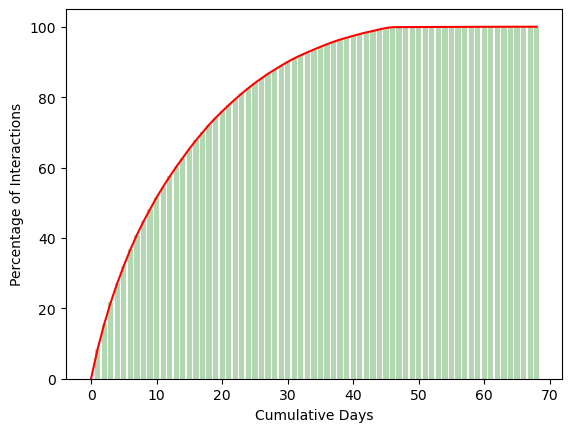

In [323]:
plt.bar(num_days, percent_interactions, color='green', alpha=0.3)
plt.plot(num_days, percent_interactions, color='red')
plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.show();

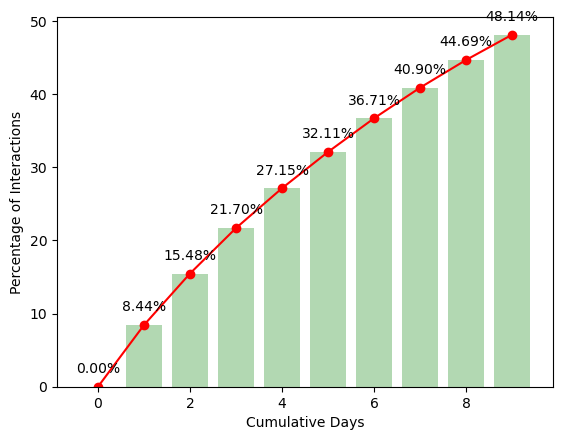

In [324]:
num_days_interactions = 10

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

# Bar plot
plt.bar(num_days_subset, percent_interactions_subset, color='green', alpha=0.3)

# Line plot
plt.plot(num_days_subset, percent_interactions_subset, color='red')

# Scatter plot
plt.scatter(num_days_subset, percent_interactions_subset, color='red')

# Annotate each bar with its value (one decimal place)
for i, (x, y) in enumerate(zip(num_days_subset, percent_interactions_subset)):
    plt.annotate(f'{y:.2f}%', (x, y), textcoords="offset points", xytext=(0,10), ha='center')

plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.show();

Text(0, 30, 'Correlation Coefficient: 0.86')

Text(0.5, 0, 'Cumulative Days')

Text(0, 0.5, 'Percentage of Interactions')

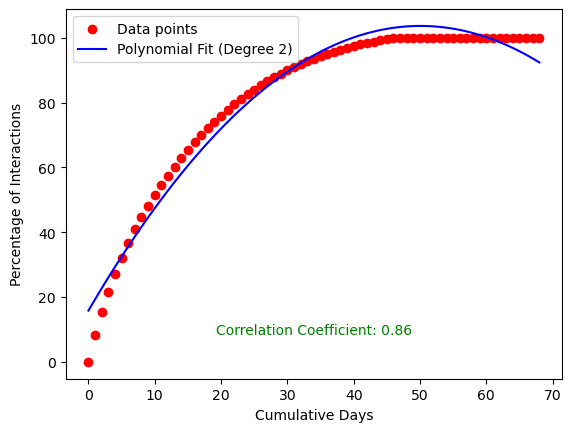

In [325]:
import numpy as np
import matplotlib.pyplot as plt

# Degree of the polynomial fit
degree = 2

# Fit a polynomial to the data
fit_coefficients = np.polyfit(num_days, percent_interactions, degree)
fit_poly = np.poly1d(fit_coefficients)

# Calculate the correlation coefficient
correlation_coefficient = np.corrcoef(num_days, percent_interactions)[0, 1]

# Plot the original data
plt.scatter(num_days, percent_interactions, color='red', label='Data points')

# Plot the fitted polynomial
x_values = np.linspace(min(num_days), max(num_days), 100)
plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

# Add the correlation coefficient to the plot
plt.annotate(f'Correlation Coefficient: {correlation_coefficient:.2f}', 
             xy=(0.5, 0), xytext=(0, 30),
             xycoords='axes fraction', textcoords='offset points',
             ha='center', va='bottom', fontsize=10, color='green')


# Labels and legend
plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.legend()

# Show the plot
plt.show()


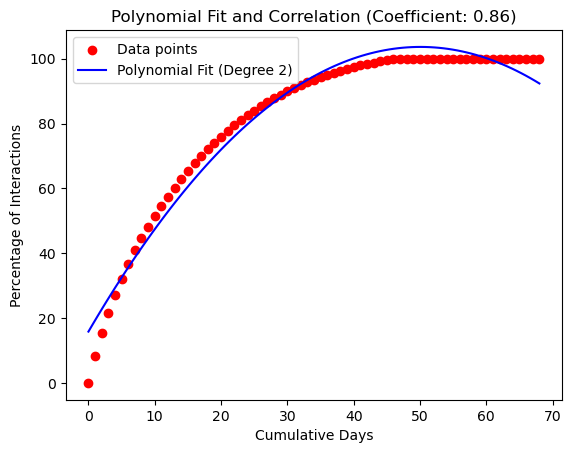

In [326]:
import numpy as np
import matplotlib.pyplot as plt

# Degree of the polynomial fit
degree = 2

# Fit a polynomial to the data
fit_coefficients = np.polyfit(num_days, percent_interactions, degree)
fit_poly = np.poly1d(fit_coefficients)

# Calculate the correlation coefficient
correlation_coefficient = np.corrcoef(num_days, percent_interactions)[0, 1]

# Plot the original data
plt.scatter(num_days, percent_interactions, color='red', label='Data points')

# Plot the fitted polynomial
x_values = np.linspace(min(num_days), max(num_days), 100)
plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

# Add the correlation coefficient to the plot label
plt.title(f'Polynomial Fit and Correlation (Coefficient: {correlation_coefficient:.2f})')

# Labels and legend
plt.xlabel("Cumulative Days")
plt.ylabel("Percentage of Interactions")
plt.legend()

# Show the plot
plt.show();

In [327]:
fit_coefficients

array([-0.03502975,  3.5075483 , 15.83098707])

In [328]:
help(np.poly1d)

Help on class poly1d in module numpy:

class poly1d(builtins.object)
 |  poly1d(c_or_r, r=False, variable=None)
 |  
 |  A one-dimensional polynomial class.
 |  
 |  .. note::
 |     This forms part of the old polynomial API. Since version 1.4, the
 |     new polynomial API defined in `numpy.polynomial` is preferred.
 |     A summary of the differences can be found in the
 |     :doc:`transition guide </reference/routines.polynomials>`.
 |  
 |  A convenience class, used to encapsulate "natural" operations on
 |  polynomials so that said operations may take on their customary
 |  form in code (see Examples).
 |  
 |  Parameters
 |  ----------
 |  c_or_r : array_like
 |      The polynomial's coefficients, in decreasing powers, or if
 |      the value of the second parameter is True, the polynomial's
 |      roots (values where the polynomial evaluates to 0).  For example,
 |      ``poly1d([1, 2, 3])`` returns an object that represents
 |      :math:`x^2 + 2x + 3`, whereas ``poly1d([1, 2

In [329]:
print(np.poly1d(fit_coefficients))
print(correlation_coefficient)

          2
-0.03503 x + 3.508 x + 15.83
0.8640557659713041


In [330]:
fit_poly(3)

26.038364202693025

In [331]:
fit_poly(7)

38.66736736033481

----------------------------------------------------------------------
degree = 1
 
5.237 x + 3.966
0.9907855095968384


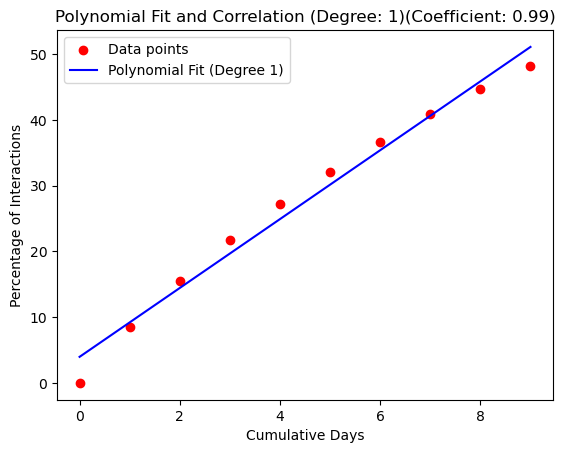

----------------------------------------------------------------------
degree = 2
         2
-0.2786 x + 7.745 x + 0.6228
0.9907855095968384


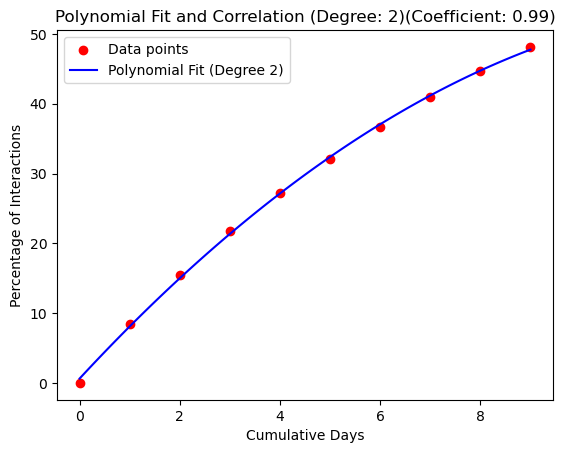

----------------------------------------------------------------------
degree = 3
         3          2
0.01942 x - 0.5408 x + 8.64 x + 0.1334
0.9907855095968384


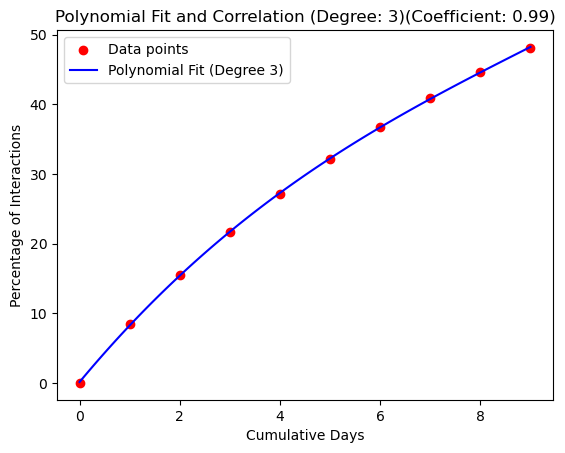

[array([5.23708816, 3.96620489]),
 array([-0.27861538,  7.74462658,  0.62282033]),
 array([ 0.01941967, -0.5407809 ,  8.63987328,  0.1334447 ])]

In [332]:
import numpy as np
import matplotlib.pyplot as plt

num_days_interactions = 10

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

fit_coeff_list = []

for degree in range(1,4):

    # Fit a polynomial to the data
    fit_coefficients = np.polyfit(num_days_subset, percent_interactions_subset, degree)
    fit_coeff_list.append(fit_coefficients)
    fit_poly = np.poly1d(fit_coefficients)
    
    # Calculate the correlation coefficient
    correlation_coefficient = np.corrcoef(num_days_subset, percent_interactions_subset)[0,1]

    # Plot the original data
    _= plt.scatter(num_days_subset, percent_interactions_subset, color='red', label='Data points')

    # Plot the fitted polynomial
    x_values = np.linspace(min(num_days_subset), max(num_days_subset), 100)
    _= plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

    # Add the correlation coefficient to the plot label
    _= plt.title(f'Polynomial Fit and Correlation (Degree: {degree})(Coefficient: {correlation_coefficient:.2f})')

    # Labels and legend
    _= plt.xlabel("Cumulative Days")
    _= plt.ylabel("Percentage of Interactions")
    _= plt.legend()
    
    print("-"*70)
    print("degree =", degree)
    print(np.poly1d(fit_coefficients))
    print(correlation_coefficient)
    
    # Show the plot
    #plt.xlim(0,10)
    #plt.ylim(0,0.5)
    plt.show();

fit_coeff_list    

In [333]:
num_days_interactions = 10

for n_days in range(num_days_interactions):
    y_actual = percent_interactions_subset[n_days]
    print(f'{n_days = }')
    print(f'{y_actual = }')

    for fit_coefficients in fit_coeff_list:
        #print(fit_coefficients)
        degree = len(fit_coefficients) - 1 
        print(f'\t{degree = }')
        fit_poly = np.poly1d(fit_coefficients)
        y_pred = fit_poly(n_days)
        print(f'\t{y_pred = }')
        error = y_pred - y_actual 
        print(f'\t{error = :0.4f}')
        print("\t", "-"*30, sep="")

n_days = 0
y_actual = 0.0
	degree = 1
	y_pred = 3.9662048860752357
	error = 3.9662
	------------------------------
	degree = 2
	y_pred = 0.6228203339761209
	error = 0.6228
	------------------------------
	degree = 3
	y_pred = 0.13344469504974665
	error = 0.1334
	------------------------------
n_days = 1
y_actual = 8.439080715780342
	degree = 1
	y_pred = 9.203293048531634
	error = 0.7642
	------------------------------
	degree = 2
	y_pred = 8.08883153116526
	error = -0.3502
	------------------------------
	degree = 3
	y_pred = 8.251956744140708
	error = -0.1871
	------------------------------
n_days = 2
y_actual = 15.48434743363558
	degree = 1
	y_pred = 14.440381210988035
	error = -1.0440
	------------------------------
	degree = 2
	y_pred = 14.997611969671212
	error = -0.4867
	------------------------------
	degree = 3
	y_pred = 15.40542500210984
	error = -0.0789
	------------------------------
n_days = 3
y_actual = 21.701414328501677
	degree = 1
	y_pred = 19.677469373444435
	error = -

In [334]:
num_days_subset
percent_interactions_subset 

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

[0.0,
 8.439080715780342,
 15.48434743363558,
 21.701414328501677,
 27.14830813956896,
 32.11164579071689,
 36.71275591843433,
 40.90064532767524,
 44.69055336408555,
 48.14226515289167]

----------------------------------------------------------------------
degree = 1
 
6.041 x + 2.105
0.9942431026112815


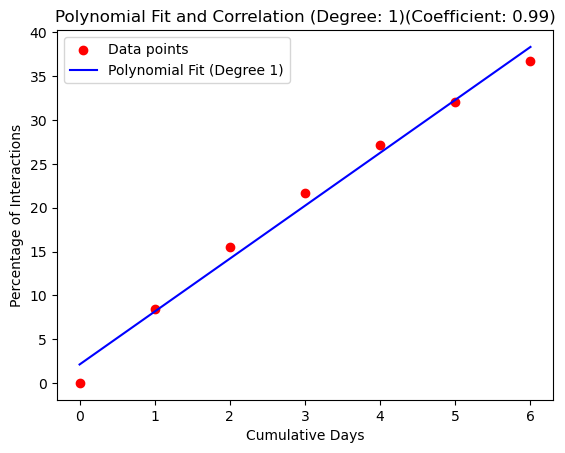

----------------------------------------------------------------------
degree = 2
         2
-0.3707 x + 8.265 x + 0.2517
0.9942431026112815


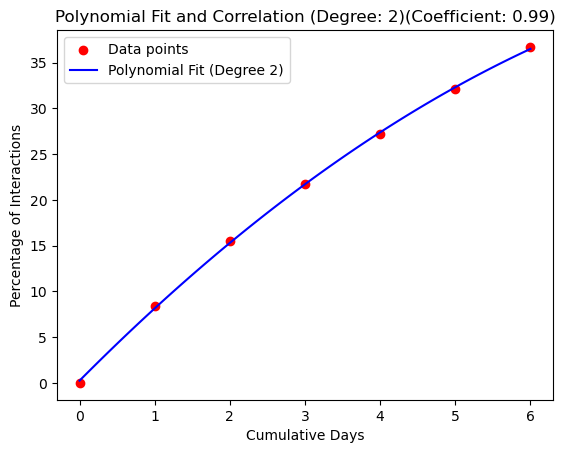

----------------------------------------------------------------------
degree = 3
         3          2
0.03823 x - 0.7148 x + 9.03 x + 0.02236
0.9942431026112815


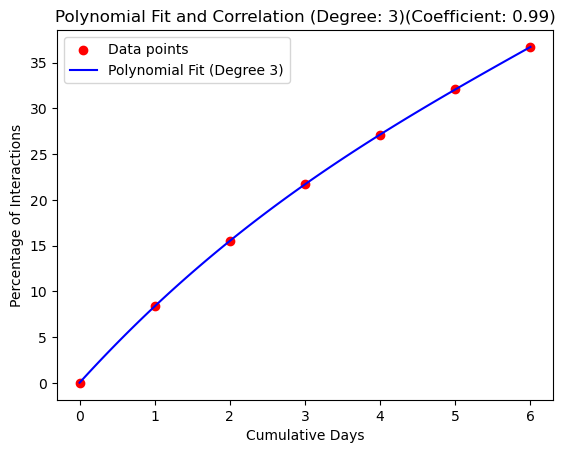

[array([6.04097709, 2.10529048]),
 array([-0.37071243,  8.2652517 ,  0.25172831]),
 array([ 0.03822861, -0.71476997,  9.02982399,  0.02235662])]

In [335]:
import numpy as np
import matplotlib.pyplot as plt


num_days_interactions = 7

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

fit_coeff_list = []

for degree in range(1,4):

    # Fit a polynomial to the data
    fit_coefficients = np.polyfit(num_days_subset, percent_interactions_subset, degree)
    fit_coeff_list.append(fit_coefficients)
    fit_poly = np.poly1d(fit_coefficients)
    
    # Calculate the correlation coefficient
    correlation_coefficient = np.corrcoef(num_days_subset, percent_interactions_subset)[0,1]

    # Plot the original data
    _= plt.scatter(num_days_subset, percent_interactions_subset, color='red', label='Data points')

    # Plot the fitted polynomial
    x_values = np.linspace(min(num_days_subset), max(num_days_subset), 100)
    _= plt.plot(x_values, fit_poly(x_values), color='blue', label=f'Polynomial Fit (Degree {degree})')

    # Add the correlation coefficient to the plot label
    _= plt.title(f'Polynomial Fit and Correlation (Degree: {degree})(Coefficient: {correlation_coefficient:.2f})')

    # Labels and legend
    _= plt.xlabel("Cumulative Days")
    _= plt.ylabel("Percentage of Interactions")
    _= plt.legend()
    
    print("-"*70)
    print("degree =", degree)
    print(np.poly1d(fit_coefficients))
    print(correlation_coefficient)
    
    # Show the plot
    #plt.xlim(0,10)
    #plt.ylim(0,0.5)
    plt.show();

fit_coeff_list    

In [336]:
num_days_interactions = 8

num_days_subset = num_days[:num_days_interactions]
percent_interactions_subset = percent_interactions[:num_days_interactions]

for n_days in range(num_days_interactions):
    y_actual = percent_interactions_subset[n_days]
    print(f'{n_days = }')
    print(f'{y_actual = }')

    for fit_coefficients in fit_coeff_list:
        #print(fit_coefficients)
        degree = len(fit_coefficients) - 1 
        print(f'\t{degree = }')
        fit_poly = np.poly1d(fit_coefficients)
        y_pred = fit_poly(n_days)
        print(f'\t{y_pred = }')
        error = y_pred - y_actual 
        print(f'\t{error = :0.4f}')
        print("\t", "-"*30, sep="")

n_days = 0
y_actual = 0.0
	degree = 1
	y_pred = 2.105290481186542
	error = 2.1053
	------------------------------
	degree = 2
	y_pred = 0.2517283120526914
	error = 0.2517
	------------------------------
	degree = 3
	y_pred = 0.02235662245860005
	error = 0.0224
	------------------------------
n_days = 1
y_actual = 8.439080715780342
	degree = 1
	y_pred = 8.14626757444045
	error = -0.2928
	------------------------------
	degree = 2
	y_pred = 8.14626757444045
	error = -0.2928
	------------------------------
	degree = 3
	y_pred = 8.3756392640345
	error = -0.0634
	------------------------------
n_days = 2
y_actual = 15.48434743363558
	degree = 1
	y_pred = 14.18724466769436
	error = -1.2971
	------------------------------
	degree = 2
	y_pred = 15.299381969174672
	error = -0.1850
	------------------------------
	degree = 3
	y_pred = 15.528753658768721
	error = 0.0444
	------------------------------
n_days = 3
y_actual = 21.701414328501677
	degree = 1
	y_pred = 20.228221760948273
	error = -1.47

In [337]:
df_merged.head()

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,0,0,0,2017-03-30 19:59:15,23 days 07:57:15,23.331424


In [338]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 170611 entries, 0 to 170610
Data columns (total 38 columns):
 #   Column                      Non-Null Count   Dtype          
---  ------                      --------------   -----          
 0   property_id                 170611 non-null  object         
 1   type                        170611 non-null  object         
 2   activation_date             170611 non-null  datetime64[ns] 
 3   bathroom                    170611 non-null  int64          
 4   floor                       170611 non-null  int64          
 5   total_floor                 170611 non-null  int32          
 6   furnishing                  170611 non-null  object         
 7   gym                         170611 non-null  int64          
 8   latitude                    170611 non-null  float64        
 9   longitude                   170611 non-null  float64        
 10  lease_type                  170611 non-null  object         
 11  lift                      

In [339]:
unique_ids = df_merged["property_id"].nunique()
unique_ids

22779

In [340]:
propid_vc = df_merged["property_id"].value_counts()
propid_vc

ff80818159e061800159e4614bf4368d    193
ff8081815ae03cc6015aeb9caaf065ee    183
ff80818159c49a360159c600065a0c66    168
ff8081815a8d7af5015a8d85892d05ef    165
ff80818156b651790156b6cb4b360940    145
                                   ... 
ff808181553483e40155349397170173      1
ff8081815a52a425015a56934cc31473      1
ff80818155388516015538beb1fc043e      1
ff8081815ab805ff015abd5da64406f5      1
ff8081815470b1de0154765ab7ad5a9d      1
Name: property_id, Length: 22779, dtype: int64

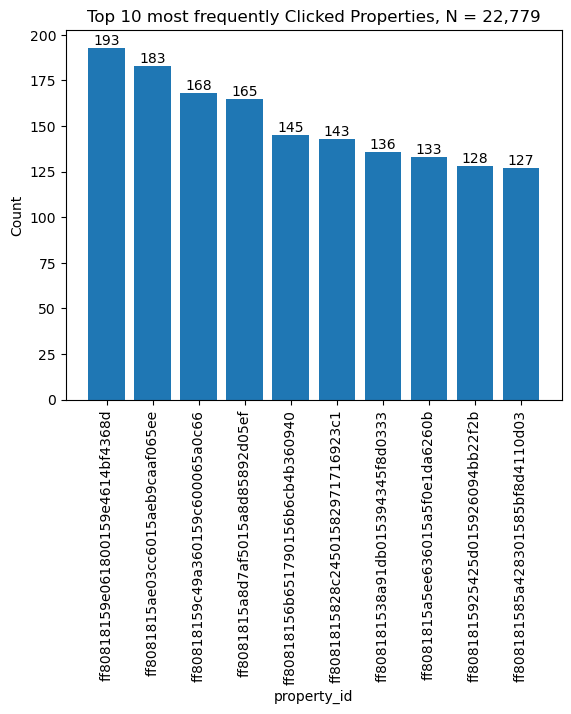

In [341]:
n_largest = 10
plt.bar(propid_vc.index[:n_largest], propid_vc.values[:n_largest])
plt.xticks(rotation=90)
plt.title(f"Top {n_largest} most frequently Clicked Properties, N = {unique_ids:,}")
plt.xlabel("property_id")
plt.ylabel("Count")
# Annotating each bar with its count
for i, v in enumerate(propid_vc.values[:n_largest]):
    plt.text(i, v + 0.1, str(v), ha='center', va='bottom')
plt.show();

In [342]:
propid_vc.values[:n_largest]

array([193, 183, 168, 165, 145, 143, 136, 133, 128, 127], dtype=int64)

In [343]:
df_merged.groupby("property_id")["delta_date_days"].agg(["mean","std","count","min","max"])

,mean,std,count,min,max
property_id,,,,,
ff808081469fd6e20146a5af948000ea,1.109198,0.850015,4,0.052280,2.133866
ff8080814702d3d10147068359d200cd,11.590041,10.551856,12,1.077211,34.315822
ff808081470c645401470fb03f5800a6,3.312425,2.869540,27,0.075613,8.918657
ff808081470c6454014715eaa5960281,10.983554,12.540024,13,0.615660,34.550093
ff808081474aa867014771a0298f0aa6,4.564446,3.171682,68,0.012280,11.666400
...,...,...,...,...,...
ff8081815b1fdda8015b1fe675ae0146,4.075255,2.970595,10,0.609074,8.721204
ff8081815b1fdda8015b1ffee8a305d2,2.493997,1.053083,3,1.758669,3.700382
ff8081815b1fdda8015b2000369205fd,5.390214,1.698996,2,4.188843,6.591586


In [344]:
# var within 0-n days since activation
num_day_range = 7

In [345]:
(df_merged["delta_date_days"] <= num_day_range).sum()

69781

In [346]:
69781/170611

0.4090064532767524

In [347]:
df_merged_filter = df_merged[df_merged["delta_date_days"] <= num_day_range]
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866
5,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170601,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340
170606,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170609,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [348]:
df_merged_filter["delta_date_days"].describe()

count    69781.000000
mean         3.041394
std          2.029319
min          0.000799
25%          1.166192
50%          2.867106
75%          4.814884
max          6.999965
Name: delta_date_days, dtype: float64

In [349]:
df_merged_filter.groupby("property_id")["delta_date_days"].agg(["mean","std","count","min","max"])

,mean,std,count,min,max
property_id,,,,,
ff808081469fd6e20146a5af948000ea,1.109198,0.850015,4,0.052280,2.133866
ff8080814702d3d10147068359d200cd,2.540333,1.878666,5,1.077211,5.511655
ff808081470c645401470fb03f5800a6,2.174467,1.686715,22,0.075613,6.014757
ff808081470c6454014715eaa5960281,2.707812,2.462552,7,0.615660,6.599097
ff808081474aa867014771a0298f0aa6,3.126960,1.949584,52,0.012280,6.826157
...,...,...,...,...,...
ff8081815b1fdda8015b1fe675ae0146,2.920770,1.931134,8,0.609074,6.492465
ff8081815b1fdda8015b1ffee8a305d2,2.493997,1.053083,3,1.758669,3.700382
ff8081815b1fdda8015b2000369205fd,5.390214,1.698996,2,4.188843,6.591586


In [350]:
df_filtered_propid_count = df_merged_filter.groupby("property_id")["delta_date_days"].agg("count")
df_filtered_propid_count

property_id
ff808081469fd6e20146a5af948000ea     4
ff8080814702d3d10147068359d200cd     5
ff808081470c645401470fb03f5800a6    22
ff808081470c6454014715eaa5960281     7
ff808081474aa867014771a0298f0aa6    52
                                    ..
ff8081815b1fdda8015b1fe675ae0146     8
ff8081815b1fdda8015b1ffee8a305d2     3
ff8081815b1fdda8015b2000369205fd     2
ff8081815b200540015b20158b0103c9     2
ff8081815b2007fc015b201c77a20395     4
Name: delta_date_days, Length: 17386, dtype: int64

In [351]:
df_merged_filter.shape
df_filtered_propid_count.shape
type(df_filtered_propid_count)

(69781, 38)

(17386,)

pandas.core.series.Series

In [352]:
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,1,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866
5,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,1,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170601,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340
170606,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748
170607,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079
170609,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,1,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917


In [353]:
# Merge the Series with the DataFrame based on their index
df_merged_filter = pd.merge(df_merged_filter, df_filtered_propid_count.to_frame(), on="property_id")
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days_x,delta_date_days_y
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340,2
69777,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748,4
69778,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079,4
69779,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917,4


In [354]:
#df_merged_filter = df_merged_filter.drop(columns=["delta_date_days_y"])

In [355]:
#df_merged_filter

In [356]:
df_merged_filter = df_merged_filter.rename(columns={'delta_date_days_y': 'n_interactions'})

In [357]:
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days_x,n_interactions
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340,2
69777,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748,4
69778,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079,4
69779,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917,4


In [358]:
df_merged_filter = df_merged_filter.rename(columns={'delta_date_days_x': 'delta_date_days'})
df_merged_filter

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days,n_interactions
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,ff8081815b200540015b20158b0103c9,BHK2,2017-03-30 22:30:00,1,1,2,SEMI_FURNISHED,0,12.938007,77.629097,...,0,1,0,1,0,0,2017-03-31 16:14:39,0 days 17:44:39,0.739340,2
69777,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-03 16:13:55,3 days 17:40:55,3.736748,4
69778,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-02 21:54:14,2 days 23:21:14,2.973079,4
69779,ff8081815b2007fc015b201c77a20395,BHK3,2017-03-30 22:33:00,2,0,4,SEMI_FURNISHED,1,12.978731,77.680988,...,0,0,1,0,0,11,2017-04-04 10:01:12,4 days 11:28:12,4.477917,4


In [359]:
df_merged_filter.head(15)

,property_id,type,activation_date,bathroom,floor,total_floor,furnishing,gym,latitude,longitude,...,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count,request_date,delta_date,delta_date_days,n_interactions
0,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:42:34,1 days 03:06:34,1.129560,4
1,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-09 15:51:17,0 days 01:15:17,0.052280,4
2,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-10 17:30:22,1 days 02:54:22,1.121088,4
3,ff808081469fd6e20146a5af948000ea,BHK2,2017-03-09 14:36:00,1,3,4,SEMI_FURNISHED,1,12.876174,77.596571,...,0,0,1,0,0,7,2017-03-11 17:48:46,2 days 03:12:46,2.133866,4
4,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-13 00:18:47,5 days 12:16:47,5.511655,5
5,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-08 22:30:59,1 days 10:28:59,1.436794,5
6,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-10 19:13:04,3 days 07:11:04,3.299352,5
7,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-08 21:04:23,1 days 09:02:23,1.376655,5
8,ff8080814702d3d10147068359d200cd,BHK2,2017-03-07 12:02:00,2,4,11,SEMI_FURNISHED,1,13.018444,77.678122,...,0,0,1,0,0,0,2017-03-08 13:53:11,1 days 01:51:11,1.077211,5
9,ff808081470c645401470fb03f5800a6,BHK2,2017-03-10 13:43:00,2,0,4,NOT_FURNISHED,1,12.975072,77.665865,...,1,0,1,0,0,12,2017-03-11 09:41:29,0 days 19:58:29,0.832280,22


In [360]:
df_merged_filter.to_csv("Property Clicks interactions Within 0-7 Days.csv")

In [361]:
%ls -l "Property Clicks interactions Within 0-7 Days.csv"

 Volume in drive C is OS
 Volume Serial Number is A240-F140

 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B


 Directory of C:\Users\sabde\OneDrive\Desktop\InnovatiCS - Batch 18\B18.G2.Property Click Prediction.3\B18.G2.Property Click Prediction\14B\14B

12/20/2023  06:49 PM        18,148,486 Property Clicks interactions Within 0-7 Days.csv
               1 File(s)     18,148,486 bytes
               0 Dir(s)  187,464,138,752 bytes free


In [362]:
df_merged_filter.shape

(69781, 39)

In [363]:
df_merged_filter.columns

Index(['property_id', 'type', 'activation_date', 'bathroom', 'floor',
       'total_floor', 'furnishing', 'gym', 'latitude', 'longitude',
       'lease_type', 'lift', 'locality', 'parking', 'property_age',
       'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit',
       'building_type', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED',
       'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR',
       'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH',
       'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP',
       'building_type_IF', 'building_type_IH', 'photo_count', 'request_date',
       'delta_date', 'delta_date_days', 'n_interactions'],
      dtype='object')

In [364]:
df_merged_filter.isna().sum()

property_id                     0
type                            0
activation_date                 0
bathroom                        0
floor                           0
total_floor                     0
furnishing                      0
gym                             0
latitude                        0
longitude                       0
lease_type                      0
lift                            0
locality                        0
parking                         0
property_age                    0
property_size                   0
swimming_pool                   0
pin_code                        0
rent                            0
deposit                         0
building_type                 131
bedroom                         0
hall                            0
furnishing_FULLY_FURNISHED      0
furnishing_SEMI_FURNISHED       0
lease_type_BACHELOR             0
lease_type_COMPANY              0
lease_type_FAMILY               0
parking_BOTH                    0
parking_FOUR_W

# Modeling Finally!

The **bolded** Models/Algorithms are the ones we implemented

| Model/Algorithm Category | Specific Model/Algorithm | Description |
| :------------------------ | :------------------------ | :----------- |
| Linear Models | Linear Regression | Models linear relationship between dependent and independent variables |
|  | <b>Ridge Regression (L2 Regularization) | Adds L2 regularization to prevent overfitting |
|  | <b>Lasso Regression (L1 Regularization) | Implements L1 regularization, leading to sparse models |
|  | Elastic Net Regression | Combines L1 and L2 regularization |
|  | Polynomial Regression | Models as an nth degree polynomial for a nonlinear relationship |
|  | Bayesian Linear Regression | Incorporates Bayesian methods for probabilistic outputs |
|  | Generalized Linear Models (GLM) <BR> <li> <b>Poisson Regression <BR> <li> <b>Negative Binomial Regression| Extends linear models for non-normal error distributions |
| Support Vector Machines | <b>Support Vector Regression (SVR) | Adapts SVM for regression, fitting within a threshold |
|  | Epsilon-Support Vector Regression (ε-SVR) | SVR with a specified margin of tolerance |
| Decision Trees and Ensembles | Decision Trees for Regression | Uses decision trees for regression tasks |
|  | <b>Random Forest Regression | An ensemble of regression trees |
|  | Gradient Boosting Machines (GBM) | Sequentially adds models to correct errors |
|  | <b>Extreme Gradient Boosting (XGBoost) | Efficient and scalable implementation of GBM |
|  | LightGBM | Optimized for speed and efficiency, good for large datasets |
|  | CatBoost | Effective with categorical data and robust to overfitting |
| Nearest Neighbors |<b>K-Nearest Neighbors (KNN) for Regression | Uses 'k' nearest points for predicting output |
| Bayesian Methods | Gaussian Process Regression (GPR) | Assumes a Gaussian process prior over functions |
| Regularization and Optimization Techniques | Regularized Gradient Descent | Minimizes the cost function with regularization |
|  | Quantile Regression | Focuses on estimating medians or other quantiles |
| Additional Techniques | Neural Networks for Regression | Flexible and powerful, suitable for complex relationships |
|  | Robust Regression | Designed to overcome limitations like outliers in data |
|  | Sparse Regression | Useful when dealing with high-dimensional data |
|  | Functional Regression | Deals with data where inputs or outputs are functions |


In [365]:
import importlib
importlib.reload(ed_data_viz)
ed_data_viz.__version__

<module 'ed_data_viz' from 'C:\\Users\\sabde\\OneDrive\\Desktop\\InnovatiCS - Batch 18\\B18.G2.Property Click Prediction.3\\B18.G2.Property Click Prediction\\14B\\14B\\ed_data_viz.py'>

'0.1.4'

In [366]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Sequence, Union, List, Tuple, Optional
import statsmodels.api as sm

def plot_predictions_vs_actuals(
    actual: Union[Sequence[float], np.ndarray, pd.Series],

    predicted: Union[Sequence[float], np.ndarray, pd.Series],

    graph_type: Optional[str] = 'scatter',
    # graph_type supported values are 'scatter', 'bar', 'boxplot', and 'residuals'

    annotate: Optional[bool] = True,

    annotation_fontsize: Union[int, float] = 10,

    max_annotations: Optional[int] = 30,
    # max_annotations is ignored for graph_type = 'box'

    figsize: Union[Tuple[Union[int, float], Union[int, float]],
                   List[Union[int, float]]] = (6, 6),
    # plot_size will be set to a square with the smaller dimension

    color: Optional[str] = 'blue',
    # color is ignored for graph_type = 'boxplot'

    alpha: Union[int, float] = 1,
    # alpha ignored for graph_type = 'boxplot'

    marker_size: Optional[int] = 20,   # only used in graph_type = 'scatter'
    
    show_legend: Optional[bool] = False,
    # show_legend is ignored for graph_type = 'boxplot'

    title: Optional[str] = 'default',

    grid_style: Optional[str] = '-.'
    # grid_style supported values are '-', '--', '-.', ':', 'None', ' ', '',
    # 'solid', 'dashed', 'dashdot', 'dotted'

) -> None:
    """
    Plots a square scatter plot, square bar plot, of boxplot of actual vs. predicted values and
    annotates each point with its (x, y) value.

    This function accepts actual and predicted values as lists or tuples,
    and plots a square scatter plot to visualize the performance of a regression model.
    It also annotates each data point with its (x, y) coordinates.

    Parameters:
        actual (Union[list, tuple, fix this]): Actual values as a list or tuple.
        predicted (Union[list, tuple]): Predicted values as a list or tuple.
        --------MORE HERE-------
        annotation_fontsize allows you to change the annotation text

    Returns:
        None: The function does not return anything but displays a square scatter plot with annotations.
    """
    # Parameter checking
    if not isinstance(actual, (list, tuple, np.ndarray, pd.Series)):
        raise TypeError(
            "actual parameter must be either lists, tuples, pandas Series, or numpy arrays.")

    if not isinstance(predicted, (list, tuple, np.ndarray, pd.Series)):
        raise TypeError(
            "predicted parameter must be either lists, tuples, pandas Series, or numpy arrays.")

    if len(actual) != len(predicted):
        raise ValueError(
            "The actual and predicted lists/tuples must have the same length.")

    # Check for valid graph_type
    if graph_type not in ['scatter', 'bar', 'boxplot', 'residuals',
                          'residuals_q_q_plot', 'residuals_histogram']:
        raise ValueError(
            f"graph_type must be either 'scatter', 'bar', 'boxplot', 'residuals',\n\
'residuals_q_q_plot', or 'residuals_histogram'; you passed {graph_type = }")

    # Check for figsize to be a tuple or list of two positive integers or floats
    if not isinstance(figsize, (tuple, list)) or len(figsize) != 2:
        raise TypeError("figsize must be a tuple or list of two elements.")
    if not all(isinstance(n, (int, float)) and n > 0 for n in figsize):
        raise ValueError(
            "Both elements in figsize must be positive integers or floats.")

    if graph_type != 'boxplot':
        if not isinstance(alpha, (float, int)):
            raise TypeError("alpha must be a float or an int.")
        if not 0 <= alpha <= 1:
            raise ValueError("alpha must be between 0 and 1, inclusive.")

    actual = np.array(actual)
    predicted = np.array(predicted)

    residuals = actual - predicted
    
    N = len(residuals)
    
    _  = plt.figure(figsize=figsize)

    if graph_type == 'residuals_histogram':
        shapiro_wilk_statistic, p_value = shapiro(residuals)

        # A p-value greater than 0.05 usually suggests that the data is normally distributed
        alpha = 0.05
        if p_value > alpha:
            print(f'{p_value=:.3f} > {alpha=:.2f} ==> Residuals are normally distributed.')
        else:
            print(f'{p_value=:.3f} <= {alpha=:.2f} ==> Residuals are not normally distributed.')

        if title == 'default':
            title=f'Distribution of Residuals  ({N=})\n' + \
                                          f'Shapiro-Wilk test={shapiro_wilk_statistic:.3f}   ' + \
                                          f'p-value={p_value:.3f}',
            
        ed_data_viz.plot_histogram_(residuals,
                                    # bins=10,  # defult is 20
                                    title=title,
                                    xlabel='Residual',
                                    figsize=figsize,
                                    # kde=False,
                                   )
        return None


    if graph_type == 'residuals_q_q_plot':
        for fit in (True, False):
            # sm.qqplot() ignores figsize
            sm.qqplot(residuals,
                      fit=fit,
                      line='45',
                      # {'color':color},   # How get this to work?
                     )
            
            if title:
                if title == 'default':
                    title_ = f'Q-Q Plot ({N=})\n{fit=}'
                else:
                    title_ = title
                plt.title(title_)

            if grid_style:   # if None then do not do grid
                plt.grid(linestyle=grid_style)
                
        return None


    if graph_type in ['scatter', 'bar', 'residuals']:
        if graph_type == 'scatter':
            plt.scatter(actual,
                        predicted,
                        color=color,
                        alpha=alpha,
                        s=marker_size,
                        label='(actual, predicted)')
        elif graph_type == 'bar':
            plt.bar(actual,
                    predicted,
                    color=color,
                    alpha=alpha,
                    label='(actual, predicted)')
        else:
            # graph_type == 'residuals'
            # Calculate residuals - done above
            # residuals = np.array(actual) - np.array(predicted)

            # Plotting the residuals
            plt.scatter(range(len(residuals)),   # observation number
                        residuals,
                        color=color,
                        alpha=alpha,
                        s=marker_size,
                        label='(observation number, residual)')
            
            # Drawing a horizontal line at y=0
            plt.axhline(y=0, linestyle='-', color='red', alpha=0.5)

        if annotate and len(actual) <= max_annotations:
            # residuals are different in that the x values are observation numbers,
            # ie. index of the data, not the data values
            if graph_type == 'residuals':
                # Annotating each data point using a ternary operator for y_offset
                for i, value in enumerate(residuals):
                    y_offset = -15 if value >= 0 else 8
                    plt.annotate(f'{value:.2f}',
                                 (i, value),
                                 textcoords="offset points",
                                 xytext=(0, y_offset),
                                 ha='center',
                                 fontsize=annotation_fontsize)
            else:
                for i in range(len(actual)):
                    plt.annotate(f'({actual[i]}, {predicted[i]})', (actual[i], predicted[i]),
                                 textcoords="offset points", xytext=(0, 5), ha='center',
                                 fontsize=annotation_fontsize
                                 )
    elif graph_type == 'boxplot':   # box plots are not annotated with values
        data = (actual, predicted)   # can also be a list
        plt.boxplot(data, labels=['Actual', 'Predicted'])

    if graph_type != 'boxplot':
        if graph_type == 'residuals':
            plt.xlabel('Observation Number')
            plt.ylabel('Residuals')
        else:
            # graph_type in ['scatter', 'bar']
            plt.xlabel('Actual Values')
            plt.ylabel('Predicted Values')
            plt.axis('square')
        if show_legend:
            plt.legend()

    if title:
        if title == 'default':
            if graph_type == 'residuals':
                title = f'Residuals Plot ({N=})'
            else:
                title = f'Actual vs. Predicted Values (N={len(actual)})'
        plt.title(title)

    if grid_style:   # if None then do not do grid
        plt.grid(linestyle=grid_style)

    # plt.show()

## "Residual" Plots

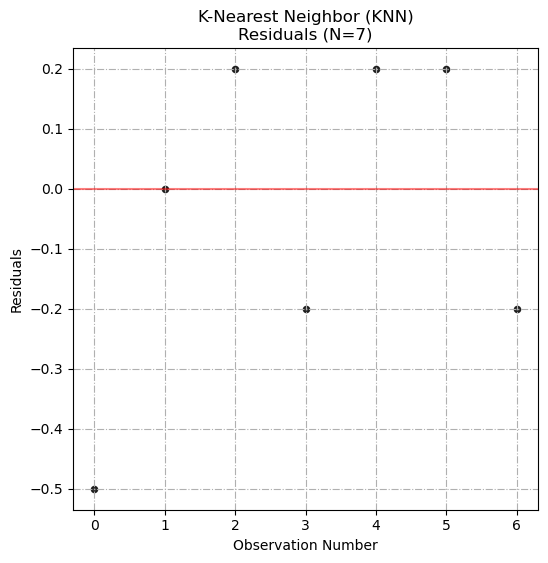

--------------------------------------------------------------------------------


<Figure size 600x600 with 0 Axes>

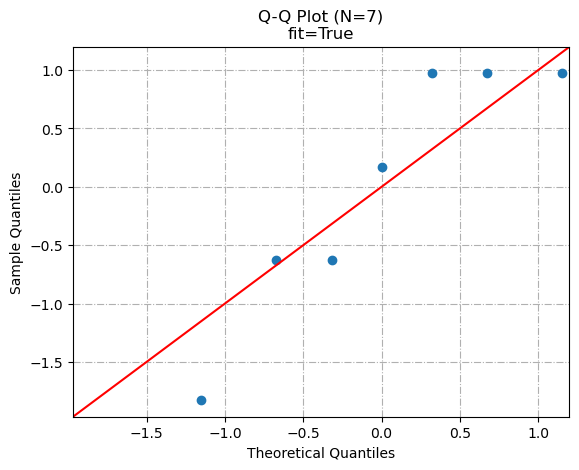

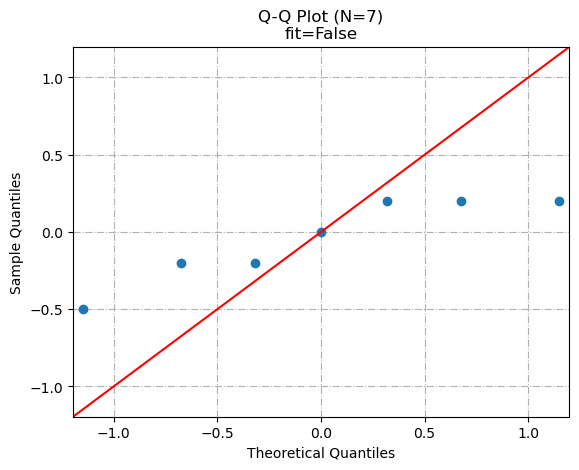

--------------------------------------------------------------------------------
p_value=0.158 > alpha=0.05 ==> Residuals are normally distributed.


<Figure size 600x600 with 0 Axes>

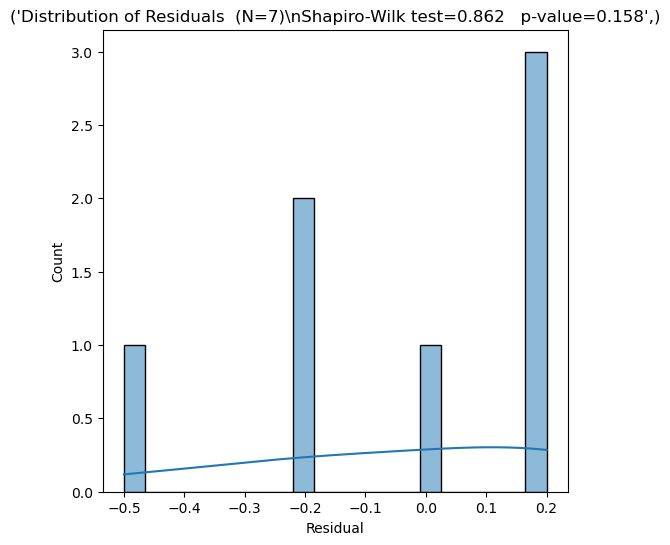

In [367]:
# demo/test
# Mock data
actual = [1, 2, 3, 4, 5, 7, 9]
predicted = [1.5, 2, 2.8, 4.2, 4.8, 6.8, 9.2]

N = len(actual)


plot_predictions_vs_actuals(actual,
                            predicted,
                            color='black',   # default is 'blue'
                            alpha=0.8,   # default is 1.0
                            # marker_size=600,   # default is 20
                            annotate=False,
                            title=f'K-Nearest Neighbor (KNN)\nResiduals ({N=})',   # just an example title
                            graph_type='residuals',   # <---------
                            )
plt.show()

print('-'*80)

plot_predictions_vs_actuals(actual,
                            predicted,
                            # figsize=(11,11),   # the internal function ignores figsie
                            # color='green',   # ignored in Q-Q plot, for now
                            # alpha=0.4,   # ignored in Q-Q plot, for now
                            # annotate=True,   # ignored in Q-Q plot
                            # title=f'K-Nearest Neighbor (KNN)\nQ-Q Plot  ({N=})',   # just an example title
                            graph_type='residuals_q_q_plot',   # <---------
                            )
plt.show()

print('-'*80)

plot_predictions_vs_actuals(actual,
                            predicted,
                            # figsize=(11,11),   # the internal function ignores figsie
                            # color='green',   # ignored in Q-Q plot, for now
                            # alpha=0.4,   # ignored in Q-Q plot, for now
                            # annotate=True,   # ignored in Q-Q plot
                            # title=f'K-Nearest Neighbor (KNN)\nQ-Q Plot  ({N=})',   # just an example title
                            graph_type='residuals_histogram',   # <---------
                            )
plt.show()


## "$y$ verus $\hat{y}$" Plots

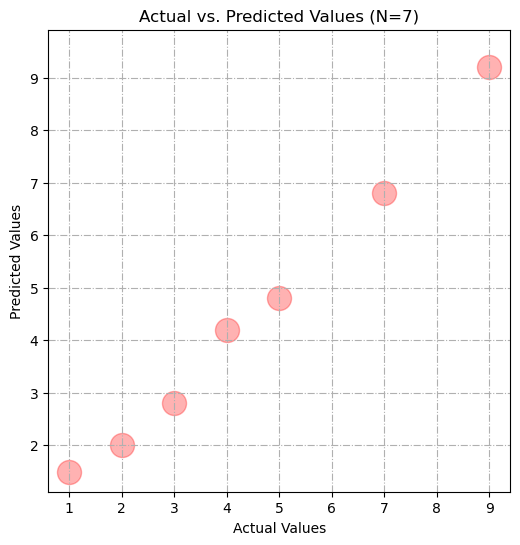

--------------------------------------------------------------------------------


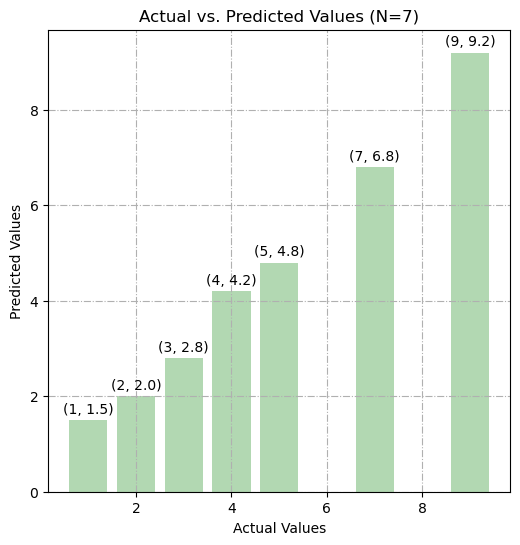

--------------------------------------------------------------------------------


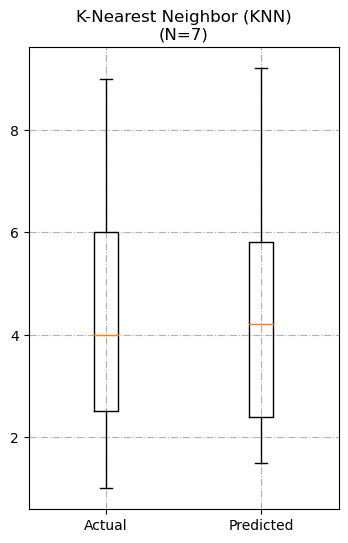

In [368]:
# demo/test
# Mock data
actual = [1, 2, 3, 4, 5, 7, 9]
predicted = [1.5, 2, 2.8, 4.2, 4.8, 6.8, 9.2]

N = len(actual)


plot_predictions_vs_actuals(actual,
                            predicted,
                            color='red',
                            alpha=0.3,
                            marker_size=300,   # default is 20
                            annotate=False,   # default is True
                            # title=f'K-Nearest Neighbor (KNN)\nResiduals ({N=})',   # just an example title
                            graph_type='scatter',   # <--------- default
                            )
plt.show()

print('-'*80)

plot_predictions_vs_actuals(actual,
                            predicted,
                            # figsize=(8,8),   # default is (6, 6)
                            color='green',   # default is blue
                            alpha=0.3,   # default is 1.0
                            # annotate=True,   # ignored in Q-Q plot
                            # title=f'K-Nearest Neighbor (KNN)\n({N=})',   # just an example title
                            graph_type='bar',   # <---------
                            )
plt.show()

print('-'*80)

plot_predictions_vs_actuals(actual,
                            predicted,
                            figsize=(4,6),   # default is (6, 6)
                            # color='green',   # ignored in boxplot, for now
                            # alpha=0.4,   # ignored in boxplot, for now
                            # annotate=True,   # ignored in boxplot
                            title=f'K-Nearest Neighbor (KNN)\n({N=})',   # just an example title
                            graph_type='boxplot',   # <---------
                            )
plt.show()


## Residual Normalcy

+ TODO
+ heterodacity
+ residuals normal or uniform?

In statistical modeling, particularly in regression analysis, the residuals (or errors) are the differences between the observed values and the values predicted by the model. The distribution of these residuals is important for the validity of the model. Two common types of distributions that are considered for residuals are normal (Gaussian) and uniform distributions.

**1. Normal Distribution:**
When residuals are normally distributed, it implies that the model captures the data well, and the errors are just due to random fluctuations that are expected in any real-world data. Normal distribution of residuals is a key assumption in linear regression models.

To check for normality of residuals, you can use:

+ **Graphical Methods:**
Such as a histogram or a Q-Q (quantile-quantile) plot. A Q-Q plot compares the quantiles of the residuals to the quantiles of a normal distribution. If the points lie approximately along a straight line, it suggests normality.
+ **Statistical Tests:**
Like the Shapiro-Wilk test or the Kolmogorov-Smirnov test, which formally test the hypothesis that the data is normally distributed.

**2. Uniform Distribution:**
This is less common for residuals. A uniform distribution would mean that all values within a certain range are equally likely, and values outside this range are impossible. It's rare for real-world data to have uniformly distributed errors unless the data or the model is artificially constrained in some way.

For uniform distribution, you can use:

+ **Graphical Methods:**
A histogram is useful here. For a uniformly distributed variable, the histogram should show roughly equal frequencies across the range of values.
+ **Statistical Tests:**
There are tests like the Chi-Square Goodness of Fit test that can be used to assess whether a set of observed frequencies matches the expected frequencies of a uniform distribution.

In practice, the choice between normal and uniform distribution for residuals depends on the nature of your data and the specifics of your modeling problem. Most standard regression models, like linear regression, assume normally distributed errors. However, other types of models might not make this assumption. It's always important to understand the assumptions underlying your specific model and to test those assumptions with your data.

+ Normality is the assumption that the underlying residuals are normally distributed, or approximately so.
+ While a residual plot, or normal plot of the residuals can identify non-normality, you can formally test the hypothesis using the Shapiro-Wilk or similar test.
+ The Shapiro-Wilk test for normality assesses whether a given dataset (in this case, the residuals) is likely to be drawn from a normal distribution.

In [369]:
alpha = 0.05

print('---------------------------------------------------------------------------')

from scipy.stats import shapiro

# Mock data
actual = [1, 2, 3, 4, 5, 7, 9, 11, 14, 15]
predicted = [1.5, 2, 2.8, 4.2, 4.8, 6.8, 9.2, 11.2, 13.97, 15.11]

# Calculate residuals
residuals = np.array(actual) - np.array(predicted)

# print(f'{residuals = }')

shapiro_wilk_statistic, p_value = shapiro(residuals)

print('Shapiro-Wilk statistic =', f'{shapiro_wilk_statistic:.3f}')

# A p-value greater than 0.05 usually suggests that the data is normally distributed
if p_value > alpha:
    print(f'{p_value=:0.3f} > {alpha=:.2f} ---> Residuals are normally distributed.')
else: 
    print(f'{p_value=:0.3f} <= {alpha=:.2f} ---> Residuals are not normally distributed.')
    
print('---------------------------------------------------------------------------')

from scipy.stats import kstest

kolmogorov_smirnov_statistic, p_value = kstest(residuals, 'norm')

print('Kolmogorov Smirnov statistic =', f'{kolmogorov_smirnov_statistic:.3f}')

# A p-value greater than 0.05 usually suggests that the data is normally distributed
if p_value > alpha:
    print(f'{p_value=:0.3f} > {alpha=:.2f} ---> Residuals are normally distributed.')
else: 
    print(f'{p_value=:0.3f} <= {alpha=:.2f} ---> Residuals are not normally distributed.')
    
print('---------------------------------------------------------------------------')

from statsmodels.stats.diagnostic import lilliefors

lilliefors_statistic, p_value = lilliefors(residuals)

print('Lilliefors statistic =', f'{lilliefors_statistic:.3f}')

# A p-value greater than 0.05 usually suggests that the data is normally distributed
if p_value > alpha:
    print(f'{p_value=:0.3f} > {alpha=:.2f} ---> Residuals are normally distributed.')
else: 
    print(f'{p_value=:0.3f} <= {alpha=:.2f} ---> Residuals are not normally distributed.')
    
print('---------------------------------------------------------------------------')

from scipy.stats import normaltest

# ValueError: skewtest is not valid with less than 8 samples; 7 samples were given.
d_agostino_k2_statistic, p_value = normaltest(residuals)

print("D’Agostino’s K2 statistic =", f'{d_agostino_k2_statistic:.3f}')

# A p-value greater than 0.05 usually suggests that the data is normally distributed
if p_value > alpha:
    print(f'{p_value=:0.3f} > {alpha=:.2f} ---> Residuals are normally distributed.')
else: 
    print(f'{p_value=:0.3f} <= {alpha=:.2f} ---> Residuals are not normally distributed.')
    
print('---------------------------------------------------------------------------')


---------------------------------------------------------------------------
Shapiro-Wilk statistic = 0.905
p_value=0.246 > alpha=0.05 ---> Residuals are normally distributed.
---------------------------------------------------------------------------
Kolmogorov Smirnov statistic = 0.421
p_value=0.040 <= alpha=0.05 ---> Residuals are not normally distributed.
---------------------------------------------------------------------------
Lilliefors statistic = 0.171
p_value=0.558 > alpha=0.05 ---> Residuals are normally distributed.
---------------------------------------------------------------------------
D’Agostino’s K2 statistic = 0.570
p_value=0.752 > alpha=0.05 ---> Residuals are normally distributed.
---------------------------------------------------------------------------


C:\Users\sabde\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:1736: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=10



Primitive.

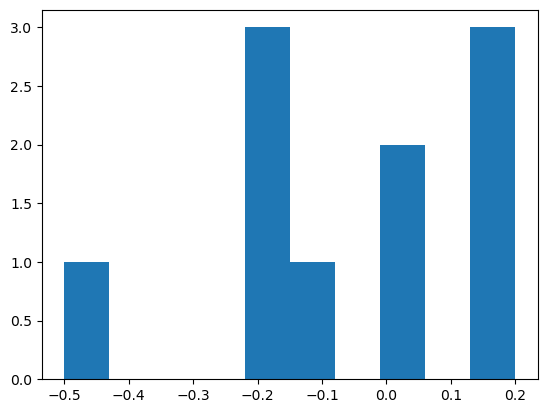

In [370]:
plt.hist(residuals);

Nicer, easier, ...

In [371]:
residuals

array([-0.5 ,  0.  ,  0.2 , -0.2 ,  0.2 ,  0.2 , -0.2 , -0.2 ,  0.03,
       -0.11])

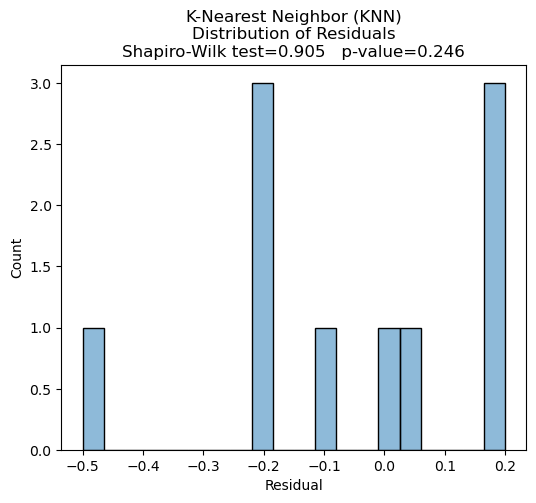

In [372]:
stat_shapiro, p_value = shapiro(residuals)

ed_data_viz.plot_histogram_(residuals,
                            title='K-Nearest Neighbor (KNN)\n' +
                                  'Distribution of Residuals\n' + 
                                  f'Shapiro-Wilk test={stat_shapiro:.3f}   ' +
                                  f'p-value={p_value:.3f}',
                            xlabel='Residual',
                            kde=False,
                           )

In [373]:
N = 1_000   # number of samples

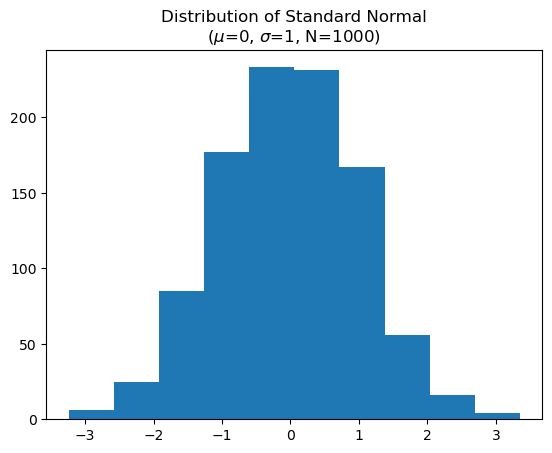

In [374]:
from scipy.stats import norm
import matplotlib.pyplot as plt

my_normal_data = norm.rvs(size=N)   # <---------
plt.hist(my_normal_data)
plt.title(f'Distribution of Standard Normal\n($\mu$=0, $\sigma$=1, {N=})')
plt.show();

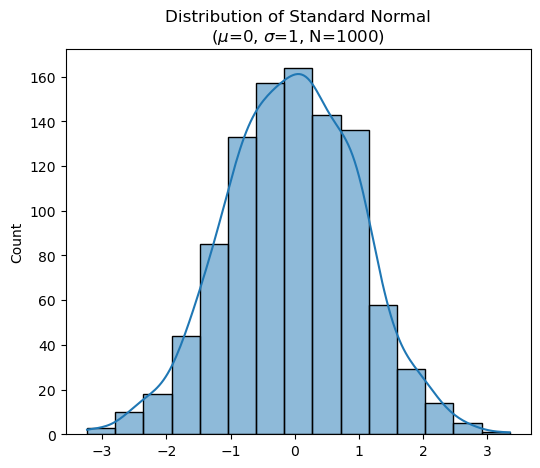

In [375]:
ed_data_viz.plot_histogram_(my_normal_data,
                            xlabel='',
                            bins=15,   # default is 20
                           )
plt.title(f'Distribution of Standard Normal\n($\mu$=0, $\sigma$=1, {N=})')
plt.show();

mean_ = -0.035
std_ = 1.014


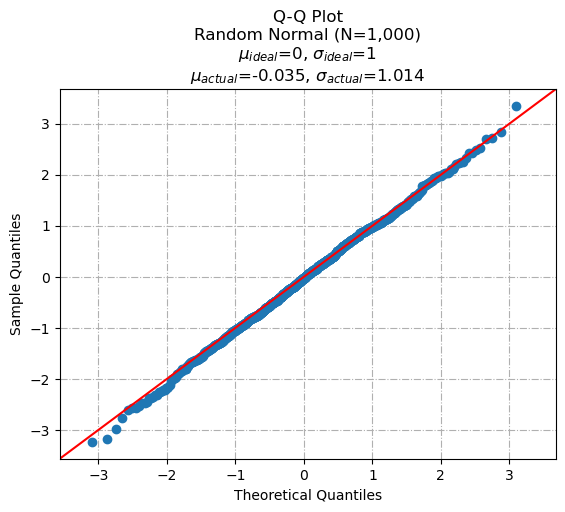

In [376]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Calculate the mean
mean_ = np.mean(my_normal_data)

# Calculate the standard deviation
std_ = np.std(my_normal_data)

print(f'{mean_ = :.3f}\n{std_ = :.3f}')


sm.qqplot(my_normal_data,
          line='45'
         )

plt.title(f'Q-Q Plot\nRandom Normal ({N=:,})\n' +
          '$\mu_{ideal}$=0, $\sigma_{ideal}$=1\n' +
          '$\mu_{actual}$=' + f'{mean_:.3f},' + ' $\sigma_{actual}$='  + f'{std_:.3f}')
plt.grid(linestyle='-.')
plt.show();


mean_ = 0.019
std_ = 0.979


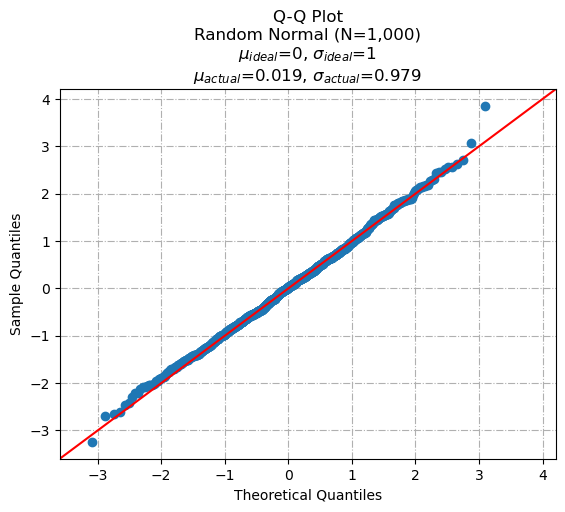

In [377]:
import numpy as np 
import statsmodels.api as sm 
import matplotlib.pyplot as plt 


# Generate random data
N = 1_000
np.random.seed(42)
data = np.random.normal(0, 1, N)   # <---------

# Calculate the mean
mean_ = np.mean(data)

# Calculate the standard deviation
std_ = np.std(data)

print(f'{mean_ = :.3f}\n{std_ = :.3f}')


# Create Q-Q plot
fig = sm.qqplot(data, line ='45')
plt.title(f'Q-Q Plot\nRandom Normal ({N=:,})\n' +
          '$\mu_{ideal}$=0, $\sigma_{ideal}$=1\n' +
          '$\mu_{actual}$=' + f'{mean_:.3f},' + ' $\sigma_{actual}$='  + f'{std_:.3f}')
plt.grid(linestyle='-.')
plt.show();


mean_ = 5.039
std_ = 1.957


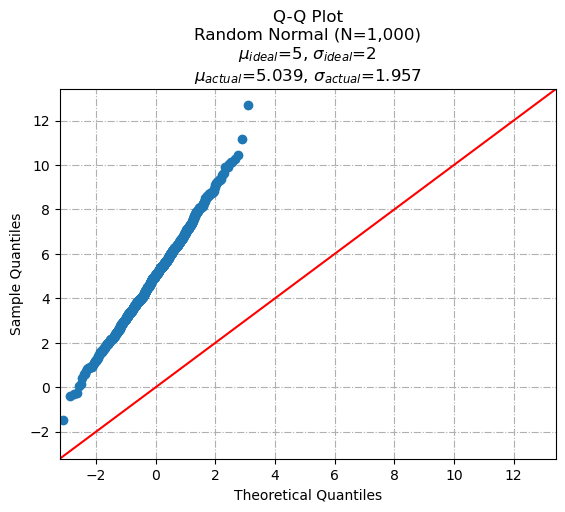

In [378]:
import numpy as np 
import statsmodels.api as sm 
import matplotlib.pyplot as plt 


# Generate random data
N = 1_000
mean = 5
std = 2
np.random.seed(42)
data = np.random.normal(mean, std, N)   # <---------

# Calculate the mean
mean_ = np.mean(data)

# Calculate the standard deviation
std_ = np.std(data)

print(f'{mean_ = :.3f}\n{std_ = :.3f}')


# Create Q-Q plot
fig = sm.qqplot(data, line ='45')
plt.title(f'Q-Q Plot\nRandom Normal ({N=:,})\n' +
          '$\mu_{ideal}$=' + f'{mean}' + ', $\sigma_{ideal}$=' f'{std}' + '\n' +
          '$\mu_{actual}$=' + f'{mean_:.3f},' + ' $\sigma_{actual}$='  + f'{std_:.3f}')
plt.grid(linestyle='-.')
plt.show();


## Putting Original Data and Standardized Data on same Q-Q Plot

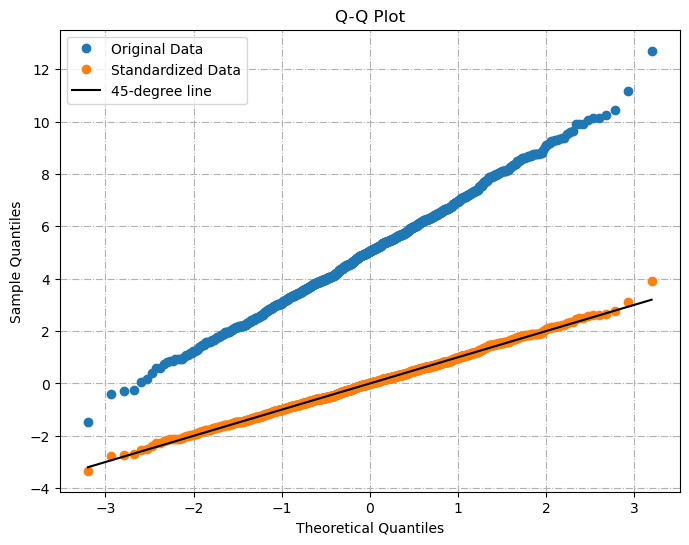

In [379]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Example data - replace these with your actual data arrays
# data = np.random.normal(0, 1, 1000)
standardized_data = (data - np.mean(data)) / np.std(data)   # Z-Score

# Generate Q-Q plot data for each dataset
qq_data = stats.probplot(data, dist="norm", plot=None)
qq_standardized_data = stats.probplot(standardized_data, dist="norm", plot=None)

# Create a single plot
plt.figure(figsize=(8,6))
plt.plot(qq_data[0][0], qq_data[0][1], 'o', label='Original Data')
plt.plot(qq_standardized_data[0][0], qq_standardized_data[0][1], 'o', label='Standardized Data')

# Add a 45 degree line
plt.plot(qq_data[0][0], qq_data[0][0], 'k-', label='45-degree line')

# Labels and legend
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.title('Q-Q Plot')
plt.legend()

# Show the plot
plt.grid(linestyle='-.')
plt.show();


In [380]:
import numpy as np
from sklearn.preprocessing import StandardScaler

# Example data
# data = np.random.normal(0, 1, 1000).reshape(-1, 1)  # Reshape is needed if data is 1D
data_reshaped = data.reshape(-1, 1)  # Reshape is needed if data is 1D

# Create a StandardScaler instance
scaler = StandardScaler()

# Fit and transform the data
standardized_data = scaler.fit_transform(data_reshaped)

# The result is a numpy array


# CREATE THE SUMMARY TABLE FOR THE MODELS


In [381]:
summary_df = pd.DataFrame(columns=["Model", "MAE", "MSE", "RMSE", "R Squared"])
summary_df
summary_df.shape

,Model,MAE,MSE,RMSE,R Squared


(0, 5)

In [382]:
# df_merged_filter_X_features = [
#  #'property_id',     
#  #'type',
#  #'activation_date',  
#  'bathroom',
#  'floor',
#  'total_floor',
#  'furnishing',
#  'gym',
#  'latitude',
#  'longitude',
#  'lease_type',
#  'lift',
#  'locality',
#  'parking',
#  'property_age',
#  'property_size',
#  'swimming_pool',
#  'pin_code',
#  'rent',
#  'deposit',
#  'building_type',
#  #'distance_to_center',
#  #'request_date',
#  #'delta_date',
#  #'delta_date_days',
#  #'n_interactions'
# ]



df_merged_filter_X_features = [
#'property_id',
#'type',
#'activation_date',
'bathroom',
'floor',
'total_floor',
#'furnishing',
'gym',
#'latitude',
#'longitude',
#'lease_type',
'lift',
#'locality',
#'parking',
'property_age',
'property_size',
'swimming_pool',
'pin_code',
'rent',
'deposit',
#'building_type',
'bedroom',
'hall',
'furnishing_FULLY_FURNISHED',
'furnishing_SEMI_FURNISHED',
'lease_type_BACHELOR',
'lease_type_COMPANY',
'lease_type_FAMILY',
'parking_BOTH',
'parking_FOUR_WHEELER',
'parking_TWO_WHEELER',
'building_type_AP',
'building_type_IF',
'building_type_IH',
'photo_count',   
#'request_date',
#'delta_date',
#'delta_date_days',
#'n_interactions'
]

In [383]:
df_merged_filter_X_features

['bathroom',
 'floor',
 'total_floor',
 'gym',
 'lift',
 'property_age',
 'property_size',
 'swimming_pool',
 'pin_code',
 'rent',
 'deposit',
 'bedroom',
 'hall',
 'furnishing_FULLY_FURNISHED',
 'furnishing_SEMI_FURNISHED',
 'lease_type_BACHELOR',
 'lease_type_COMPANY',
 'lease_type_FAMILY',
 'parking_BOTH',
 'parking_FOUR_WHEELER',
 'parking_TWO_WHEELER',
 'building_type_AP',
 'building_type_IF',
 'building_type_IH',
 'photo_count']

In [384]:
# ALLLLL The DATA
X = df_merged_filter[df_merged_filter_X_features]
y = df_merged_filter['n_interactions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=42)

print(f'{X_train.shape = }', '\n',
      f' {X_test.shape = }', '\n',
      f'{y_train.shape = }', '\n',
      f' {y_test.shape = }')

X_train.shape = (55824, 25) 
  X_test.shape = (13957, 25) 
 y_train.shape = (55824,) 
  y_test.shape = (13957,)


In [385]:
np.array(y_train).shape

(55824,)

In [386]:
np.array(y_train).reshape(-1,1)

array([[ 5],
       [21],
       [ 7],
       ...,
       [ 7],
       [20],
       [11]], dtype=int64)

In [387]:
np.array(y_train).reshape(-1,1).shape

(55824, 1)

In [388]:
np.array(y_test).shape

(13957,)

In [389]:
np.array(y_test).reshape(-1,1)

array([[ 3],
       [ 8],
       [31],
       ...,
       [ 4],
       [32],
       [ 3]], dtype=int64)

In [390]:
np.array(y_test).reshape(-1,1).shape

(13957, 1)

In [391]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

y_train_reshaped = np.array(y_train).reshape(-1, 1)
y_test_reshaped = np.array(y_test).reshape(-1, 1)

# Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

y_train_scaled = scaler.fit_transform(y_train_reshaped)
y_test_scaled = scaler.transform(y_test_reshaped)

print(f'{X_train_scaled.shape = }', "\n",
      f'{X_test_scaled.shape = }', "\n",
      f'{y_train_scaled.shape = }', "\n",
      f'{y_test_scaled.shape = }')

X_train_scaled.shape = (55824, 25) 
 X_test_scaled.shape = (13957, 25) 
 y_train_scaled.shape = (55824, 1) 
 y_test_scaled.shape = (13957, 1)


## perf_metrics()

In [392]:
from sklearn import metrics


def perf_metrics(y_test, y_pred):
    # Evaluate the model
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mse = metrics.mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))

    # Calculate R-squared (Coefficient of Determination)
    r_squared = metrics.r2_score(y_test, y_pred)

    # TODO
    # ADD
    # Adjusted R-squared
    # Median Absolute Error
    # Explained Variance Score
    # Others
    
    return mae, mse, rmse, r_squared

In [393]:
import numpy as np
from typing import Union, List, Tuple


def adjusted_r_squared(y_actual: Union[List[float], Tuple[float, ...], np.array], 
                       y_pred: Union[List[float], Tuple[float, ...], np.array], 
                       n_features: int) -> float:
    """
    Calculate the adjusted R-squared value for a regression model.

    Adjusted R-squared is a modified version of R-squared that has been adjusted for the number of predictors in the model.
    It takes into account the number of features used relative to the number of data points. This provides a more accurate
    measure of the goodness of fit, especially when comparing models with different numbers of predictors.

    Parameters:
        - y_actual (List[float]): The actual observed values.
        - y_pred (List[float]): The predicted values from the regression model.
        - n_features (int): The number of features or predictors in the model.

    Returns:
        float: The adjusted R-squared value.

    Raises:
        ValueError: If the lengths of y_actual and y_pred do not match or
                    if n_features is invalid.
    """

    # Validate input lengths
    if len(y_actual) != len(y_pred):
        raise ValueError("The length of y_actual and y_pred must be the same.")

    # Number of observations
    n = len(y_actual)
    
    # Validate n_features
    if n_features <= 0 or n_features >= n - 1:
        raise ValueError(f"Invalid number of features = {n_features}.\nIt must \
be greater than 0 and less than the number of observations ({n}) - 1.")

    # Calculate R squared
    ss_total = np.sum((y_actual - np.mean(y_actual)) ** 2)
    y_actual = np.array(y_actual)   # to fix if ....
    ss_residual = np.sum((y_actual - y_pred) ** 2)
    r_squared = 1 - (ss_residual / ss_total)

    # Adjusted R squared
    adjusted_r2 = 1 - (1 - r_squared) * ((n - 1) / (n - n_features - 1))

    return adjusted_r2


In [394]:
# Example usage
# y_actual = np.array([1, 2, 3, 4, 5, 6])
# y_pred = np.array([1.1, 1.9, 3.2, 4.1, 4.8, 6.05])


# Create y_actual
y_actual = np.linspace(1, 10, 20)

# Add small random noise to y_actual to create y_pred
y_pred = y_actual + np.random.normal(0, 0.5, y_actual.shape)


r2 = metrics.r2_score(y_actual, y_pred)
print('R-squared:', r2)

max_n_features = len(y_actual) - 2
print(f'{max_n_features = }')

n_features_list = []
adjusted_r2_list = []
for n_features in range(2, max_n_features+1):
    # print(f'{n_features = }')
    adjusted_r2 = adjusted_r_squared(y_actual, y_pred, n_features)
    print(f'Adjusted R-squared({n_features=}):', adjusted_r2)
    n_features_list.append(n_features)
    adjusted_r2_list.append(adjusted_r2)

R-squared: 0.9714824849962451
max_n_features = 18
Adjusted R-squared(n_features=2): 0.9681274832310975
Adjusted R-squared(n_features=3): 0.9661354509330411
Adjusted R-squared(n_features=4): 0.9638778143285771
Adjusted R-squared(n_features=5): 0.9612976582091898
Adjusted R-squared(n_features=6): 0.9583205549945121
Adjusted R-squared(n_features=7): 0.9548472679107214
Adjusted R-squared(n_features=8): 0.9507424740844234
Adjusted R-squared(n_features=9): 0.9458167214928658
Adjusted R-squared(n_features=10): 0.9397963572142952
Adjusted R-squared(n_features=11): 0.9322709018660822
Adjusted R-squared(n_features=12): 0.9225953164183796
Adjusted R-squared(n_features=13): 0.9096945358214429
Adjusted R-squared(n_features=14): 0.8916334429857314
Adjusted R-squared(n_features=15): 0.8645418037321644
Adjusted R-squared(n_features=16): 0.8193890716428858
Adjusted R-squared(n_features=17): 0.7290836074643287
Adjusted R-squared(n_features=18): 0.4581672149286573


In [395]:
# test/demo
# import matplotlib.pyplot as plt

# plt.axhline(y=r2, linestyle='dashed', color='red', alpha=0.4)
# plt.scatter(n_features_list, adjusted_r2_list)
# plt.xlabel('Number of Features')
# plt.ylabel('Adjusted $R^2$')

# plt.show()

## append_to_summary()

In [396]:
from typing import Tuple
import pandas as pd


def append_to_summary(record) -> None:
    """
    Append a record to the global DataFrame 'summary_df'.

    This function takes a tuple of floats representing a record and appends it 
    to the 'summary_df' DataFrame. The DataFrame is assumed to have the same number 
    of columns as there are elements in the tuple.

    Parameters:
        record (Tuple[float]): A tuple containing the record to be appended.
                               Each element of the tuple should be a float and
                               match the structure of 'summary_df'.

    Returns:
        None: This function does not return any value.

    Raises:
        ValueError: If the record is not a tuple of floats or if the length
                    of the record does not match the number of columns in
                    'summary_df'.
    """
    # Check if 'record' is a tuple
    if not isinstance(record, (tuple, list)):
        raise TypeError("The 'record' parameter must be a tuple or a list.")
    
    # Check if index 0 element is a string
    if not isinstance(record[0], str):
        raise ValueError("Index zero of record should be a string.")
    
    # Check if all elements in the record are floats
    if not all(isinstance(item, float) for item in record[1:]):
        raise ValueError("Besides the zero index of the record, all elements must be floats.")

    # Check if the length of the record matches the number of columns in 'summary_df'
    if len(record) != len(summary_df.columns):
        raise ValueError(f"The length of the record ({len(record)}) does not match \
the number of columns in 'summary_df' ({len(summary_df.columns)}).")

    # Append the record to 'summary_df'
    summary_df.loc[len(summary_df)] = record


In [397]:
summary_df

,Model,MAE,MSE,RMSE,R Squared


# Decision Tree Regressor

+ **Baseline:**  
A single decision tree serves as a good baseline model. Before jumping into more complex models like Random Forests, it’s often recommended to start with simpler models to establish a performance baseline.
+ **Overfitting Check:**  
Comparing the performance of a single decision tree with a Random Forest can help in understanding if the Random Forest is overfitting. If the Random Forest is significantly better, it might be capturing complex patterns (which is good), but if it’s only slightly better or similar, the Random Forest might be overfitting.

In [398]:
# TO DO

# DO IT :)

# Random Forest Regressor

In [399]:
from sklearn.ensemble import RandomForestRegressor
#help(RandomForestRegressor)

In [400]:
%%time 
from sklearn.ensemble import RandomForestRegressor

# Create and fit the Random Forest regression model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_RFR_pred = rf_model.predict(X_test)


CPU times: total: 26.2 s
Wall time: 45 s


In [401]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_RFR_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Random Forest Regression", mae, mse, rmse, r_squared]
record

['Random Forest Regression',
 0.4504335329683094,
 1.7633596588995941,
 1.327915531537904,
 0.9860125623589227]

In [402]:
N = len(y_RFR_pred)

In [403]:
plot_predictions_vs_actuals.__annotations__

{'actual': typing.Union[typing.Sequence[float], numpy.ndarray, pandas.core.series.Series],
 'predicted': typing.Union[typing.Sequence[float], numpy.ndarray, pandas.core.series.Series],
 'graph_type': typing.Optional[str],
 'annotate': typing.Optional[bool],
 'annotation_fontsize': typing.Union[int, float],
 'max_annotations': typing.Optional[int],
 'figsize': typing.Union[typing.Tuple[typing.Union[int, float], typing.Union[int, float]], typing.List[typing.Union[int, float]]],
 'color': typing.Optional[str],
 'alpha': typing.Union[int, float],
 'marker_size': typing.Optional[int],
 'show_legend': typing.Optional[bool],
 'title': typing.Optional[str],
 'grid_style': typing.Optional[str],
 'return': None}

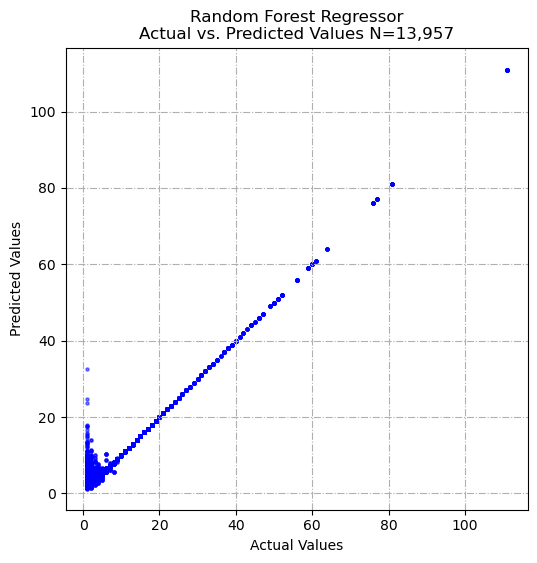

In [404]:
plot_predictions_vs_actuals(
    y_test,
    y_RFR_pred,
    title=f"Random Forest Regressor\nActual vs. Predicted Values {N=:,}",
    marker_size=5,
    alpha=0.5
)

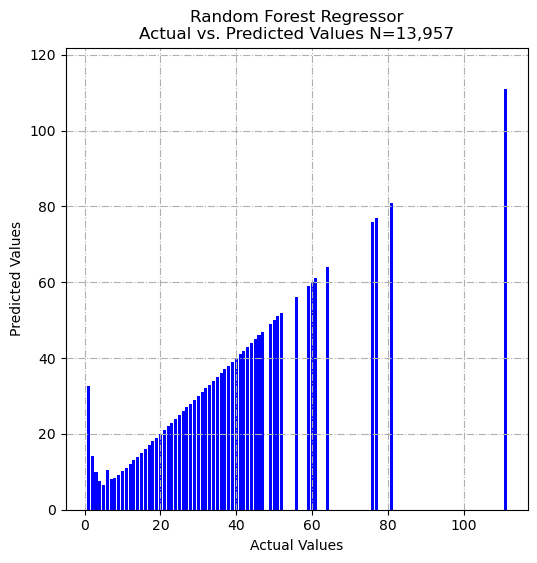

In [405]:
plot_predictions_vs_actuals(
    y_test,
    y_RFR_pred, 
    title=f"Random Forest Regressor\nActual vs. Predicted Values {N=:,}",
    graph_type="bar"
)

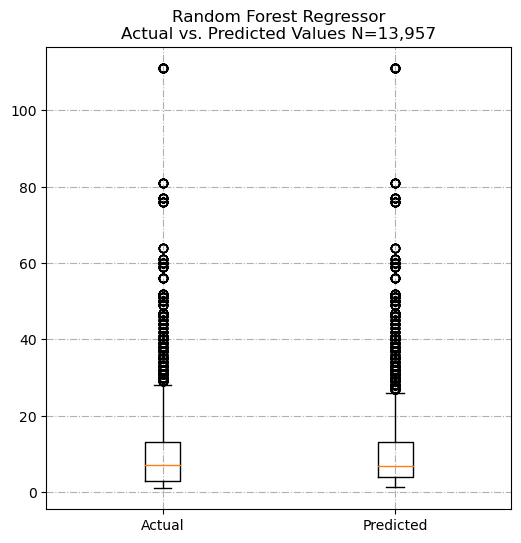

In [406]:
plot_predictions_vs_actuals(
    y_test,
    y_RFR_pred, 
    title=f"Random Forest Regressor\nActual vs. Predicted Values {N=:,}",
    graph_type="boxplot"
)

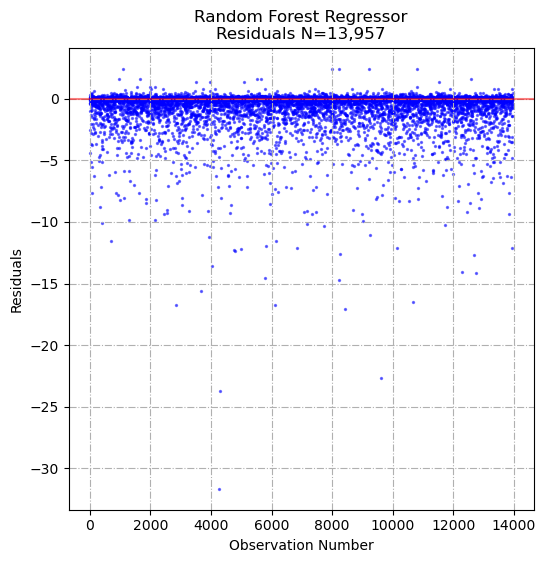

In [407]:
plot_predictions_vs_actuals(
    y_test,
    y_RFR_pred,
    title=f"Random Forest Regressor\nResiduals {N=:,}",
    marker_size=2,
    alpha=0.5,
    graph_type= "residuals"
)

<Figure size 600x600 with 0 Axes>

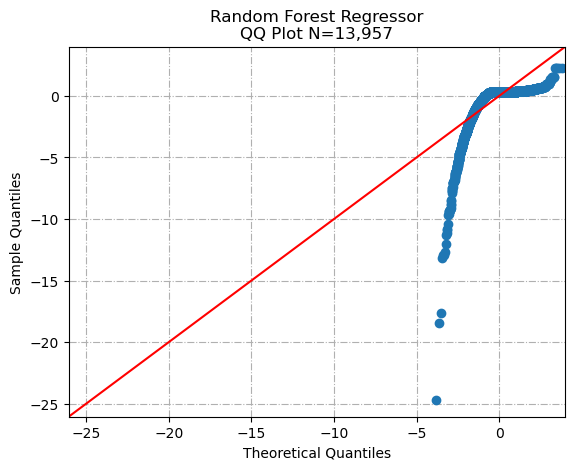

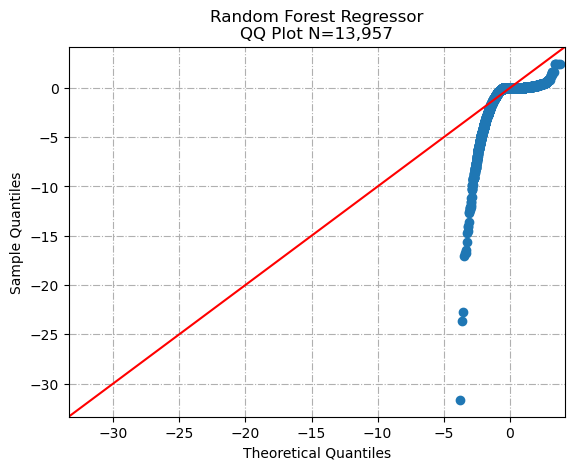

In [408]:
plot_predictions_vs_actuals(
    y_test,
    y_RFR_pred,
    title=f"Random Forest Regressor\nQQ Plot {N=:,}",
    marker_size=2,
    alpha=0.5,
    graph_type= "residuals_q_q_plot"
)

In [409]:
#RRRR

In [410]:
len(y_test)

13957

C:\Users\sabde\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



p_value=0.000 <= alpha=0.05 ==> Residuals are not normally distributed.


<Figure size 600x600 with 0 Axes>

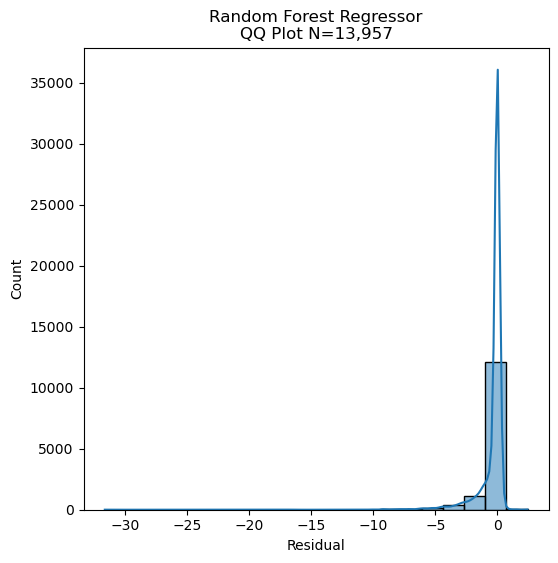

In [411]:
#bad
plot_predictions_vs_actuals(
    y_test,
    y_RFR_pred,
    title=f"Random Forest Regressor\nQQ Plot {N=:,}",
    marker_size=2,
    alpha=0.5,
    graph_type= "residuals_histogram"
)

C:\Users\sabde\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



(-5.0, 10.0)

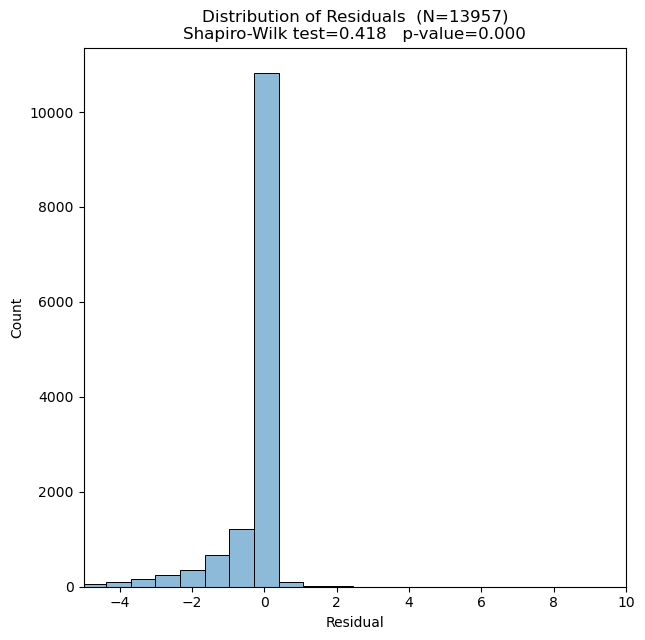

In [412]:
#residuals = np.ndarray(y_test.values) - np.ndarray(y_RFR_pred.values)

actual = np.array(y_test)
predicted = np.array(y_RFR_pred)

residuals = actual - predicted
    
N = len(residuals)

shapiro_wilk_statistic, p_value = shapiro(residuals)

# A p-value greater than 0.05 usually suggests that the data is normally distributed
# alpha = 0.05
# if p_value > alpha:
#     print(f'{p_value=:.3f} > {alpha=:.2f} ==> Residuals are normally distributed.')
# else:
#     print(f'{p_value=:.3f} <= {alpha=:.2f} ==> Residuals are not normally distributed.')

title=f'Distribution of Residuals  ({N=})\n' + \
    f'Shapiro-Wilk test={shapiro_wilk_statistic:.3f}   ' + \
    f'p-value={p_value:.3f}'

ed_data_viz.plot_histogram_(residuals,
                            bins=50,  # default is 20
                            title=title,
                            xlabel='Residual',
                            figsize=(7,7),
                            kde=False,
                           )
plt.xlim(-5,10)

In [413]:
min(residuals)

-31.659999999999997

In [414]:
max(residuals)

2.4361233766233745

C:\Users\sabde\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



p_value=0.000 <= alpha=0.05 ==> Residuals are not normally distributed.


(-5.0, 5.0)

<Figure size 600x600 with 0 Axes>

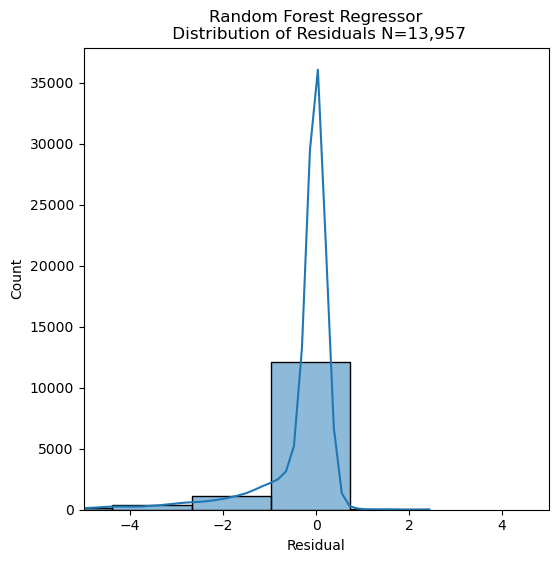

In [415]:
plot_predictions_vs_actuals(
    y_test,
    y_RFR_pred,
    title=f"Random Forest Regressor\n Distribution of Residuals {N=:,}",
    marker_size=2,
    alpha=0.5,
    graph_type= "residuals_histogram",
)

plt.xlim(-5,5)


In [416]:
summary_df

,Model,MAE,MSE,RMSE,R Squared


In [417]:
record

['Random Forest Regression',
 0.4504335329683094,
 1.7633596588995941,
 1.327915531537904,
 0.9860125623589227]

In [418]:
#SSSS

In [419]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.76336,1.327916,0.986013


In [420]:
len(summary_df)

1

# SVR

In [421]:
%%time 
from sklearn.svm import SVR
from sklearn import metrics

# Train SVR Model
svr_model = SVR(kernel='linear')  # You can choose different kernels and tune hyperparameters
svr_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_SVR_pred = svr_model.predict(X_test_scaled)

CPU times: total: 3min 19s
Wall time: 4min 42s


In [422]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_SVR_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Support Vector", mae, mse, rmse, r_squared]
record

['Support Vector',
 6.486086901120783,
 125.38501673652353,
 11.197545120986275,
 0.005412710971272716]

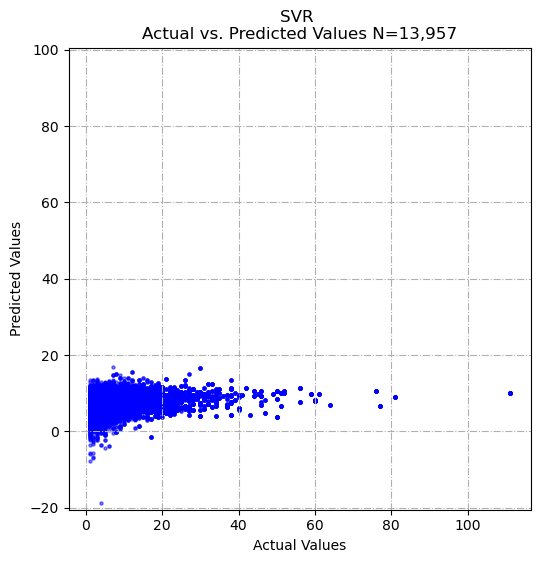

In [423]:
plot_predictions_vs_actuals(
    y_test,
    y_SVR_pred,
    title=f"SVR \nActual vs. Predicted Values {N=:,}",
    marker_size=5,
    alpha=0.5
)

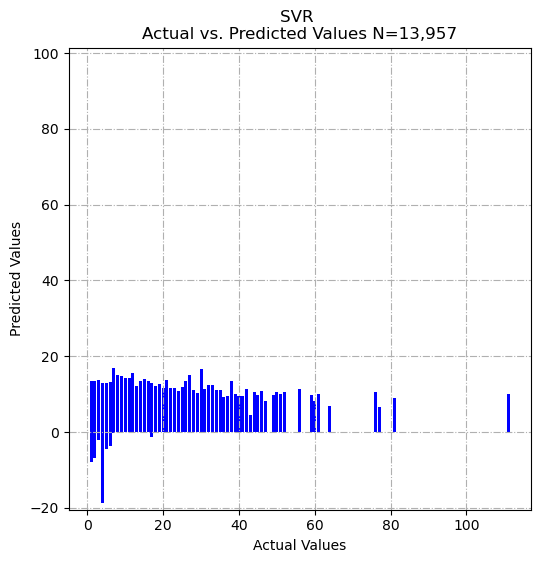

In [424]:
plot_predictions_vs_actuals(
    y_test,
    y_SVR_pred, 
    title=f"SVR \nActual vs. Predicted Values {N=:,}",
    graph_type="bar"
)

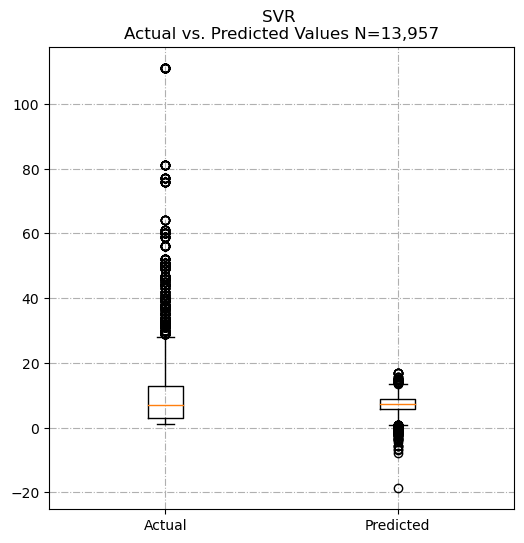

In [425]:
plot_predictions_vs_actuals(
    y_test,
    y_SVR_pred, 
    title=f"SVR \nActual vs. Predicted Values {N=:,}",
    graph_type="boxplot"
)

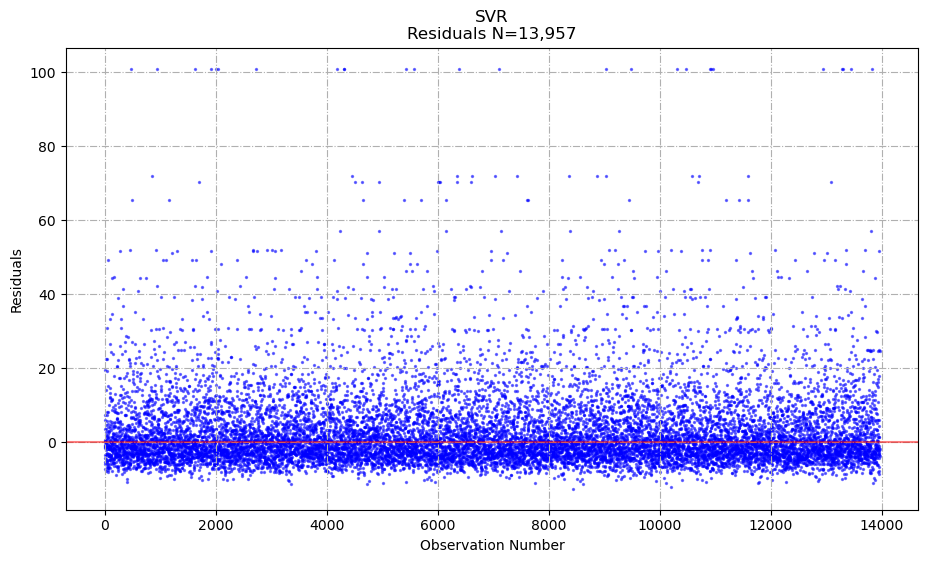

In [426]:
plot_predictions_vs_actuals(
    y_test,
    y_SVR_pred,
    title=f"SVR\nResiduals {N=:,}",
    marker_size=2,
    alpha=0.5,
    graph_type= "residuals",
    figsize=(11,6)
)

In [427]:
from sklearn.preprocessing import StandardScaler

# Scale Features
#scaler_SVR = StandardScaler()
#actuals_SVR_scaled = scaler_SVR.fit_transform(y_test).reshape(1, -1)
#pred_SVR_scaled = scaler_SVR.transform(y_SVR_pred)

# Scale Features
scaler_SVR = StandardScaler()

# Reshape y_test to a 2D array
y_test_2d = y_test.values.reshape(-1, 1)

actuals_SVR_scaled = scaler_SVR.fit_transform(y_test_2d).reshape(1, -1)
pred_SVR_scaled = scaler_SVR.transform(y_SVR_pred.reshape(-1, 1))


In [428]:
# plot_predictions_vs_actuals(
#     actuals_SVR_scaled,
#     pred_SVR_scaled,
#     title=f"SVR\nQQ Plot {N=:,}",
#     marker_size=2,
#     alpha=0.5,
#     graph_type= "residuals_q_q_plot"
# )

In [429]:
record

['Support Vector',
 6.486086901120783,
 125.38501673652353,
 11.197545120986275,
 0.005412710971272716]

In [430]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413


# Poisson Regressor

In [431]:
%%time 
from sklearn import linear_model
from sklearn import metrics

clf = linear_model.PoissonRegressor()

clf.fit(X_train_scaled, y_train)
score = clf.score(X_train_scaled, y_train)
print(f'{score = }')
print(f'{clf.coef_ = }')
print(f'{clf.intercept_ = }')

# Make predictions on the test set
y_Poi_pred = clf.predict(X_test_scaled)

score = 0.14452178975669938
clf.coef_ = array([-0.03455337, -0.03348675,  0.03903862, -0.03437471, -0.04625929,
       -0.04827235, -0.0033794 , -0.0521335 , -0.04473579,  0.09779882,
       -0.17977726, -0.20283219,  0.14045504, -0.005456  ,  0.12428855,
        0.04333784, -0.01212076, -0.08019431,  0.00852604,  0.03035714,
       -0.01370703,  0.03672083, -0.00585254, -0.02408578,  0.11228471])
clf.intercept_ = 2.2910229620765046
CPU times: total: 219 ms
Wall time: 160 ms


In [432]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_Poi_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Poisson", mae, mse, rmse, r_squared]
record

['Poisson',
 7.080682579676959,
 113.35495116031481,
 10.64682822066341,
 0.1008383895706676]

In [433]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413
2,Poisson,7.080683,113.354951,10.646828,0.100838


In [434]:
type(y_Poi_pred)

numpy.ndarray

In [435]:
type(y_test)

pandas.core.series.Series

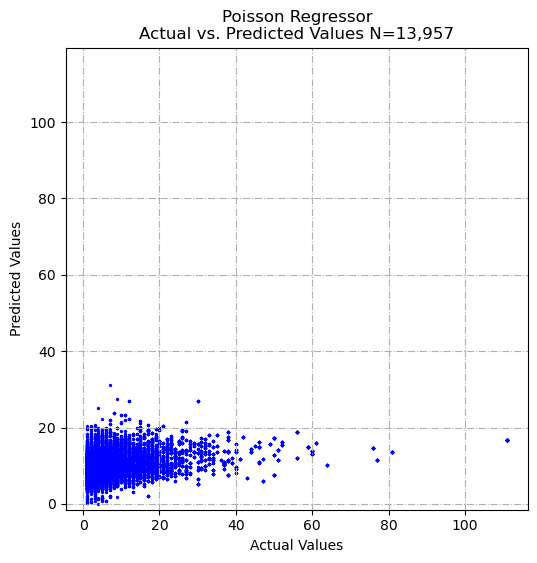

In [436]:
plot_predictions_vs_actuals(
    y_test,
    y_Poi_pred, 
    title=f"Poisson Regressor\nActual vs. Predicted Values {N=:,}",
    marker_size=2
)

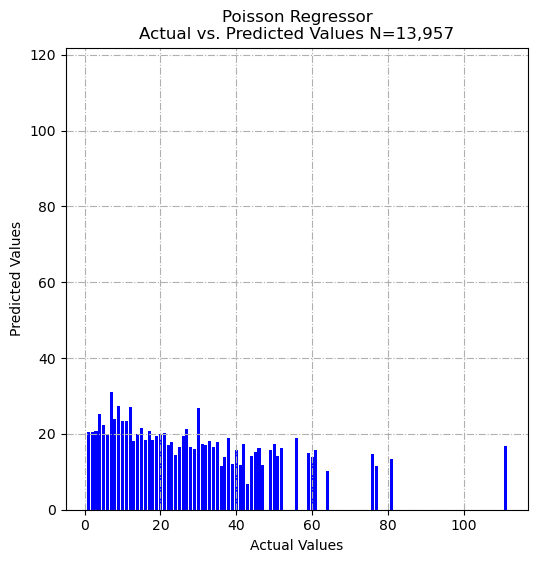

In [437]:
plot_predictions_vs_actuals(
    y_test,
    y_Poi_pred, 
    title=f"Poisson Regressor\nActual vs. Predicted Values {N=:,}",
    graph_type="bar"
)

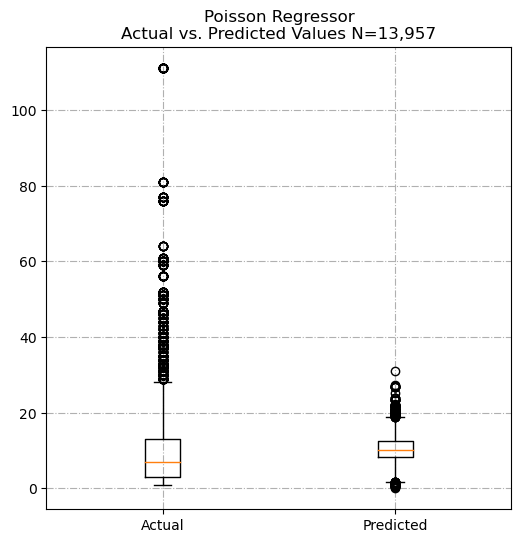

In [438]:
plot_predictions_vs_actuals(
    y_test,
    y_Poi_pred, 
    title=f"Poisson Regressor\nActual vs. Predicted Values {N=:,}",
    graph_type="boxplot"
)

In [439]:
y_test[0:10]

45589     3
454       8
30948    31
3425      8
44730     1
43905     6
13813    11
17294     4
30833     3
23143     2
Name: n_interactions, dtype: int64

In [440]:
y_Poi_pred[0:10]

array([ 5.92564267, 11.11054477, 17.29565547, 10.97397403,  7.1738651 ,
        8.87067534, 11.04791306,  6.9162271 ,  7.5518752 , 10.30408806])

# Negative Binomial Regession

In [441]:
df_merged_filter_X_features

['bathroom',
 'floor',
 'total_floor',
 'gym',
 'lift',
 'property_age',
 'property_size',
 'swimming_pool',
 'pin_code',
 'rent',
 'deposit',
 'bedroom',
 'hall',
 'furnishing_FULLY_FURNISHED',
 'furnishing_SEMI_FURNISHED',
 'lease_type_BACHELOR',
 'lease_type_COMPANY',
 'lease_type_FAMILY',
 'parking_BOTH',
 'parking_FOUR_WHEELER',
 'parking_TWO_WHEELER',
 'building_type_AP',
 'building_type_IF',
 'building_type_IH',
 'photo_count']

In [442]:
X_feat_df = df_merged_filter[df_merged_filter_X_features] 
X_feat_df

,bathroom,floor,total_floor,gym,lift,property_age,property_size,swimming_pool,pin_code,rent,...,lease_type_BACHELOR,lease_type_COMPANY,lease_type_FAMILY,parking_BOTH,parking_FOUR_WHEELER,parking_TWO_WHEELER,building_type_AP,building_type_IF,building_type_IH,photo_count
0,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
1,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
2,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
3,1,3,4,1,1,2,850,1,560076.0,12000,...,0,0,1,1,0,0,1,0,0,7
4,2,4,11,1,1,1,1233,1,560016.0,20000,...,0,0,1,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69776,1,1,2,0,0,5,600,0,560034.0,14000,...,0,0,0,0,0,1,0,1,0,0
69777,2,0,4,1,1,1,1550,0,560093.0,24000,...,0,0,1,1,0,0,1,0,0,11
69778,2,0,4,1,1,1,1550,0,560093.0,24000,...,0,0,1,1,0,0,1,0,0,11
69779,2,0,4,1,1,1,1550,0,560093.0,24000,...,0,0,1,1,0,0,1,0,0,11


In [443]:
print(X_feat_df["bathroom"].values)
print(type(X_feat_df["bathroom"].values))
print(X_feat_df["bathroom"].shape)

[1 1 1 ... 2 2 2]
<class 'numpy.ndarray'>
(69781,)


In [444]:
# Create empty dictionaries to store lists for each column
X_column_lists = {}

# Iterate over columns and create lists
for column in X_feat_df.columns:
    X_column_lists[column] = X_feat_df[column].tolist()

In [445]:
X_column_lists.keys()
len(X_column_lists.keys())

dict_keys(['bathroom', 'floor', 'total_floor', 'gym', 'lift', 'property_age', 'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED', 'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR', 'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH', 'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP', 'building_type_IF', 'building_type_IH', 'photo_count'])

25

In [446]:
len(X_column_lists['bathroom'])

69781

In [447]:
print(X_column_lists['bathroom'])

[1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 

In [448]:
# Print the lists
#for column, values in X_column_lists.items():
#    print(f"{column}: {values}")

In [449]:
# Data for Negative Binomial Regression

#     'y': [5, 12, 8, 15, 10, 18, 6, 22, 16, 25],
#     'x1': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
#     'x2': [1, 0, 1, 0, 1, 0, 1, 0, 1, 0],


Neg_Bi_R_data = X_column_lists.copy()

Neg_Bi_R_data['n_interactions'] = df_merged_filter['n_interactions'].tolist()

print(len(Neg_Bi_R_data))
Neg_Bi_R_data.keys()

26


dict_keys(['bathroom', 'floor', 'total_floor', 'gym', 'lift', 'property_age', 'property_size', 'swimming_pool', 'pin_code', 'rent', 'deposit', 'bedroom', 'hall', 'furnishing_FULLY_FURNISHED', 'furnishing_SEMI_FURNISHED', 'lease_type_BACHELOR', 'lease_type_COMPANY', 'lease_type_FAMILY', 'parking_BOTH', 'parking_FOUR_WHEELER', 'parking_TWO_WHEELER', 'building_type_AP', 'building_type_IF', 'building_type_IH', 'photo_count', 'n_interactions'])

In [450]:
%%time
import pandas as pd
import statsmodels.api as sm

# Make sure you have the dependent variable (response) and independent variables (features) in your DataFrame

Neg_Bi_R_df = pd.DataFrame(Neg_Bi_R_data)


# Specify the model
formula = 'n_interactions ~ '
for column in Neg_Bi_R_data.keys():
    if column != "n_interactions":
        formula += column + " + "
formula = formula[:-2]                


Neg_Bi_R_model = sm.GLM.from_formula(formula, data=Neg_Bi_R_df, family=sm.families.NegativeBinomial())

# Fit the model
Neg_Bi_R_model_results = Neg_Bi_R_model.fit()

# Display model summary
print(Neg_Bi_R_model_results.summary())

C:\Users\sabde\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning:

Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.



                 Generalized Linear Model Regression Results                  
Dep. Variable:         n_interactions   No. Observations:                69781
Model:                            GLM   Df Residuals:                    69755
Model Family:        NegativeBinomial   Df Model:                           25
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.3209e+05
Date:                Wed, 20 Dec 2023   Deviance:                       48654.
Time:                        18:56:40   Pearson chi2:                 6.25e+04
No. Iterations:                    22   Pseudo R-squ. (CS):             0.1124
Covariance Type:            nonrobust                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

In [451]:
help(Neg_Bi_R_model)

Help on GLM in module statsmodels.genmod.generalized_linear_model object:

class GLM(statsmodels.base.model.LikelihoodModel)
 |  GLM(endog, exog, family=None, offset=None, exposure=None, freq_weights=None, var_weights=None, missing='none', **kwargs)
 |  
 |  Generalized Linear Models
 |  
 |  GLM inherits from statsmodels.base.model.LikelihoodModel
 |  
 |  Parameters
 |  ----------
 |  endog : array_like
 |      1d array of endogenous response variable.  This array can be 1d or 2d.
 |      Binomial family models accept a 2d array with two columns. If
 |      supplied, each observation is expected to be [success, failure].
 |  exog : array_like
 |      A nobs x k array where `nobs` is the number of observations and `k`
 |      is the number of regressors. An intercept is not included by default
 |      and should be added by the user (models specified using a formula
 |      include an intercept by default). See `statsmodels.tools.add_constant`.
 |  family : family class instance
 |   

In [452]:
type(Neg_Bi_R_model_results.params)

pandas.core.series.Series

In [453]:
# Concatenating the two Series horizontally (along axis 1)
merged_series_H_df = pd.concat([Neg_Bi_R_model_results.params, Neg_Bi_R_model_results.pvalues], axis=1,
                               keys=['Coefficients', 'P-values'])

# Display the horizontally merged Series
merged_series_H_df


,Coefficients,P-values
Intercept,1.736939e+00,1.402374e-70
bathroom,1.220946e-02,2.943768e-01
floor,-2.088312e-02,3.551207e-12
total_floor,1.163741e-02,2.107494e-06
gym,-8.243473e-02,3.976199e-05
lift,-1.206438e-01,8.236235e-14
property_age,-2.421141e-03,2.483330e-05
property_size,-1.671957e-06,8.800575e-01
swimming_pool,-2.103595e-01,1.034204e-22
pin_code,-4.004379e-07,7.399443e-14


In [454]:
from sklearn.metrics import mean_absolute_error, mean_squared_error


# Exclude the 'n_interactions' column
Neg_Bi_R_df_T_excluded = Neg_Bi_R_df.drop(['n_interactions'], axis=1)

# Get the predicted values from the model
y_Neg_Bi_R_pred = Neg_Bi_R_model_results.predict(Neg_Bi_R_df_T_excluded)

# Get the actual values
y_Neg_Bi_R_test = Neg_Bi_R_df['n_interactions']

# Calculate metrics
mae = mean_absolute_error(y_Neg_Bi_R_test, y_Neg_Bi_R_pred)
mse = mean_squared_error(y_Neg_Bi_R_test, y_Neg_Bi_R_pred)
rmse = np.sqrt(mse)

print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')

MAE: 7.105968774965604
MSE: 117.72491714269154
RMSE: 10.850111388492357


In [455]:
len(y_Neg_Bi_R_test) == len(y_test)

False

In [456]:
y_Neg_Bi_R_test.shape  #Why is the negative Binomial Regression test and pred len 69781

(69781,)

In [457]:
y_test.shape

(13957,)

In [458]:
y_Neg_Bi_R_pred.shape

(69781,)

In [459]:
from sklearn.metrics import r2_score

# Calculate R-squared
r_squared = r2_score(y_Neg_Bi_R_test, y_Neg_Bi_R_pred)

print(f'R-squared: {r_squared}')


R-squared: 0.10047215901942463


In [460]:
mae, mse, rmse, r_squared = perf_metrics(y_Neg_Bi_R_test, y_Neg_Bi_R_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Negative Binomial", mae, mse, rmse, r_squared]
record

['Negative Binomial',
 7.105968774965604,
 117.72491714269154,
 10.850111388492357,
 0.10047215901942463]

In [461]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413
2,Poisson,7.080683,113.354951,10.646828,0.100838
3,Negative Binomial,7.105969,117.724917,10.850111,0.100472


In [462]:
type(y_Neg_Bi_R_pred)

pandas.core.series.Series

In [463]:
y_Neg_Bi_R_pred_list = y_Neg_Bi_R_pred.tolist()

In [464]:
y_Neg_Bi_R_test_list = y_Neg_Bi_R_test.tolist()

In [465]:
Neg_N = len(y_Neg_Bi_R_test)
Neg_N

69781

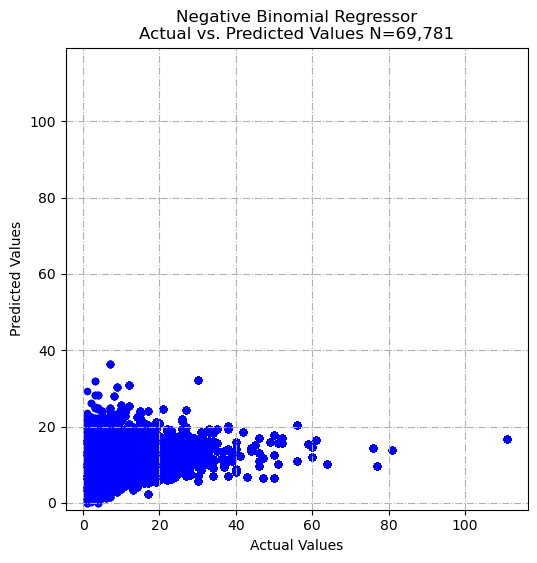

In [466]:
plot_predictions_vs_actuals(
    y_Neg_Bi_R_test_list,
    y_Neg_Bi_R_pred_list, 
    title=f"Negative Binomial Regressor\nActual vs. Predicted Values N={Neg_N:,}"
)

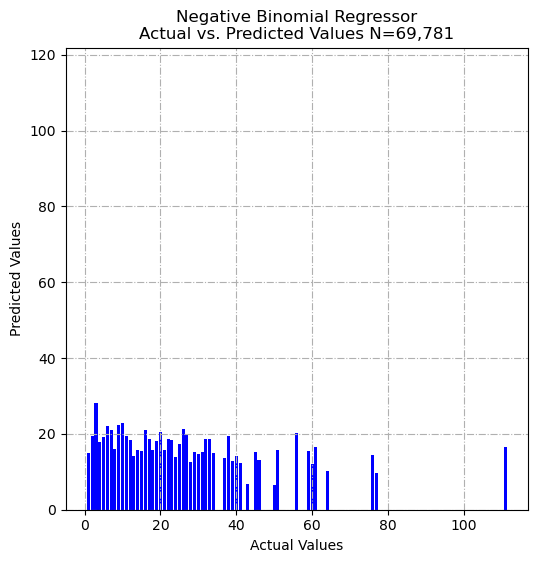

In [467]:
plot_predictions_vs_actuals(
    y_Neg_Bi_R_test_list[0:Neg_N:100],   # only do a few since all takes forever
    y_Neg_Bi_R_pred_list[0:Neg_N:100],
    title=f"Negative Binomial Regressor\nActual vs. Predicted Values N={Neg_N:,}",
    graph_type="bar"
)

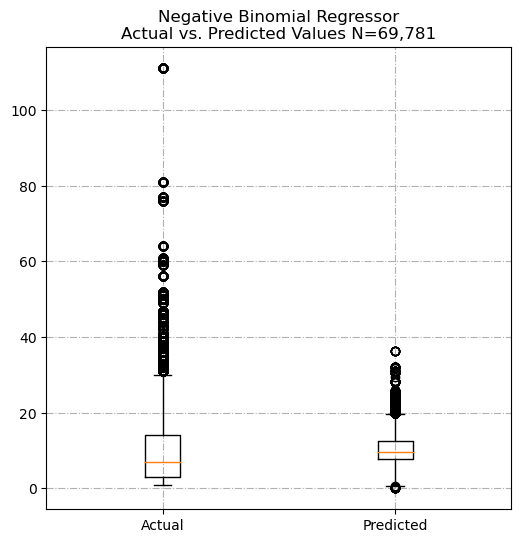

In [468]:
plot_predictions_vs_actuals(
    y_Neg_Bi_R_test_list,
    y_Neg_Bi_R_pred_list, 
    title=f"Negative Binomial Regressor\nActual vs. Predicted Values N={Neg_N:,}",
    graph_type="boxplot"
)

# Lasso Regression (L1 Regularization)

In [469]:
from sklearn.linear_model import Lasso


alpha = 0.001  # Regularization strength, you can adjust this parameter
lasso_model = Lasso(alpha=alpha)
lasso_model.fit(X_train_scaled, y_train)

y_Lasso_pred = lasso_model.predict(X_test_scaled)


Lasso(alpha=0.001)

In [470]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_Lasso_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Lasso (L1 Regularization)", mae, mse, rmse, r_squared]
record


['Lasso (L1 Regularization)',
 7.129611442667994,
 114.58019890963548,
 10.704214072487316,
 0.09111939866487118]

In [471]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413
2,Poisson,7.080683,113.354951,10.646828,0.100838
3,Negative Binomial,7.105969,117.724917,10.850111,0.100472
4,Lasso (L1 Regularization),7.129611,114.580199,10.704214,0.091119


In [472]:
# from sklearn.model_selection import GridSearchCV

# # Example using cross-validation for hyperparameter tuning
# param_grid = {'alpha': [0.01, 0.1, 1, 10]}
# grid_search = GridSearchCV(Lasso(), param_grid, cv=5)
# grid_search.fit(X_train_scaled, y_train)

# best_alpha = grid_search.best_params_['alpha']
# best_lasso_model = Lasso(alpha=best_alpha)
# best_lasso_model.fit(X_train_scaled, y_train)

In [473]:
from sklearn.model_selection import GridSearchCV

# Example using cross-validation for hyperparameter tuning
param_grid = {'alpha': np.arange(0.001, 0.015, 0.001)}
grid_search = GridSearchCV(Lasso(), param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)

best_alpha = grid_search.best_params_['alpha']
best_lasso_model = Lasso(alpha=best_alpha)
best_lasso_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': array([0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009,
       0.01 , 0.011, 0.012, 0.013, 0.014])})

Lasso(alpha=0.001)

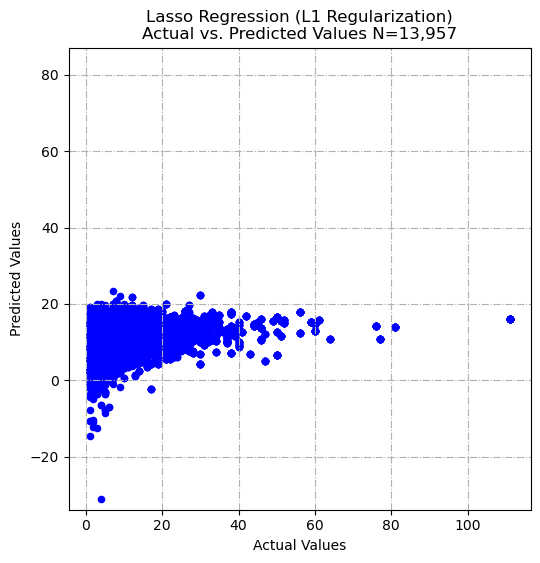

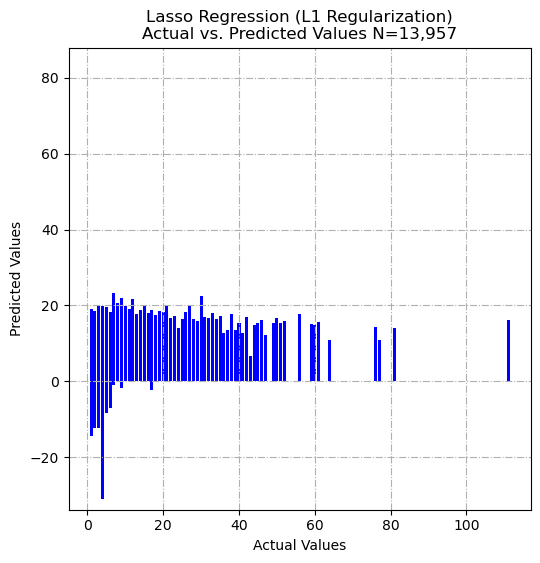

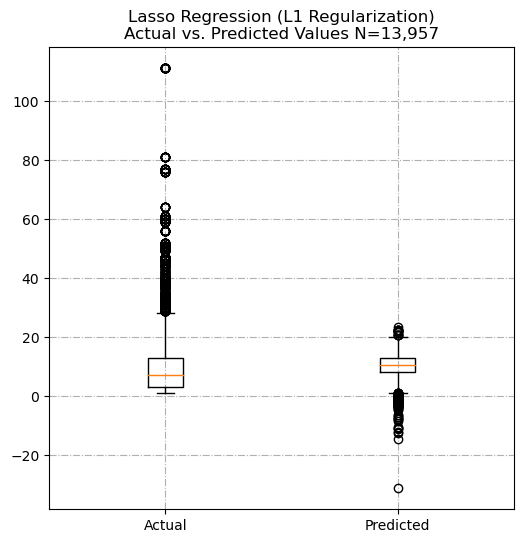

In [474]:
for graph_type in ("scatter", "bar", "boxplot"):
    plot_predictions_vs_actuals(
        y_test,
        y_Lasso_pred,
        title=f"Lasso Regression (L1 Regularization)\nActual vs. Predicted Values {N=:,}",
        graph_type=graph_type
    )

---
# Ridge Regression (L2 Regularization)

In [475]:
from sklearn.linear_model import Ridge

alpha = 1.8  # Regularization strength, you can adjust this parameter
ridge_model = Ridge(alpha=alpha)
ridge_model.fit(X_train_scaled, y_train)

y_Ridge_pred = ridge_model.predict(X_test_scaled)

Ridge(alpha=1.8)

In [476]:
# # Example using cross-validation for hyperparameter tuning
# from sklearn.model_selection import GridSearchCV

# param_grid = {'alpha': [0.01, 0.1, 1, 10]}
# grid_search = GridSearchCV(Ridge(), param_grid, cv=5)
# grid_search.fit(X_train_scaled, y_train)

# best_alpha = grid_search.best_params_['alpha']
# best_ridge_model = Ridge(alpha=best_alpha)
# best_ridge_model.fit(X_train_scaled, y_train)


In [477]:
# Example using cross-validation for hyperparameter tuning
from sklearn.model_selection import GridSearchCV

param_grid = {'alpha': np.arange(1.5, 2.5, 0.1)}
grid_search = GridSearchCV(Ridge(), param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)

best_alpha = grid_search.best_params_['alpha']
best_ridge_model = Ridge(alpha=best_alpha)
best_ridge_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': array([1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4])})

Ridge(alpha=1.8000000000000003)

In [478]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_Ridge_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["Ridge (L2 Regularization)", mae, mse, rmse, r_squared]
record


['Ridge (L2 Regularization)',
 7.130367906130443,
 114.5843443065473,
 10.704407704611558,
 0.09108651627442477]

In [479]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413
2,Poisson,7.080683,113.354951,10.646828,0.100838
3,Negative Binomial,7.105969,117.724917,10.850111,0.100472
4,Lasso (L1 Regularization),7.129611,114.580199,10.704214,0.091119
5,Ridge (L2 Regularization),7.130368,114.584344,10.704408,0.091087


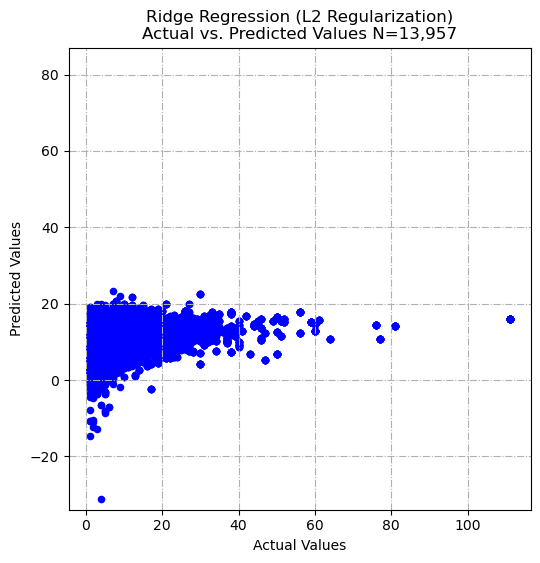

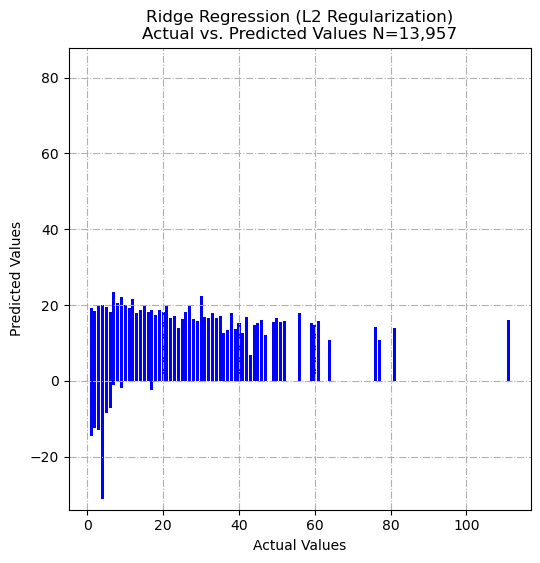

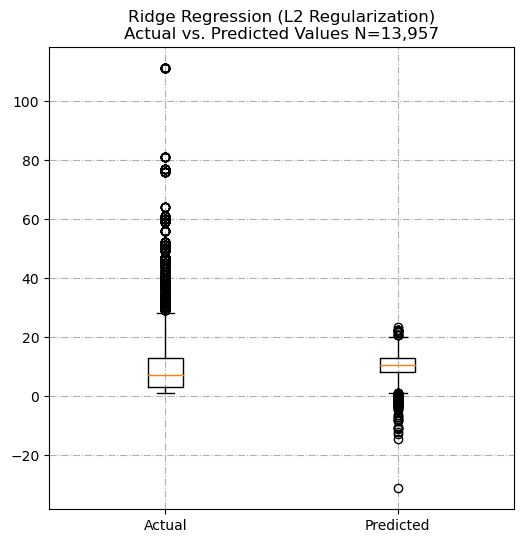

In [480]:
for graph_type in ("scatter", "bar", "boxplot"):
    plot_predictions_vs_actuals(
        y_test,
        y_Ridge_pred,
        title=f"Ridge Regression (L2 Regularization)\nActual vs. Predicted Values {N=:,}",
        graph_type=graph_type)

# Elastic Net

+ Best of Lasso Regression (L1 Regularization) and Ridge Regression (L2 Regularization).


In [481]:
# TO DO

# DO IT :)

# Extreme Gradient Boosting (XGBoost)

In [482]:
# !pip install xgboost

In [483]:
from xgboost import XGBRegressor


xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)

y_XGB_pred = xgb_model.predict(X_test)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

## Cross-Validation for Hyperparameter Tuning

In [484]:
# Example using cross-validation for hyperparameter tuning
from sklearn.model_selection import GridSearchCV

param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5]
}

grid_search = GridSearchCV(XGBRegressor(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_xgb_model = grid_search.best_estimator_


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7], 'min_child_weight': [1, 3, 5],
                         'n_estimators': [50, 100, 200]})

In [485]:
param_grid.keys()

dict_keys(['learning_rate', 'n_estimators', 'max_depth', 'min_child_weight'])

In [486]:
best_hyperparameters = best_xgb_model.get_params()

for pg, val in param_grid.items():
    print(pg, best_hyperparameters[pg])  

learning_rate 0.2
n_estimators 200
max_depth 7
min_child_weight 1


In [487]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_XGB_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["XGBoost", mae, mse, rmse, r_squared]
record


['XGBoost',
 2.8375323297784343,
 13.959750232748661,
 3.736274913968278,
 0.8892675496572048]

In [488]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413
2,Poisson,7.080683,113.354951,10.646828,0.100838
3,Negative Binomial,7.105969,117.724917,10.850111,0.100472
4,Lasso (L1 Regularization),7.129611,114.580199,10.704214,0.091119
5,Ridge (L2 Regularization),7.130368,114.584344,10.704408,0.091087
6,XGBoost,2.837532,13.959750,3.736275,0.889268


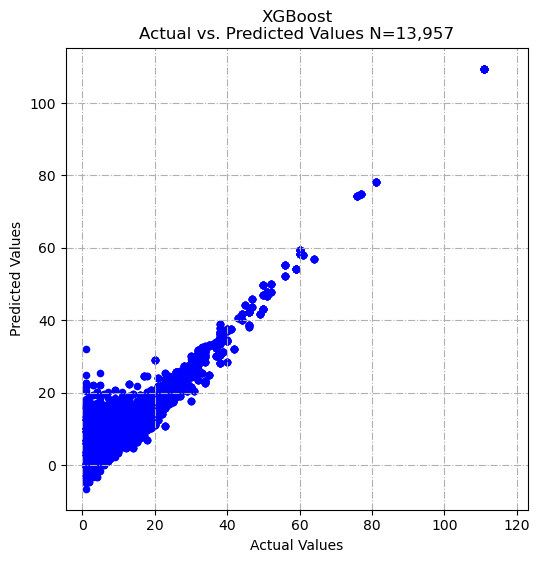

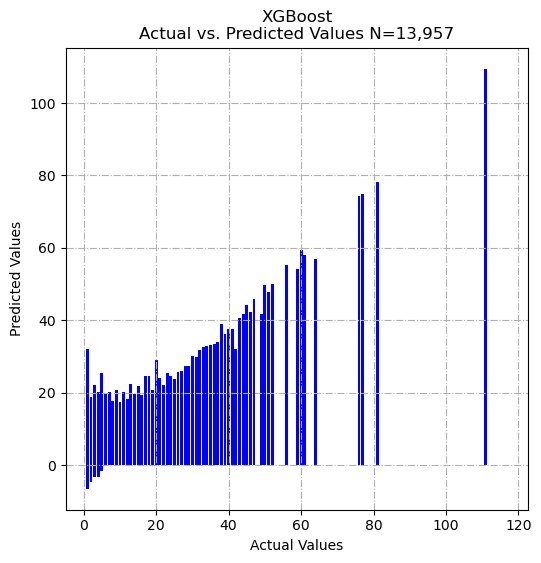

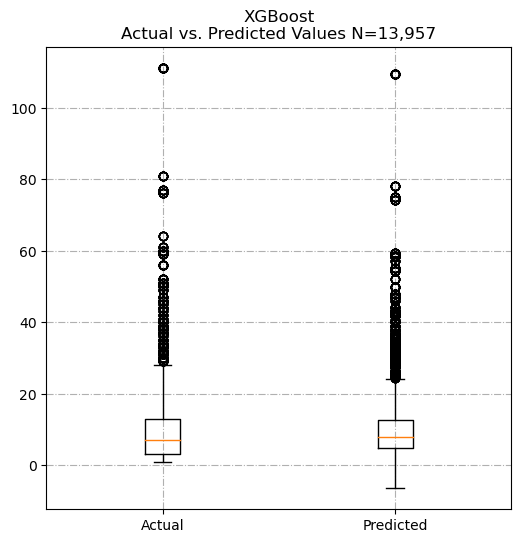

In [489]:
for graph_type in ("scatter", "bar", "boxplot"):
    plot_predictions_vs_actuals(y_test, y_XGB_pred, 
    title=f"XGBoost\nActual vs. Predicted Values {N=:,}", graph_type=graph_type)

# K-Nearest Neighbors (KNN) for Regression

In [490]:
from sklearn.neighbors import KNeighborsRegressor

n_neighbors = 5  # You can adjust this parameter
knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
knn_model.fit(X_train, y_train)

y_KNN_pred = knn_model.predict(X_test)



KNeighborsRegressor()

In [491]:
# Example using cross-validation for hyperparameter tuning
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': [3, 5, 7, 9]}
grid_search = GridSearchCV(KNeighborsRegressor(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_knn_model = grid_search.best_estimator_


GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': [3, 5, 7, 9]})

In [492]:
mae, mse, rmse, r_squared = perf_metrics(y_test, y_KNN_pred) 
#["Model", "MAE", "MSE", "RMSE", "R Squared"]
record = ["K-Nearest Neighbors", mae, mse, rmse, r_squared]
record


['K-Nearest Neighbors',
 1.1041771154259512,
 8.261038905208855,
 2.8742023076340426,
 0.9344712430309132]

In [493]:
append_to_summary(record)
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413
2,Poisson,7.080683,113.354951,10.646828,0.100838
3,Negative Binomial,7.105969,117.724917,10.850111,0.100472
4,Lasso (L1 Regularization),7.129611,114.580199,10.704214,0.091119
5,Ridge (L2 Regularization),7.130368,114.584344,10.704408,0.091087
6,XGBoost,2.837532,13.959750,3.736275,0.889268
7,K-Nearest Neighbors,1.104177,8.261039,2.874202,0.934471


In [494]:
plot_predictions_vs_actuals.__annotations__

{'actual': typing.Union[typing.Sequence[float], numpy.ndarray, pandas.core.series.Series],
 'predicted': typing.Union[typing.Sequence[float], numpy.ndarray, pandas.core.series.Series],
 'graph_type': typing.Optional[str],
 'annotate': typing.Optional[bool],
 'annotation_fontsize': typing.Union[int, float],
 'max_annotations': typing.Optional[int],
 'figsize': typing.Union[typing.Tuple[typing.Union[int, float], typing.Union[int, float]], typing.List[typing.Union[int, float]]],
 'color': typing.Optional[str],
 'alpha': typing.Union[int, float],
 'marker_size': typing.Optional[int],
 'show_legend': typing.Optional[bool],
 'title': typing.Optional[str],
 'grid_style': typing.Optional[str],
 'return': None}

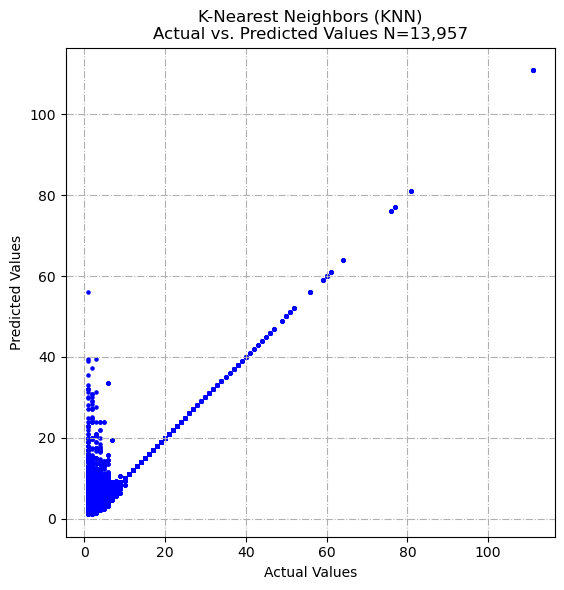

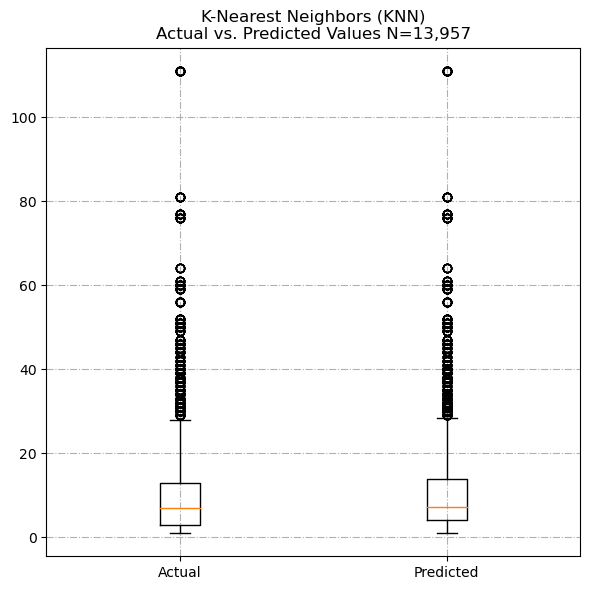

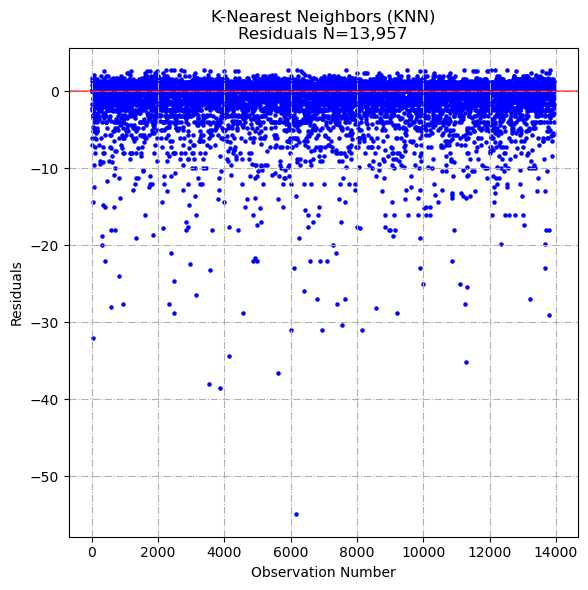

In [495]:
for graph_type in ("scatter", "boxplot"):
    plot_predictions_vs_actuals(y_test, y_KNN_pred, 
    title=f"K-Nearest Neighbors (KNN)\nActual vs. Predicted Values {N=:,}",
    graph_type=graph_type,
    marker_size=5,
    )
    plt.tight_layout()
    plt.savefig("tempKNN" + graph_type + ".png")
    
for graph_type in (["residuals"]):
    plot_predictions_vs_actuals(y_test, y_KNN_pred, 
    title=f"K-Nearest Neighbors (KNN)\nResiduals {N=:,}",
    graph_type=graph_type,
    marker_size=5,              
    )
    plt.tight_layout()
    plt.savefig("tempKNNResiduals.png")
    

In [496]:
#NNNN

C:\Users\sabde\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



p_value=0.000 <= alpha=0.05 ==> Residuals are not normally distributed.


(-15.0, 15.0)

<Figure size 600x600 with 0 Axes>

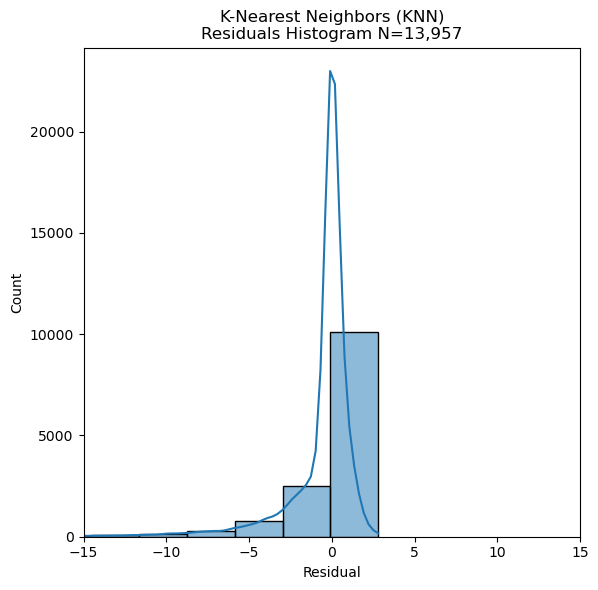

In [497]:
plot_predictions_vs_actuals(
    y_test,
    y_KNN_pred,
    title=f"K-Nearest Neighbors (KNN)\nResiduals Histogram {N=:,}",
    marker_size=2,
    alpha=0.5,
    graph_type= "residuals_histogram"
)

plt.tight_layout()
plt.xlim(-15,15)
plt.savefig("tempKNNResidualsHistogram.png")


In [498]:
summary_df.to_csv("Property Clicks Model Summary Data.csv")

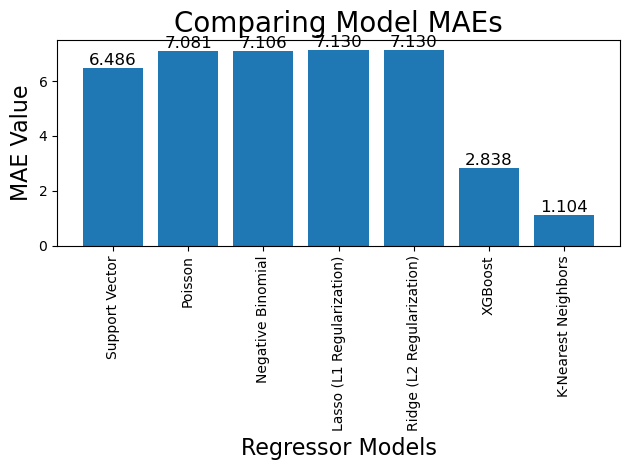

In [499]:
selectedModels_df = summary_df[summary_df["Model"] != "Random Forest Regression"]
plt.bar(selectedModels_df["Model"], selectedModels_df["MAE"])
plt.title("Comparing Model MAEs", fontsize=20)
plt.ylabel("MAE Value", fontsize=16)
plt.xticks(rotation=90)
plt.xlabel("Regressor Models",fontsize=16)
# Annotate the top of each bar with the corresponding values
spacing = 0  # Adjust the spacing as needed
for i, value in enumerate(selectedModels_df["MAE"]):
    plt.text(i, value + spacing, f"{value:.3f}", ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.savefig("tempMAEs.png")
plt.savefig("tempMAEs.jpeg")
    
plt.show();

In [500]:
selectedModels_df["Model"]

1               Support Vector
2                      Poisson
3            Negative Binomial
4    Lasso (L1 Regularization)
5    Ridge (L2 Regularization)
6                      XGBoost
7          K-Nearest Neighbors
Name: Model, dtype: object

In [501]:
selectedModels_df["MAE"]

1    6.486087
2    7.080683
3    7.105969
4    7.129611
5    7.130368
6    2.837532
7    1.104177
Name: MAE, dtype: float64

In [514]:
selectedModels_dict = dict(zip(selectedModels_df["Model"], selectedModels_df["MAE"]))

# Sort the dictionary items by values
selectedModels_dict = dict(sorted(selectedModels_dict.items(), key=lambda x: x[1]))

# Round values to 2 decimal places
selectedModels_dict = {key: round(value, 3) for key, value in selectedModels_dict.items()}

selectedModels_dict

{'K-Nearest Neighbors': 1.104,
 'XGBoost': 2.838,
 'Support Vector': 6.486,
 'Poisson': 7.081,
 'Negative Binomial': 7.106,
 'Lasso (L1 Regularization)': 7.13,
 'Ridge (L2 Regularization)': 7.13}

In [503]:
ed_data_viz.plot_bar_categorical.__annotations__

{'category_value_dict': dict,
 'title': typing.Optional[str],
 'xlabel': typing.Optional[str],
 'ylabel_on_left': typing.Optional[str],
 'ylabel_on_right': typing.Optional[str],
 'xtick_rotation': typing.Optional[int],
 'figsize': typing.Optional[typing.Tuple[int, int]],
 'fontsize_top_of_bar': typing.Optional[int],
 'y_ticks_on_left_counts': typing.Optional[bool],
 'y_ticks_on_right_percentage': typing.Optional[bool],
 'bar_annotation_type': typing.Optional[str],
 'color': typing.Optional[str],
 'alpha': typing.Optional[float],
 'total': typing.Optional[int],
 'file_path': typing.Optional[str],
 'return': None}

Saving file 'tempMAEs.png'


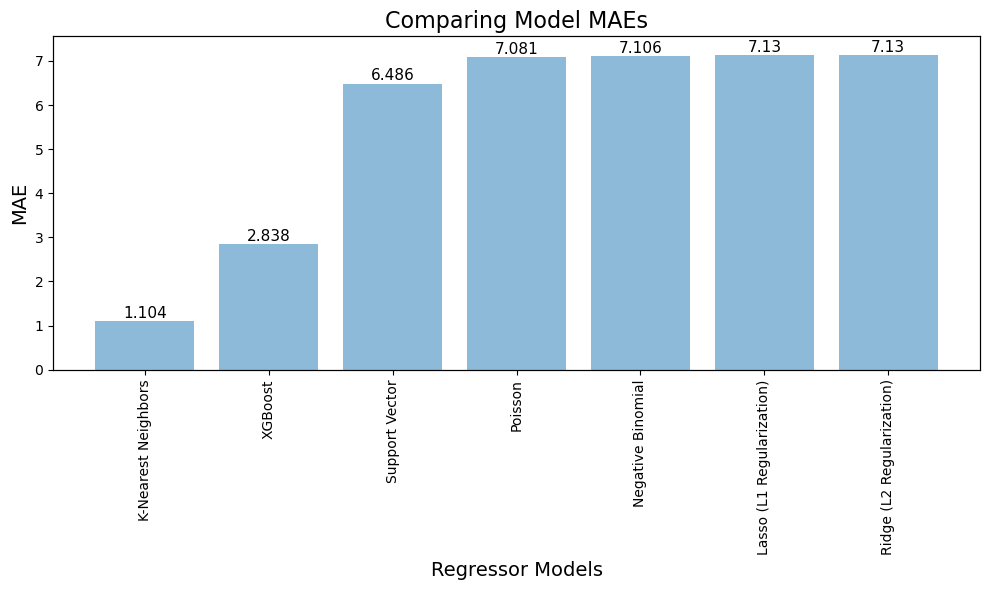

In [515]:
ed_data_viz.plot_bar_categorical(
    selectedModels_dict,
    title="Comparing Model MAEs",
    ylabel_on_left="MAE",
    xlabel="Regressor Models",
    ylabel_on_right="",
    y_ticks_on_right_percentage="",
    bar_annotation_type="count",
    xtick_rotation=90,
    file_path="tempMAEs.png"  
)



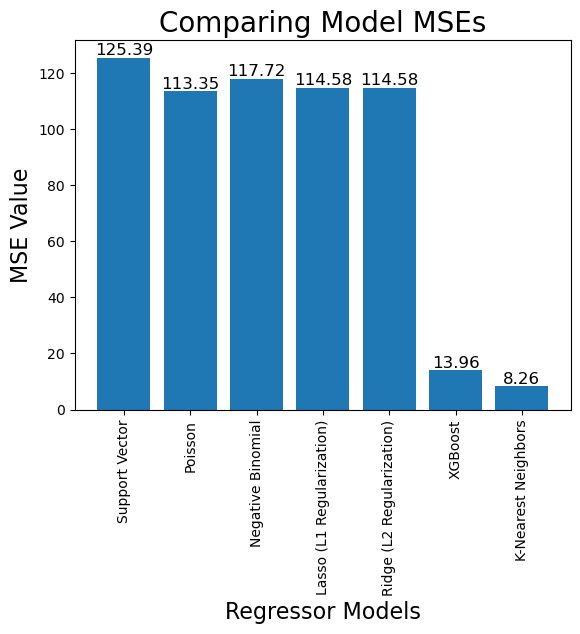

In [505]:
selectedModels_df = summary_df[summary_df["Model"] != "Random Forest Regression"]
plt.bar(selectedModels_df["Model"], selectedModels_df["MSE"])
plt.title("Comparing Model MSEs", fontsize=20)
plt.ylabel("MSE Value", fontsize=16)
plt.xticks(rotation=90)
plt.xlabel("Regressor Models",fontsize=16)
# Annotate the top of each bar with the corresponding values
spacing = 0  # Adjust the spacing as needed
for i, value in enumerate(selectedModels_df["MSE"]):
    plt.text(i, value + spacing, f"{value:.2f}", ha='center', va='bottom', fontsize=12)

plt.show();

In [516]:
selectedModels_dict = dict(zip(selectedModels_df["Model"], selectedModels_df["MSE"]))

# Sort the dictionary items by values
selectedModels_dict = dict(sorted(selectedModels_dict.items(), key=lambda x: x[1]))

# Round values to 2 decimal places
selectedModels_dict = {key: round(value, 3) for key, value in selectedModels_dict.items()}

selectedModels_dict

{'K-Nearest Neighbors': 8.261,
 'XGBoost': 13.96,
 'Poisson': 113.355,
 'Lasso (L1 Regularization)': 114.58,
 'Ridge (L2 Regularization)': 114.584,
 'Negative Binomial': 117.725,
 'Support Vector': 125.385}

Saving file 'tempMSEs.png'


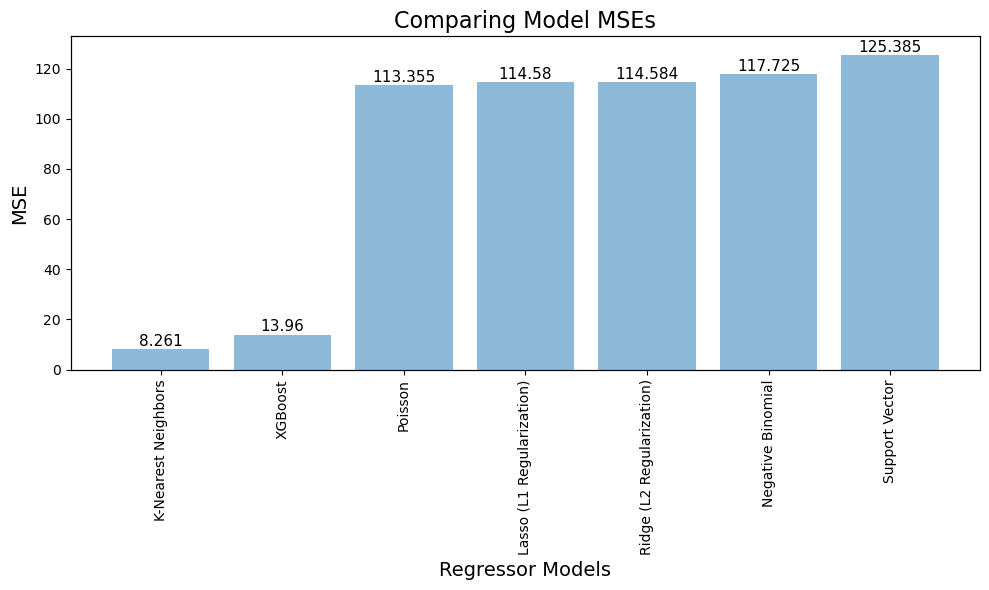

In [517]:
ed_data_viz.plot_bar_categorical(
    selectedModels_dict,
    title="Comparing Model MSEs",
    ylabel_on_left="MSE",
    xlabel="Regressor Models",
    ylabel_on_right="",
    y_ticks_on_right_percentage="",
    bar_annotation_type="count",
    xtick_rotation=90,
    file_path="tempMSEs.png"  
)





In [508]:
summary_df

,Model,MAE,MSE,RMSE,R Squared
0,Random Forest Regression,0.450434,1.763360,1.327916,0.986013
1,Support Vector,6.486087,125.385017,11.197545,0.005413
2,Poisson,7.080683,113.354951,10.646828,0.100838
3,Negative Binomial,7.105969,117.724917,10.850111,0.100472
4,Lasso (L1 Regularization),7.129611,114.580199,10.704214,0.091119
5,Ridge (L2 Regularization),7.130368,114.584344,10.704408,0.091087
6,XGBoost,2.837532,13.959750,3.736275,0.889268
7,K-Nearest Neighbors,1.104177,8.261039,2.874202,0.934471


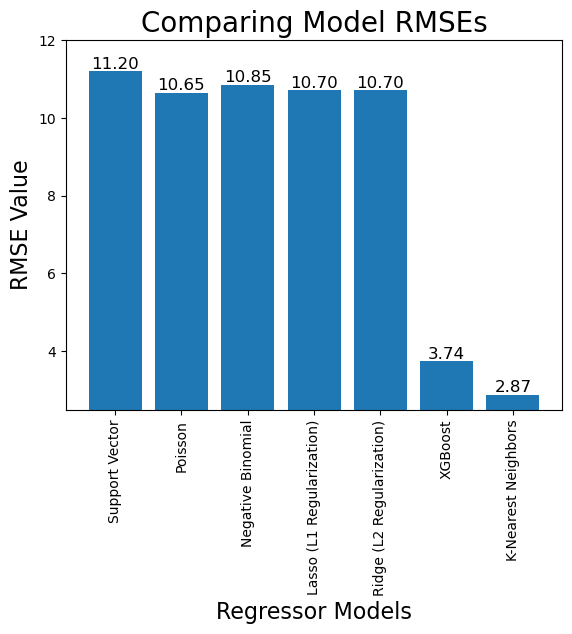

In [509]:
selectedModels_df = summary_df[summary_df["Model"] != "Random Forest Regression"]
plt.bar(selectedModels_df["Model"], selectedModels_df["RMSE"])
plt.title("Comparing Model RMSEs", fontsize=20)
plt.ylabel("RMSE Value", fontsize=16)
plt.xticks(rotation=90)
plt.xlabel("Regressor Models",fontsize=16)
# Annotate the top of each bar with the corresponding values
spacing = 0  # Adjust the spacing as needed
for i, value in enumerate(selectedModels_df["RMSE"]):
    plt.text(i, value + spacing, f"{value:.2f}", ha='center', va='bottom', fontsize=12)

plt.ylim(2.5, 12)
plt.show();

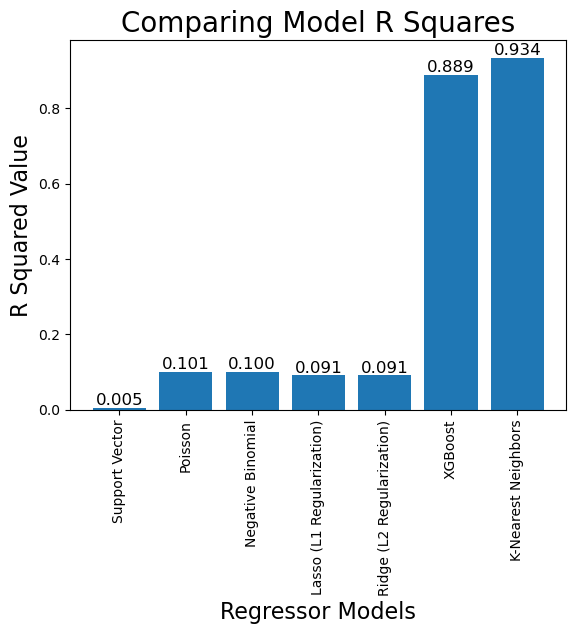

In [510]:
selectedModels_df = summary_df[summary_df["Model"] != "Random Forest Regression"]
plt.bar(selectedModels_df["Model"], selectedModels_df["R Squared"])
plt.title("Comparing Model R Squares", fontsize=20)
plt.ylabel("R Squared Value", fontsize=16)
plt.xticks(rotation=90)
plt.xlabel("Regressor Models",fontsize=16)
# Annotate the top of each bar with the corresponding values
spacing = 0  # Adjust the spacing as needed
for i, value in enumerate(selectedModels_df["R Squared"]):
    plt.text(i, value + spacing, f"{value:.3f}", ha='center', va='bottom', fontsize=12)

plt.show();

In [518]:
selectedModels_dict = dict(zip(selectedModels_df["Model"], selectedModels_df["R Squared"]))

# Sort the dictionary items by values
selectedModels_dict = dict(sorted(selectedModels_dict.items(), key=lambda x: x[1], reverse=True))

# Round values to 2 decimal places
selectedModels_dict = {key: round(value, 3) for key, value in selectedModels_dict.items()}

selectedModels_dict

{'K-Nearest Neighbors': 0.934,
 'XGBoost': 0.889,
 'Poisson': 0.101,
 'Negative Binomial': 0.1,
 'Lasso (L1 Regularization)': 0.091,
 'Ridge (L2 Regularization)': 0.091,
 'Support Vector': 0.005}

Saving file 'tempRSquares.png'


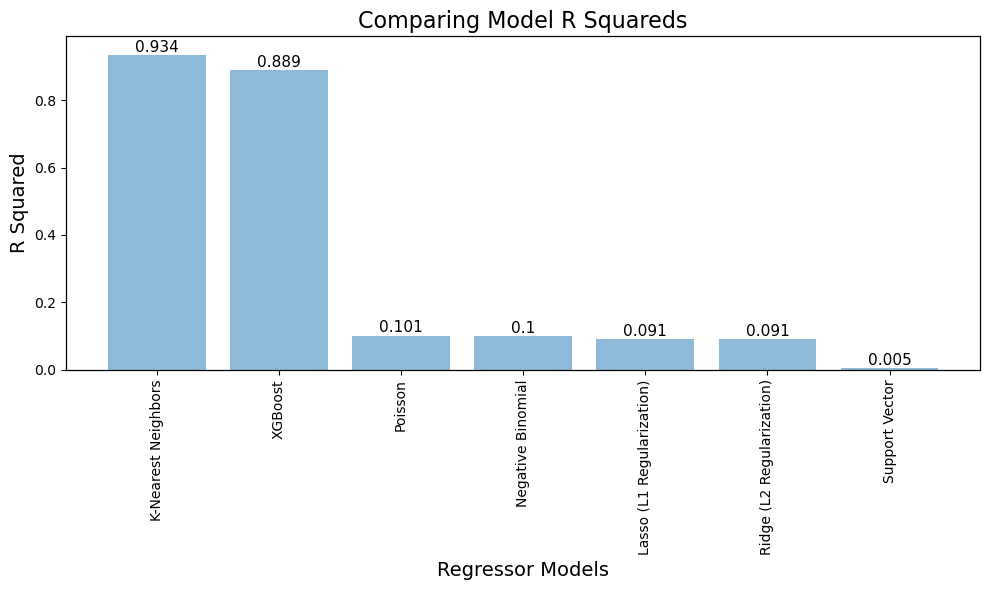

In [521]:
ed_data_viz.plot_bar_categorical(
    selectedModels_dict,
    title="Comparing Model R Squareds",
    ylabel_on_left="R Squared",
    xlabel="Regressor Models",
    ylabel_on_right="",
    y_ticks_on_right_percentage="",
    bar_annotation_type="count",
    xtick_rotation=90,
    file_path="tempRSquares.png"  
)





| Metric                               | Description                                                  | Range            | Ideal Value      | Sensitivity to Outliers  |
|---------------------------------------|--------------------------------------------------------------|------------------|------------------|--------------------------|
| **Mean Absolute Error (MAE)**         | Average of absolute differences between predicted and actual  | 0 to +∞          | 0 (lower is better)| Moderate                 |
| **Mean Squared Error (MSE)**          | Average of squared differences between predicted and actual   | 0 to +∞          | 0 (lower is better)| Sensitive                |
| **Root Mean Squared Error (RMSE)**    | Square root of MSE                                          | 0 to +∞          | 0 (lower is better)| Sensitive                |
| **R-squared (R2) Score**              | Proportion of variance in dependent variable explained       | 0 to 1           | 1 (higher is better)| -                        |
| **Mean Absolute Percentage Error (MAPE)** | Average percentage difference between predicted and actual | 0% to +∞         | 0% (lower is better)| Sensitive                |
| **Mean Squared Logarithmic Error (MSLE)** | Mean squared logarithmic difference between predicted and actual | 0 to +∞        | 0 (lower is better)| Sensitive (log scale)    |
| **Huber Loss**                        | Combination of MSE and MAE, less sensitive to outliers       | 0 to +∞          | 0 (lower is better)| Moderate                 |
| **Median Absolute Error (MedAE or MAD)** | Median of absolute differences between predicted and actual  | 0 to +∞          | 0 (lower is better)| Robust                   |
| **Explained Variance Score**          | Proportion of variance explained by the model                | 0 to 1           | 1 (higher is better)| -                        |
| **Fraction of Variance Unexplained (FVU)** | Complementary to R-squared, fraction of variance not explained | 0 to 1         | 0 (lower is better)| -                        |
| **Theil's U Statistic**               | Ratio of RMSE to standard deviation of actual values         | 0 to +∞          | 0 (lower is better)| Moderate                 |
| **Cohen's Kappa**                     | Agreement between predicted and actual values (adapted for regression) | -1 to 1      | 1 (higher is better)| -                        |
